#**Introduction**

In [ ]:
# Cài đặt các thư viện
!pip install feature_engine
!pip install catboost
!pip install xgboost
!pip install scikit-learn==1.2.2
!pip install scipy
!pip install imbalanced-learn
!pip install keras==2.12.0

# Import các gói thư viện cần thiết
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings
import gc
import joblib
import re
import tensorflow as tf
from datetime import datetime
from collections import Counter

# sklearn và các mô-đun liên quan
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score, RepeatedStratifiedKFold, GridSearchCV, KFold
from sklearn.linear_model import LogisticRegression, PassiveAggressiveClassifier, RidgeClassifier, SGDClassifier
from sklearn.naive_bayes import GaussianNB, BernoulliNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC, NuSVC
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, AdaBoostClassifier, GradientBoostingClassifier, HistGradientBoostingClassifier, BaggingClassifier, VotingClassifier, StackingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, PrecisionRecallDisplay, RocCurveDisplay, roc_curve, precision_recall_curve, auc, average_precision_score
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectKBest, SelectPercentile, SelectFromModel, chi2, RFE, SequentialFeatureSelector, RFECV
from sklearn.model_selection import cross_validate
from sklearn.pipeline import Pipeline

# feature_engine và imblearn
from feature_engine.outliers import Winsorizer
from feature_engine.selection import DropConstantFeatures, DropCorrelatedFeatures, DropDuplicateFeatures
from imblearn.over_sampling import SMOTE, BorderlineSMOTE

# TensorFlow và Keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier

# CatBoost và XGBoost
from catboost import CatBoostClassifier
from xgboost import XGBClassifier

# MISC
from scipy.stats import norm, probplot
from yellowbrick.classifier import ClassPredictionError

# Cấu hình cảnh báo
warnings.filterwarnings('ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 344.3/344.3 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 28.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 54.7 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.2.2
    Uninstalling scikit-learn-1.2.2:
      Successfully uninstalled scikit-learn-1.2.2
  Attempting uninstall: pandas
    Found existing installation: pandas 2.0.3
    Uninstalling pandas-2.0.3:
      Successfully uninstalled pandas-2.0.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires pandas==2.0.3, but you have pandas 2.2.2 which is incompatible.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.2/98.2 MB 9.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.6/9.6 MB 10.2 MB/s eta 0:00:00
  

In [ ]:
# to reproduce same results every time we run the code
import random as python_random

np.random.seed(123)
python_random.seed(123)
tf.random.set_seed(1234)

#**Load data**

In [ ]:
df = pd.read_csv('/content/bankruptcy_data.csv')
df.head()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,...,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,...,0.795297,0.008323,0.623652,0.610237,0.839969,0.283846,0.264577,0.570175,1,0.020794
2,1,0.426071,0.499019,0.472295,0.601450,0.601364,0.998857,0.796403,0.808388,0.302035,...,0.774670,0.040003,0.623841,0.601449,0.836774,0.290189,0.026555,0.563706,1,0.016474
3,1,0.399844,0.451265,0.457733,0.583541,0.583541,0.998700,0.796967,0.808966,0.303350,...,0.739555,0.003252,0.622929,0.583538,0.834697,0.281721,0.026697,0.564663,1,0.023982
4,1,0.465022,0.538432,0.522298,0.598783,0.598783,0.998973,0.797366,0.809304,0.303475,...,0.795016,0.003878,0.623521,0.598782,0.839973,0.278514,0.024752,0.575617,1,0.035490


In [ ]:
df.describe()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
count,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,...,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.0,6819.000000
mean,0.032263,0.505180,0.558625,0.553589,0.607948,0.607929,0.998755,0.797190,0.809084,0.303623,...,0.807760,1.862942e+07,0.623915,0.607946,0.840402,0.280365,0.027541,0.565358,1.0,0.047578
std,0.176710,0.060686,0.065620,0.061595,0.016934,0.016916,0.013010,0.012869,0.013601,0.011163,...,0.040332,3.764501e+08,0.012290,0.016934,0.014523,0.014463,0.015668,0.013214,0.0,0.050014
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.000000
25%,0.000000,0.476527,0.535543,0.527277,0.600445,0.600434,0.998969,0.797386,0.809312,0.303466,...,0.796750,9.036205e-04,0.623636,0.600443,0.840115,0.276944,0.026791,0.565158,1.0,0.024477
50%,0.000000,0.502706,0.559802,0.552278,0.605997,0.605976,0.999022,0.797464,0.809375,0.303525,...,0.810619,2.085213e-03,0.623879,0.605998,0.841179,0.278778,0.026808,0.565252,1.0,0.033798
75%,0.000000,0.535563,0.589157,0.584105,0.613914,0.613842,0.999095,0.797579,0.809469,0.303585,...,0.826455,5.269777e-03,0.624168,0.613913,0.842357,0.281449,0.026913,0.565725,1.0,0.052838
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,9.820000e+09,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,1.000000


In [ ]:
df.isnull().sum()

Bankrupt?                                                   0
 ROA(C) before interest and depreciation before interest    0
 ROA(A) before interest and % after tax                     0
 ROA(B) before interest and depreciation after tax          0
 Operating Gross Margin                                     0
                                                           ..
 Liability to Equity                                        0
 Degree of Financial Leverage (DFL)                         0
 Interest Coverage Ratio (Interest expense to EBIT)         0
 Net Income Flag                                            0
 Equity to Liability                                        0
Length: 96, dtype: int64

In [ ]:
df.duplicated().sum()

0

In [ ]:
df.describe()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
count,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,...,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.0,6819.000000
mean,0.032263,0.505180,0.558625,0.553589,0.607948,0.607929,0.998755,0.797190,0.809084,0.303623,...,0.807760,1.862942e+07,0.623915,0.607946,0.840402,0.280365,0.027541,0.565358,1.0,0.047578
std,0.176710,0.060686,0.065620,0.061595,0.016934,0.016916,0.013010,0.012869,0.013601,0.011163,...,0.040332,3.764501e+08,0.012290,0.016934,0.014523,0.014463,0.015668,0.013214,0.0,0.050014
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.000000
25%,0.000000,0.476527,0.535543,0.527277,0.600445,0.600434,0.998969,0.797386,0.809312,0.303466,...,0.796750,9.036205e-04,0.623636,0.600443,0.840115,0.276944,0.026791,0.565158,1.0,0.024477
50%,0.000000,0.502706,0.559802,0.552278,0.605997,0.605976,0.999022,0.797464,0.809375,0.303525,...,0.810619,2.085213e-03,0.623879,0.605998,0.841179,0.278778,0.026808,0.565252,1.0,0.033798
75%,0.000000,0.535563,0.589157,0.584105,0.613914,0.613842,0.999095,0.797579,0.809469,0.303585,...,0.826455,5.269777e-03,0.624168,0.613913,0.842357,0.281449,0.026913,0.565725,1.0,0.052838
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,9.820000e+09,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,1.000000


#**EDA & Preprocessing**

In [ ]:
print(df['Bankrupt?'].value_counts())
print('-'* 30)
print('Financially stable: ', round(df['Bankrupt?'].value_counts()[0]/len(df) * 100,2), '% of the dataset')
print('Financially unstable: ', round(df['Bankrupt?'].value_counts()[1]/len(df) * 100,2), '% of the dataset')

Bankrupt?
0    6599
1     220
Name: count, dtype: int64
------------------------------
Financially stable:  96.77 % of the dataset
Financially unstable:  3.23 % of the dataset


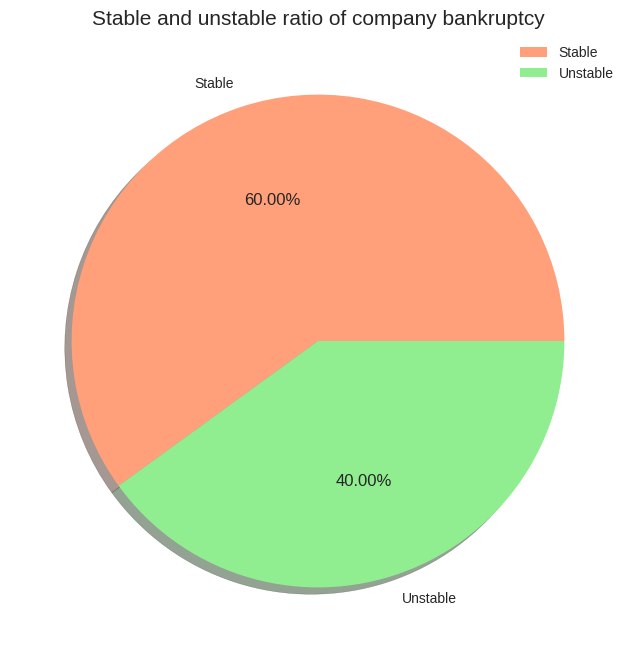

In [ ]:
size = [60, 40]
labels = ['Stable', 'Unstable']
colors = ['#FFA07A', '#90EE90']

figure, axes = plt.subplots(figsize=(10, 8))
axes.pie(size, labels=labels, colors=colors, shadow=True, autopct='%1.2f%%')
plt.legend()
plt.title("Stable and unstable ratio of company bankruptcy", size=15)
plt.show()

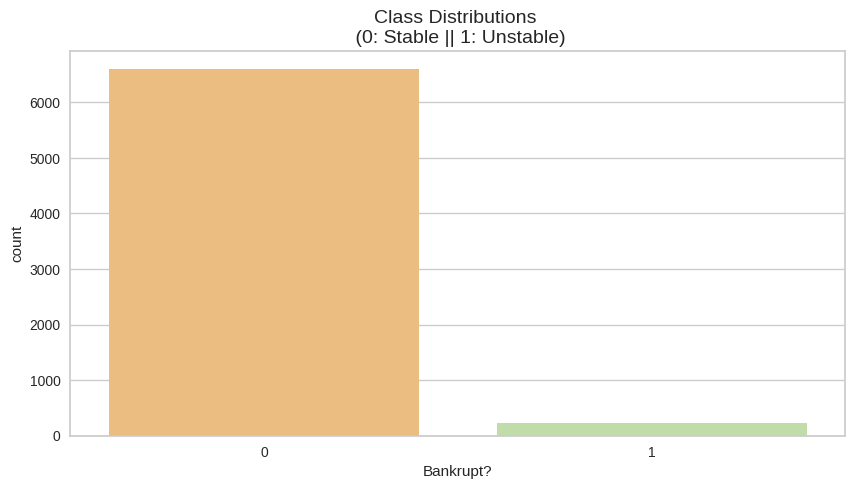

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(x=df['Bankrupt?'], palette='Spectral')
plt.title('Class Distributions \n (0: Stable || 1: Unstable)', fontsize=14)
plt.show()

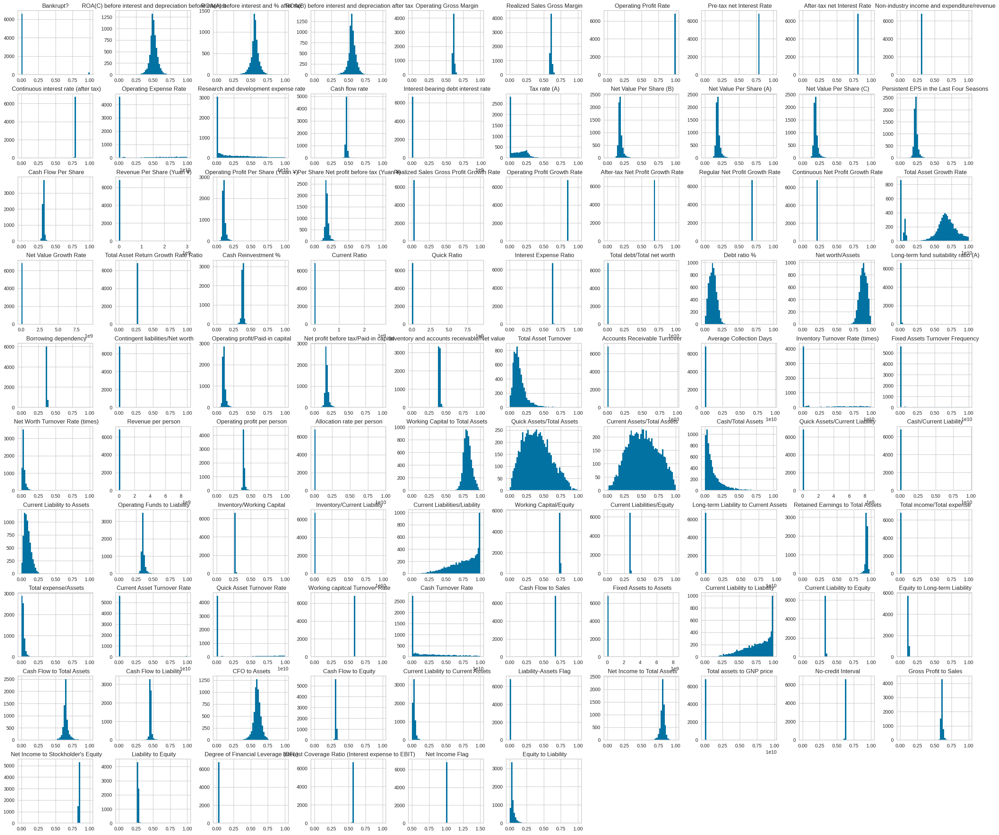

In [ ]:
df.hist(figsize = (35,30), bins = 50)
plt.show()

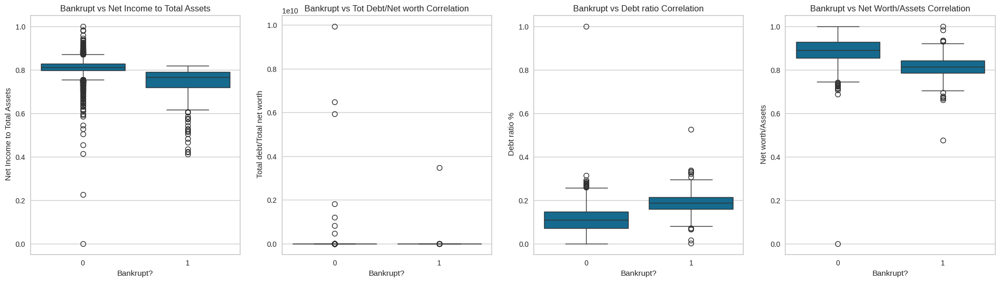

In [ ]:
f, axes = plt.subplots(ncols=4, figsize=(24,6))

sns.boxplot(x='Bankrupt?', y=" Net Income to Total Assets", data=df, ax=axes[0])
axes[0].set_title('Bankrupt vs Net Income to Total Assets')

sns.boxplot(x='Bankrupt?', y=" Total debt/Total net worth", data=df, ax=axes[1])
axes[1].set_title('Bankrupt vs Tot Debt/Net worth Correlation')


sns.boxplot(x='Bankrupt?', y=" Debt ratio %", data=df, ax=axes[2])
axes[2].set_title('Bankrupt vs Debt ratio Correlation')


sns.boxplot(x='Bankrupt?', y=" Net worth/Assets", data=df, ax=axes[3])
axes[3].set_title('Bankrupt vs Net Worth/Assets Correlation')

plt.show()

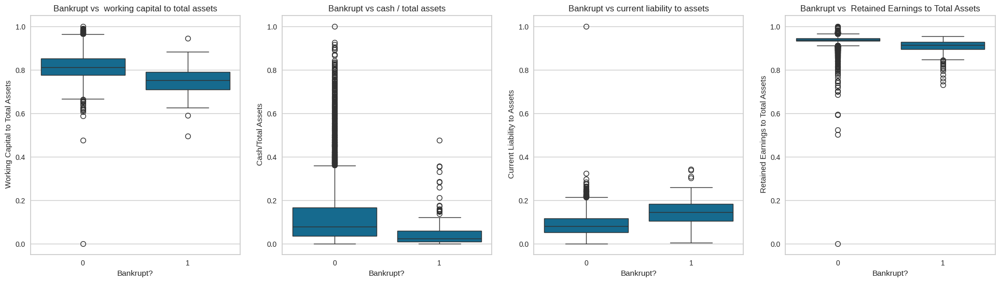

In [ ]:
f, axes = plt.subplots(ncols=4, figsize=(24,6))

sns.boxplot(x='Bankrupt?', y=" Working Capital to Total Assets", data=df, ax=axes[0])
axes[0].set_title('Bankrupt vs  working capital to total assets')

sns.boxplot(x='Bankrupt?', y=" Cash/Total Assets", data=df, ax=axes[1])
axes[1].set_title('Bankrupt vs cash / total assets')


sns.boxplot(x='Bankrupt?', y=" Current Liability to Assets", data=df, ax=axes[2])
axes[2].set_title('Bankrupt vs current liability to assets')


sns.boxplot(x='Bankrupt?', y=" Retained Earnings to Total Assets", data=df, ax=axes[3])
axes[3].set_title('Bankrupt vs  Retained Earnings to Total Assets')

plt.show()

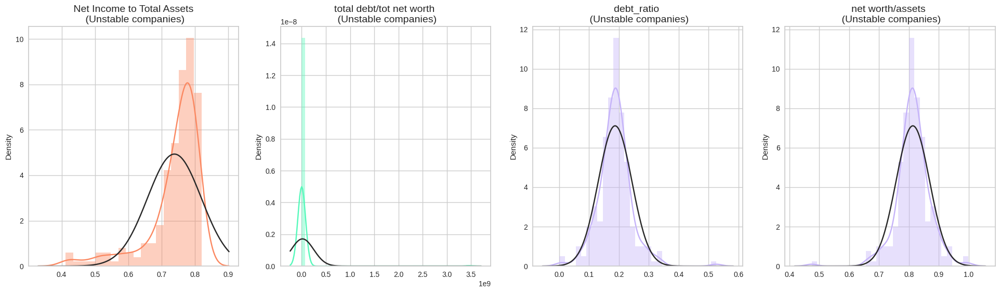

In [ ]:
f, (ax1, ax2, ax3, ax4) = plt.subplots(1,4, figsize=(24, 6))

cash_flow_rate = df[' Net Income to Total Assets'].loc[df['Bankrupt?'] == 1].values
sns.distplot(cash_flow_rate,ax=ax1, fit=norm, color='#FB8861')
ax1.set_title(' Net Income to Total Assets \n (Unstable companies)', fontsize=14)

tot_debt_net = df[' Total debt/Total net worth'].loc[df['Bankrupt?'] == 1].values
sns.distplot(tot_debt_net ,ax=ax2, fit=norm, color='#56F9BB')
ax2.set_title('total debt/tot net worth \n (Unstable companies)', fontsize=14)


debt_ratio = df[' Debt ratio %'].loc[df['Bankrupt?'] == 1].values
sns.distplot(debt_ratio,ax=ax3, fit=norm, color='#C5B3F9')
ax3.set_title('debt_ratio \n (Unstable companies)', fontsize=14)

net_worth_assets = df[' Net worth/Assets'].loc[df['Bankrupt?'] == 1].values
sns.distplot(net_worth_assets,ax=ax4, fit=norm, color='#C5B3F9')
ax4.set_title('net worth/assets \n (Unstable companies)', fontsize=14)

plt.show()

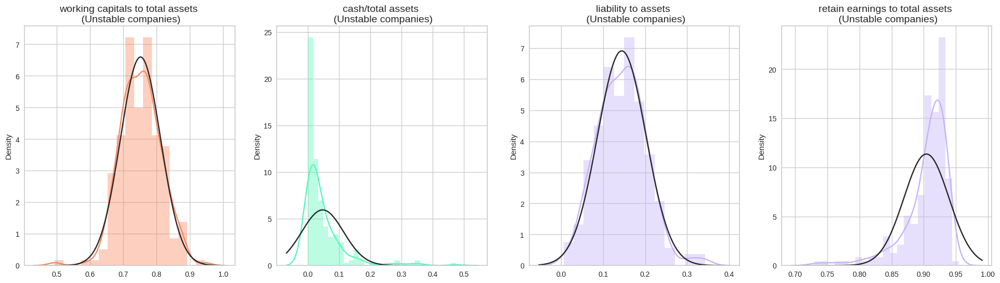

In [ ]:
f, (ax1, ax2, ax3, ax4) = plt.subplots(1,4, figsize=(24, 6))

working_cap = df[' Working Capital to Total Assets'].loc[df['Bankrupt?'] == 1].values
sns.distplot(working_cap,ax=ax1, fit=norm, color='#FB8861')
ax1.set_title('working capitals to total assets \n (Unstable companies)', fontsize=14)

cash_tot_assets = df[' Cash/Total Assets'].loc[df['Bankrupt?'] == 1].values
sns.distplot(cash_tot_assets ,ax=ax2, fit=norm, color='#56F9BB')
ax2.set_title('cash/total assets \n (Unstable companies)', fontsize=14)


asset_liab = df[' Current Liability to Assets'].loc[df['Bankrupt?'] == 1].values
sns.distplot(asset_liab,ax=ax3, fit=norm, color='#C5B3F9')
ax3.set_title('liability to assets \n (Unstable companies)', fontsize=14)

operating_funds = df[' Retained Earnings to Total Assets'].loc[df['Bankrupt?'] == 1].values
sns.distplot(operating_funds,ax=ax4, fit=norm, color='#C5B3F9')
ax4.set_title('retain earnings to total assets \n (Unstable companies)', fontsize=14)

plt.show()

In [ ]:
for col in df.drop('Bankrupt?',axis=1).columns:
    print(f"Skewness of {col}:",df[col].skew())
    print(f"Kurtosis of {col}:",df[col].kurtosis())
    plt.figure(figsize=(14,4))
    plt.subplot(131)
    sns.distplot(df[col])
    plt.subplot(132)
    sns.boxplot(df[col])
    plt.subplot(133)
    probplot(df[col],rvalue=True,plot=plt,dist='norm')
    plt.suptitle(col)
    plt.show()
    gc.collect()

###Numerical/categorical split

In [ ]:
num_cols = df.select_dtypes(include=['float64']).columns.tolist()
cat_cols = df.select_dtypes(include=['int64']).columns.tolist()

print(cat_cols)
print(num_cols)

['Bankrupt?', ' Liability-Assets Flag', ' Net Income Flag']
[' ROA(C) before interest and depreciation before interest', ' ROA(A) before interest and % after tax', ' ROA(B) before interest and depreciation after tax', ' Operating Gross Margin', ' Realized Sales Gross Margin', ' Operating Profit Rate', ' Pre-tax net Interest Rate', ' After-tax net Interest Rate', ' Non-industry income and expenditure/revenue', ' Continuous interest rate (after tax)', ' Operating Expense Rate', ' Research and development expense rate', ' Cash flow rate', ' Interest-bearing debt interest rate', ' Tax rate (A)', ' Net Value Per Share (B)', ' Net Value Per Share (A)', ' Net Value Per Share (C)', ' Persistent EPS in the Last Four Seasons', ' Cash Flow Per Share', ' Revenue Per Share (Yuan ¥)', ' Operating Profit Per Share (Yuan ¥)', ' Per Share Net profit before tax (Yuan ¥)', ' Realized Sales Gross Profit Growth Rate', ' Operating Profit Growth Rate', ' After-tax Net Profit Growth Rate', ' Regular Net Profi

####Positive/negative correlation

In [ ]:
positive_corr = df[num_cols].corrwith(df["Bankrupt?"]).sort_values(ascending=False)[:6].index.tolist()
negative_corr = df[num_cols].corrwith(df["Bankrupt?"]).sort_values()[:6].index.tolist()

positive_corr = df[positive_corr + ["Bankrupt?"]].copy()
negative_corr = df[negative_corr + ["Bankrupt?"]].copy()

In [ ]:
from random import randint

colors = sns.color_palette('Spectral', n_colors=10)

def corrbargraph(x_value, y_values, df):
    plt.figure(figsize=(15, 8))
    value = randint(0, len(colors)-1)

    for i, y_val in enumerate(y_values, 1):
        plt.subplot(2, 3, i)
        sns.barplot(x=x_value, y=y_val, data=df, palette=colors)
        plt.tight_layout(pad=0.5)

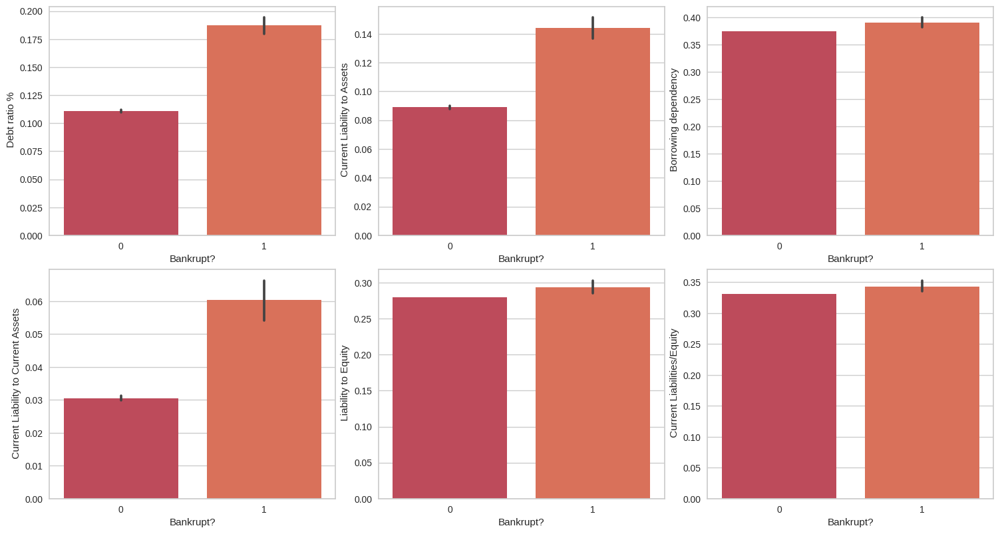

In [ ]:
x_value = positive_corr.columns.tolist()[-1]
y_value = positive_corr.columns.tolist()[:-1]

corrbargraph(x_value, y_value, df)

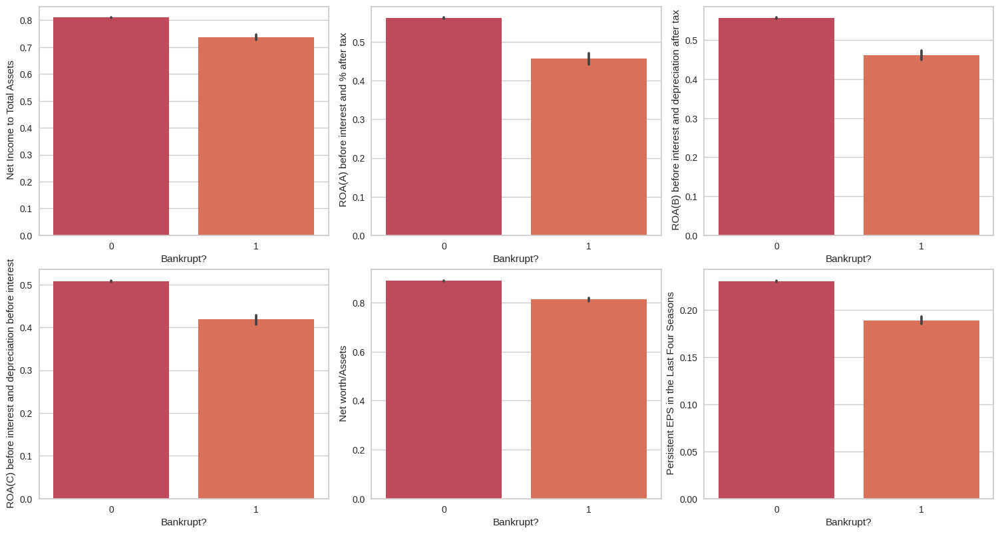

In [ ]:
x_value = negative_corr.columns.tolist()[-1]
y_value = negative_corr.columns.tolist()[:-1]

corrbargraph(x_value, y_value, df)

In [ ]:
print(df.columns)

Index(['Bankrupt?', ' ROA(C) before interest and depreciation before interest',
       ' ROA(A) before interest and % after tax',
       ' ROA(B) before interest and depreciation after tax',
       ' Operating Gross Margin', ' Realized Sales Gross Margin',
       ' Operating Profit Rate', ' Pre-tax net Interest Rate',
       ' After-tax net Interest Rate',
       ' Non-industry income and expenditure/revenue',
       ' Continuous interest rate (after tax)', ' Operating Expense Rate',
       ' Research and development expense rate', ' Cash flow rate',
       ' Interest-bearing debt interest rate', ' Tax rate (A)',
       ' Net Value Per Share (B)', ' Net Value Per Share (A)',
       ' Net Value Per Share (C)', ' Persistent EPS in the Last Four Seasons',
       ' Cash Flow Per Share', ' Revenue Per Share (Yuan ¥)',
       ' Operating Profit Per Share (Yuan ¥)',
       ' Per Share Net profit before tax (Yuan ¥)',
       ' Realized Sales Gross Profit Growth Rate',
       ' Operating Profit

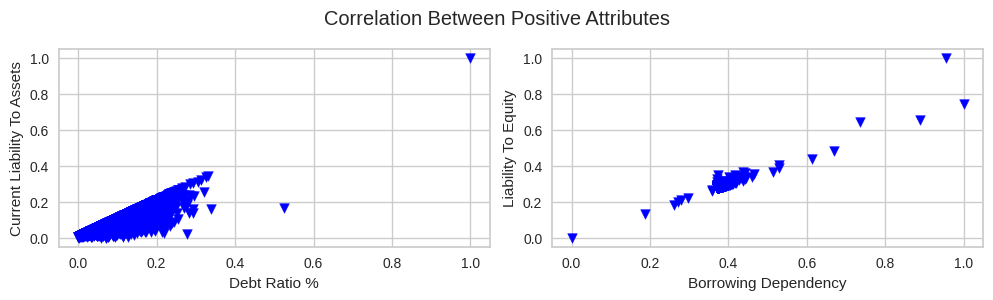

In [ ]:
plt.figure(figsize=(10,3))

# Đặt tiêu đề chính cho biểu đồ
plt.suptitle("Correlation Between Positive Attributes")

# Đặt biểu đồ con cho Debt Ratio
plt.subplot(1,2,1)
plt.xlabel("Debt Ratio %")
plt.ylabel("Current Liability To Assets")
plt.scatter(df[" Debt ratio %"], df[" Current Liability to Assets"], marker='v', color='blue')

# Đặt biểu đồ con cho Borrowing Dependency
plt.subplot(1,2,2)
plt.xlabel("Borrowing Dependency")
plt.ylabel("Liability To Equity")
plt.scatter(df[" Borrowing dependency"], df[" Liability to Equity"], marker='v', color='blue')

# Điều chỉnh layout và hiển thị biểu đồ
plt.tight_layout(pad=0.8)
plt.show()

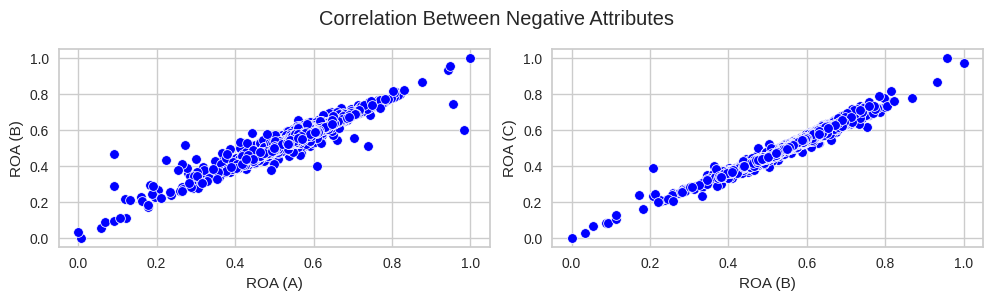

In [ ]:
plt.figure(figsize=(10,3))

plt.suptitle("Correlation Between Negative Attributes")

# Vẽ biểu đồ scatter cho ROA (A) so với ROA (B)
plt.subplot(1, 2, 1)
plt.xlabel("ROA (A)")
plt.ylabel("ROA (B)")
sns.scatterplot(data=df, x=' ROA(A) before interest and % after tax', y=' ROA(B) before interest and depreciation after tax', color='blue')

# Vẽ biểu đồ scatter cho ROA (B) so với ROA (C)
plt.subplot(1, 2, 2)
plt.xlabel("ROA (B)")
plt.ylabel("ROA (C)")
sns.scatterplot(data=df, x=' ROA(B) before interest and depreciation after tax', y=' ROA(C) before interest and depreciation before interest', color='blue')

plt.tight_layout(pad=0.8)
plt.show()

<Axes: >

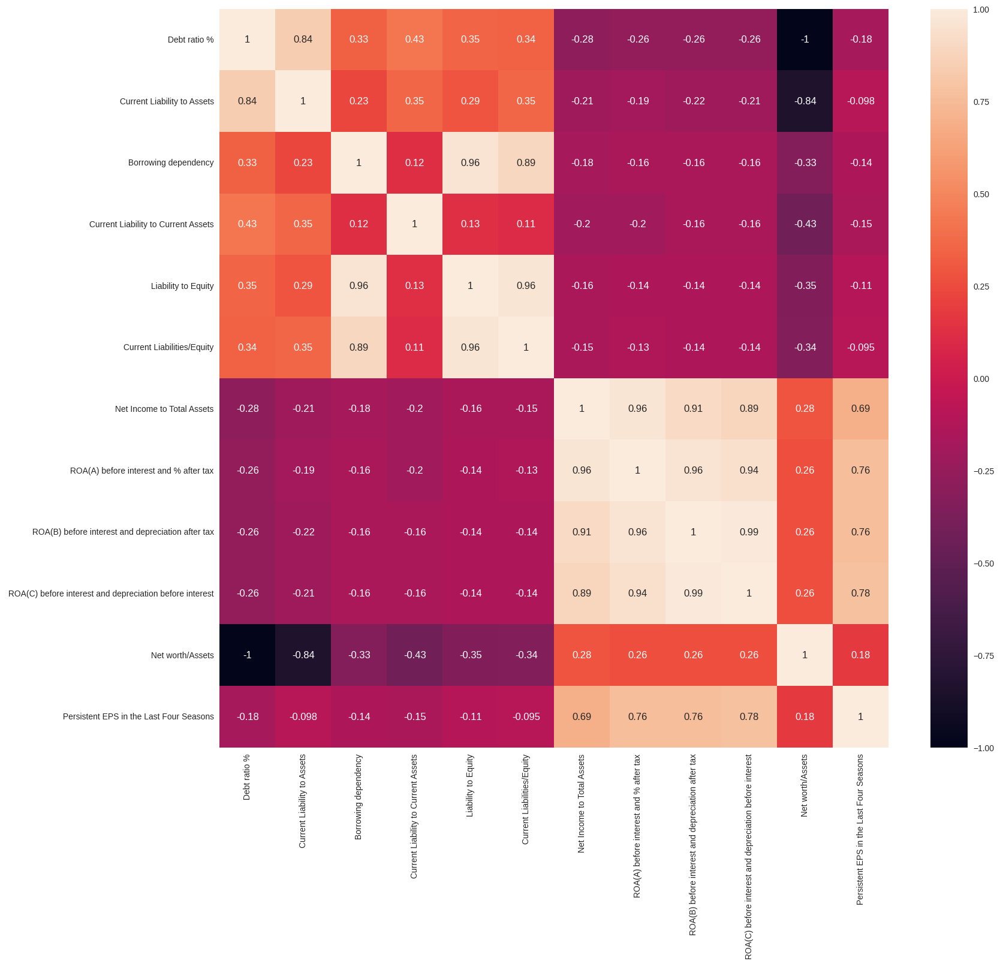

In [ ]:
relation = positive_corr.columns.tolist()[:-1] + negative_corr.columns.tolist()[:-1]
plt.figure(figsize=(18,16))
sns.heatmap(df[relation].corr(),annot=True)

####Unvariate EDA

#####Numerical analysis

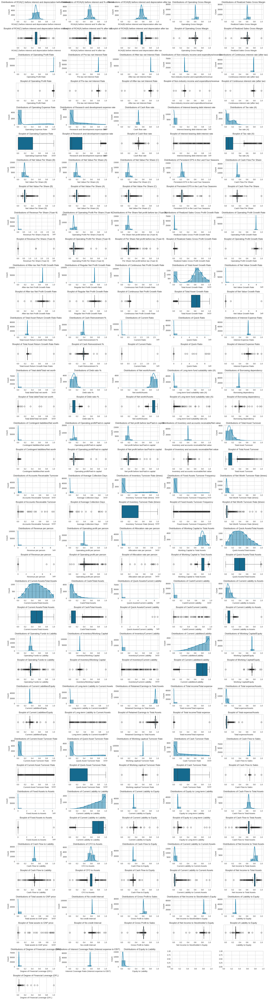

In [ ]:
num_columns = len(num_cols)
ncols = 5
nrows = int(np.ceil(num_columns / ncols)) * 2

fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 4, nrows * 2))

for i, col in enumerate(num_cols):
    row = (i // ncols) * 2
    col_index = i % ncols
    sns.histplot(x=df[col], kde=True, bins=10, ax=axes[row, col_index])
    axes[row, col_index].set_title(f'Distributions of{col}')

    sns.boxplot(x=df[col], ax=axes[row+1, col_index])
    axes[row+1, col_index].set_title(f'Boxplot of{col}')

for ax in axes.flatten()[i * 2 + 2:]:
    ax.set_visible(False)

plt.tight_layout()
plt.show()

#####Categorical analysis

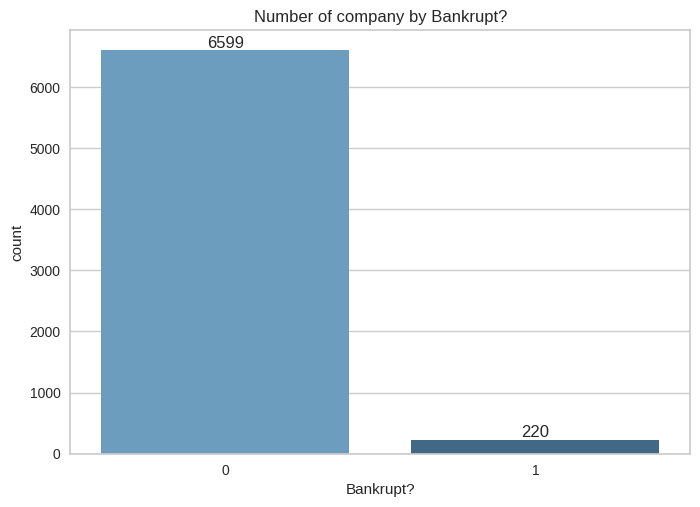

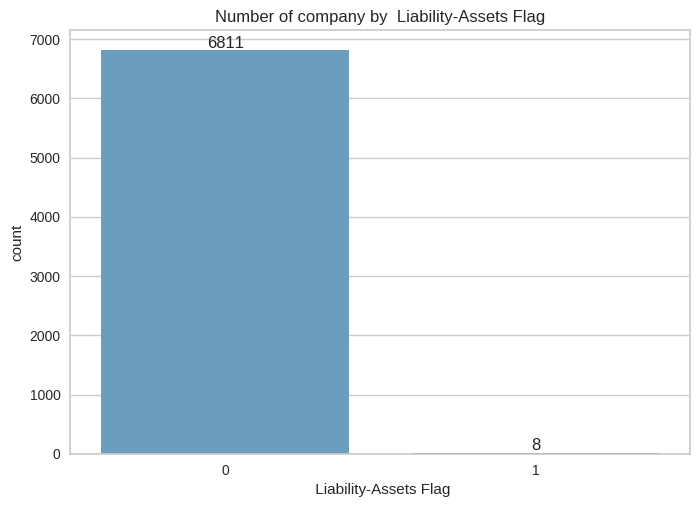

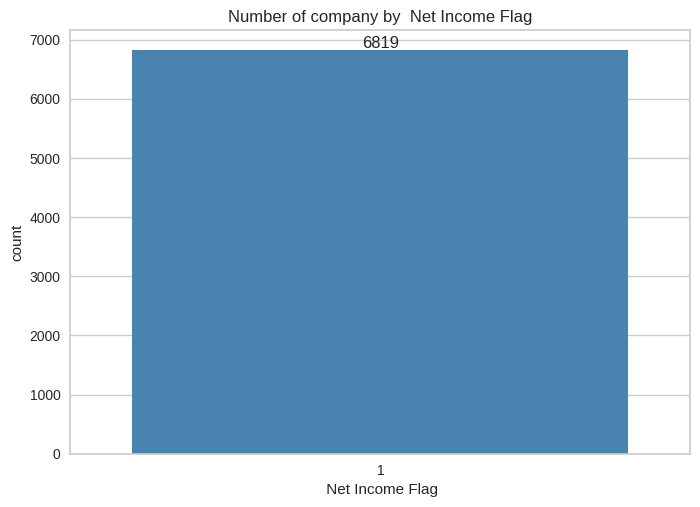

In [ ]:
# categorical univariate analysis
def viz_cate(cate_col):
  ax = sns.countplot(x = cate_col, data = df, palette = "Blues_d")
  plt.title(f"Number of company by {cate_col}")
  for container in ax.containers:
    ax.bar_label(container)
  plt.show()
for col in cat_cols:
  viz_cate(col)

####Bivariate Analysis

#####Numerical vs categorical

In [ ]:
def visualize_cate_num_columns(num_col, cate_col):
  sns.kdeplot(x = num_col, data = df, hue = cate_col )
  plt.title(f"DISTRIBUTION OF {num_col.upper()} BETWEEN FEATURE {cate_col.upper()}")
  plt.show()
  sns.boxplot(x = num_col, data = df, hue = cate_col)
  plt.title(f"BOX PLOT OF FEATURE {num_col.upper()} BETWEEN FEATURE {cate_col.upper()}")
  plt.show()

for cate_col in cat_cols:
  for num_col in num_cols:
    visualize_cate_num_columns(num_col, cate_col)

#####Categorical vs categorical

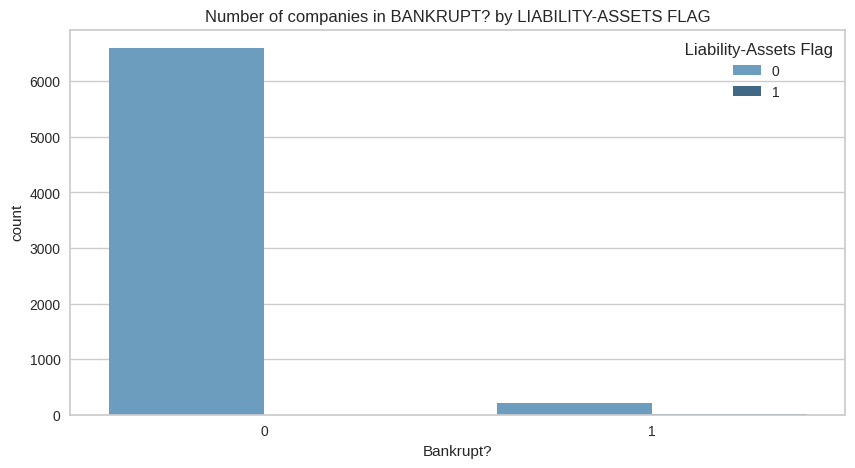

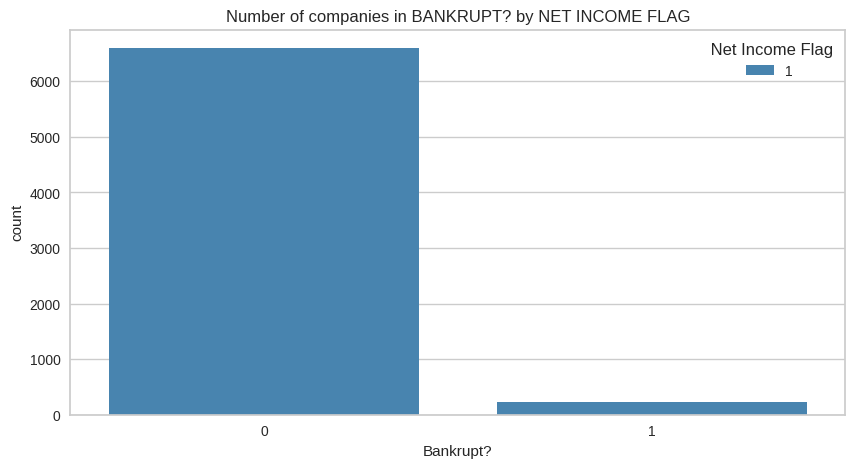

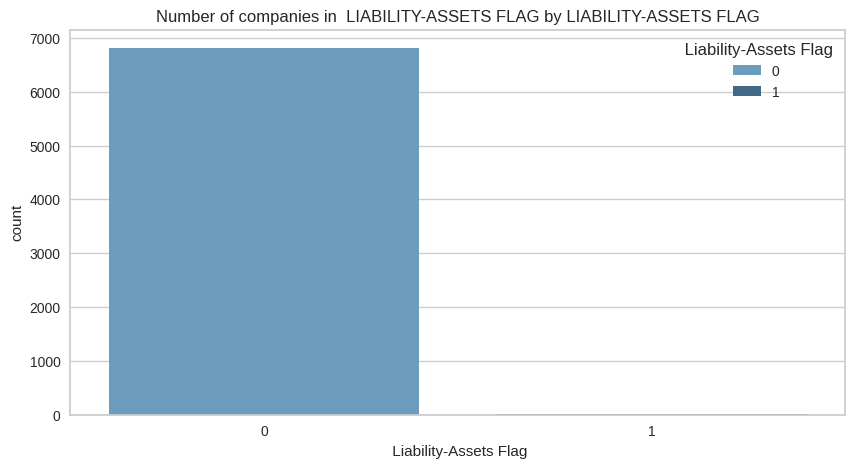

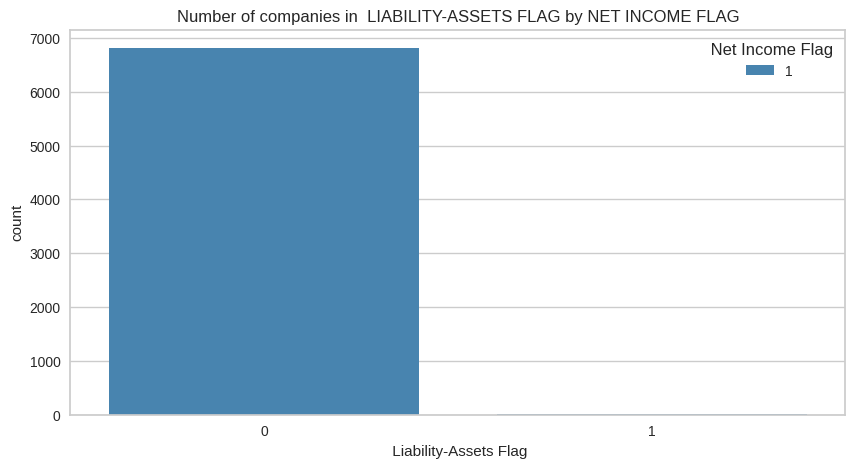

In [ ]:
def visualize_pair_cate_col(col, col2):
  plt.figure(figsize = (10, 5))
  sns.countplot(x = col, data = df, hue = col2,palette = "Blues_d" )
  plt.title(f"Number of companies in {col.upper()} by{col2.upper()}")
  plt.show()
for col1 in cat_cols[:-1]:
  for col2 in cat_cols[1:]:
    visualize_pair_cate_col(col1, col2)

##Correlation

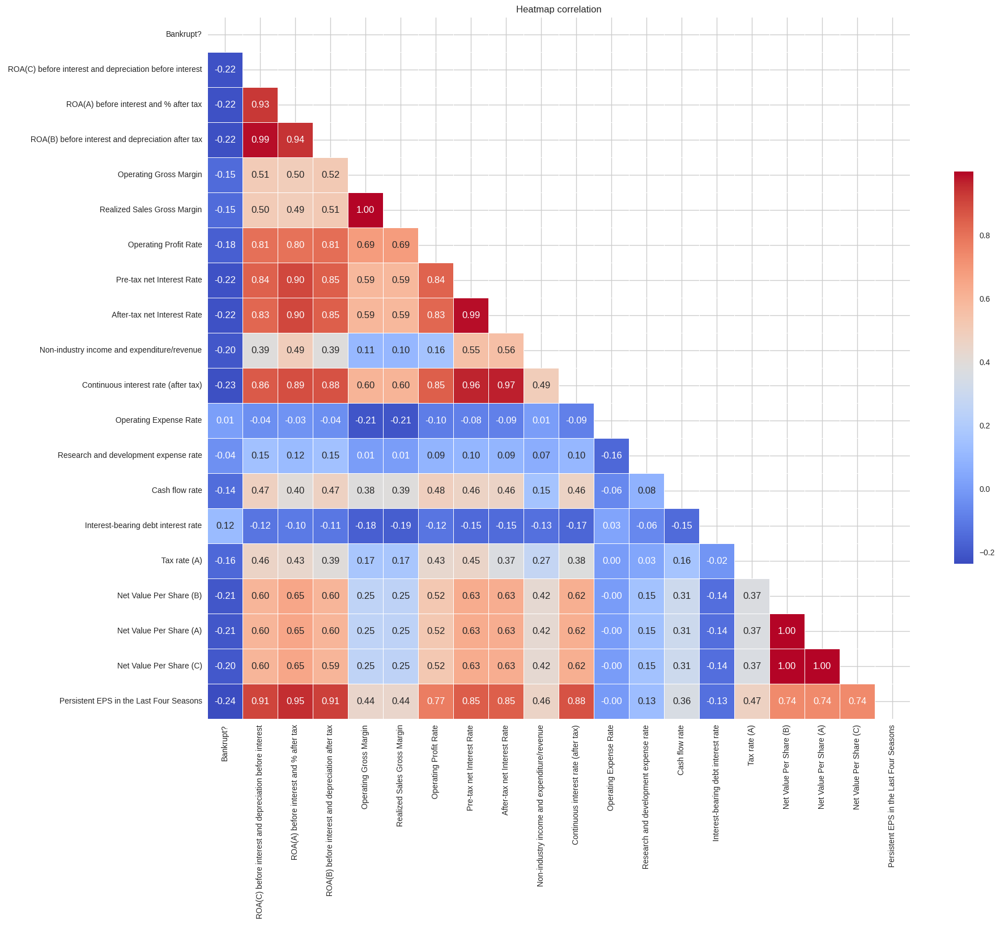

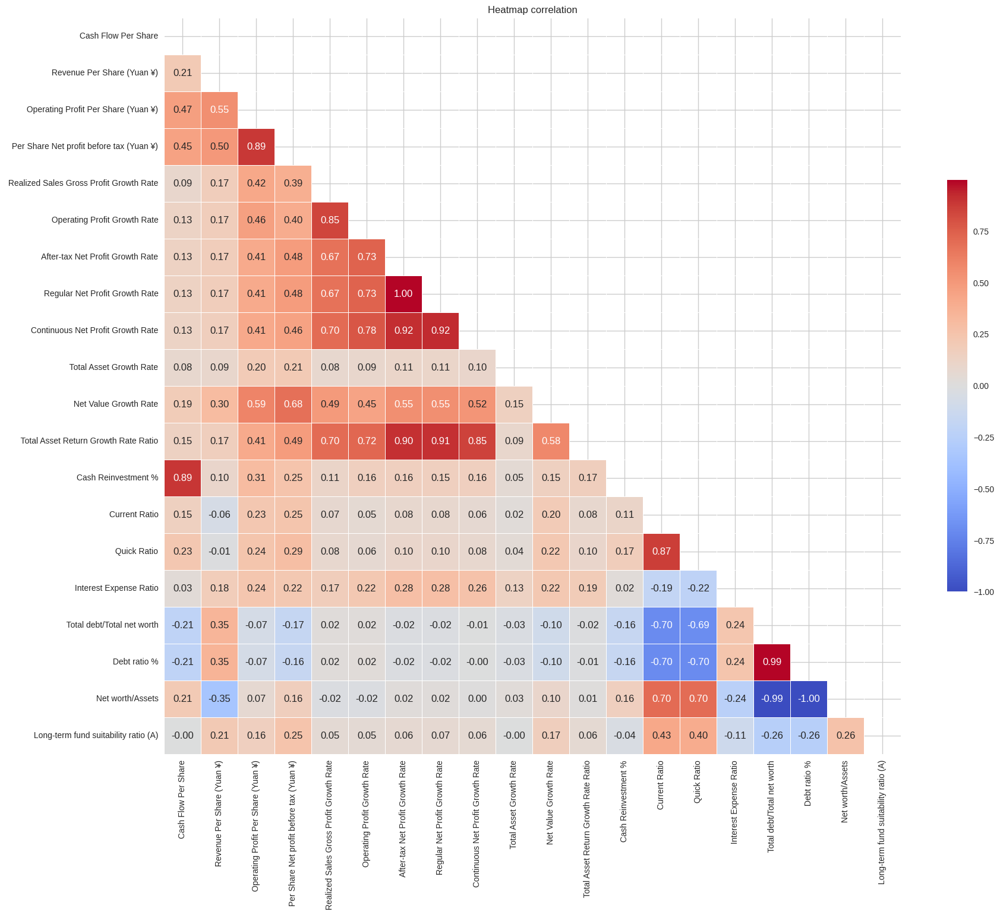

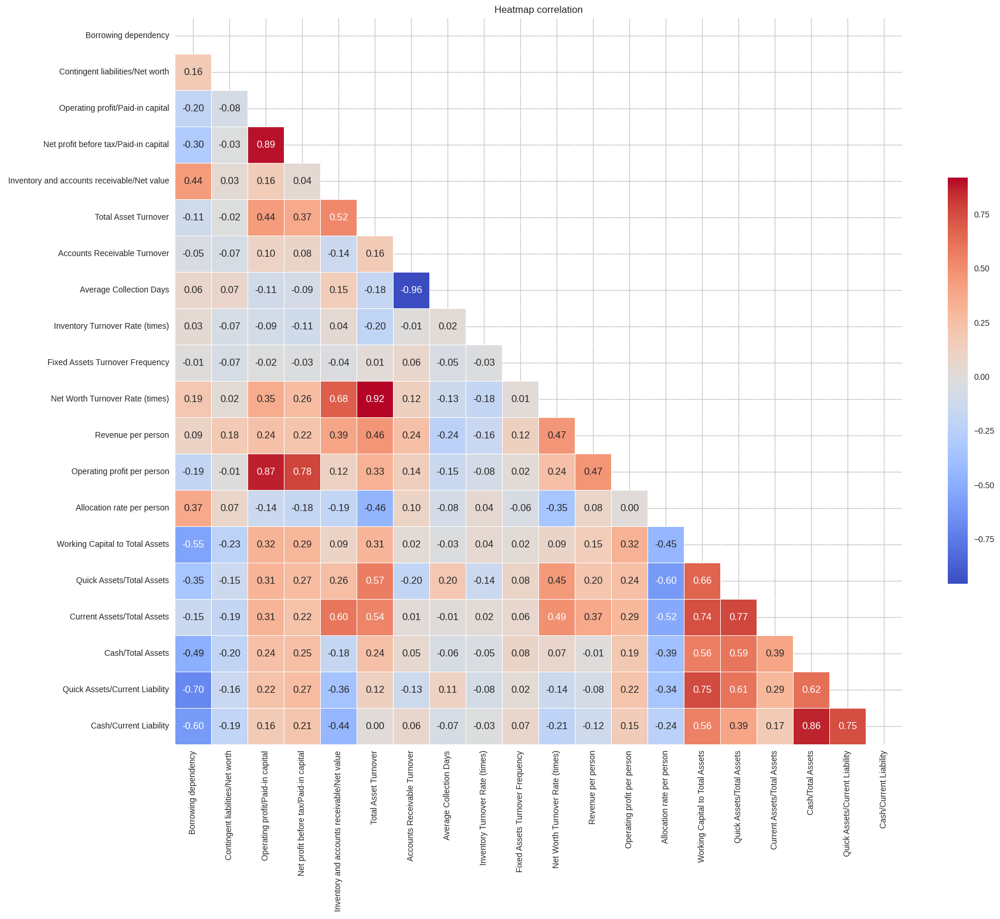

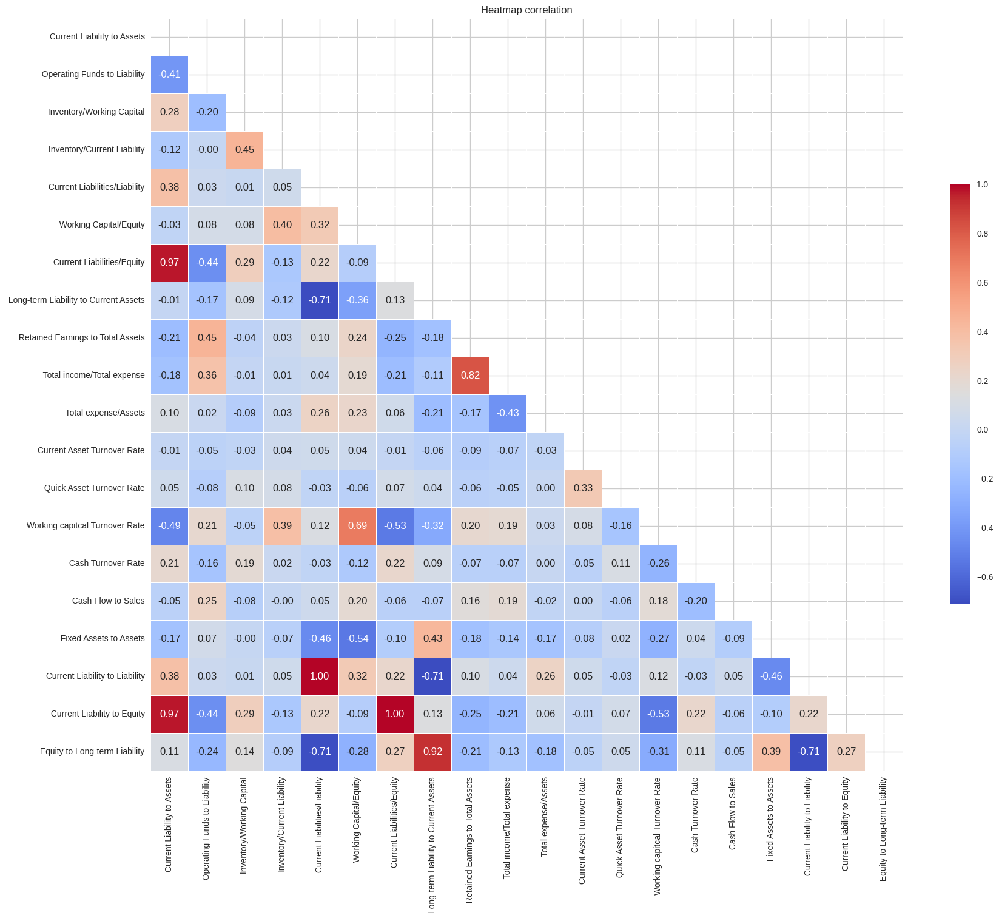

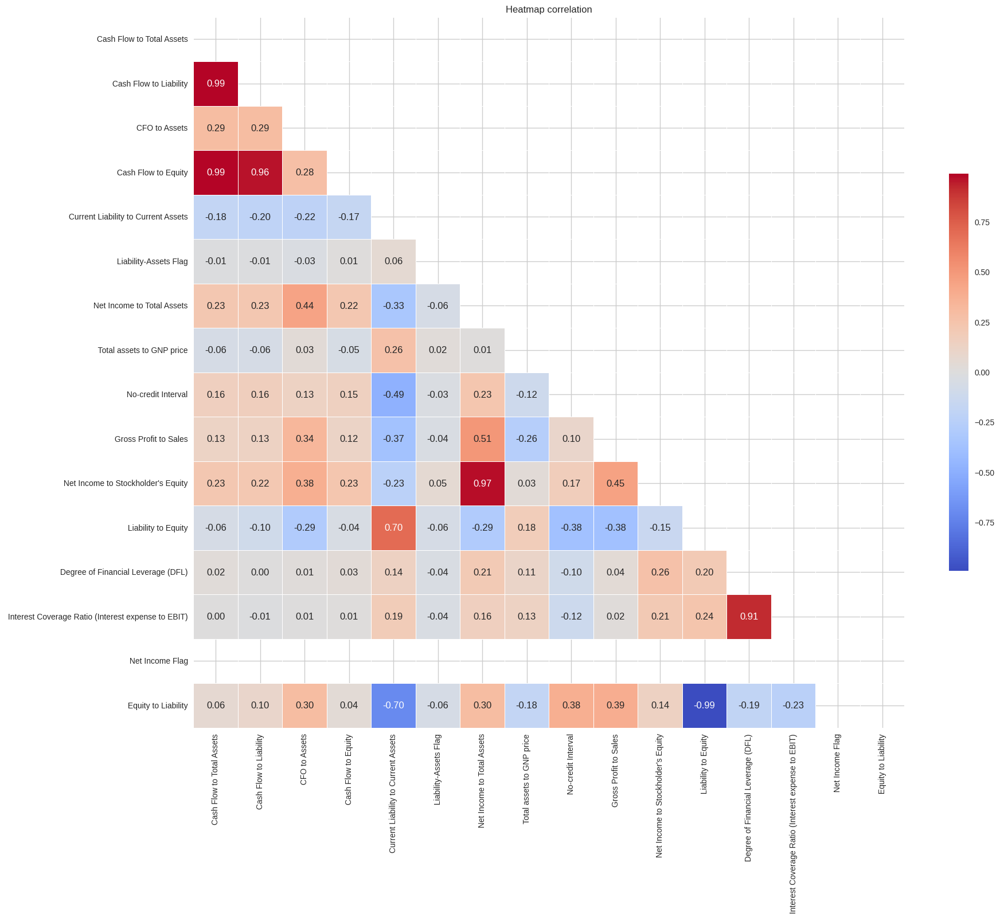

In [ ]:
def plot_correlation_heatmaps(df, num_vars_per_heatmap=20):
    # Số heatmap cần vẽ dựa trên số lượng biến và số biến trên mỗi heatmap
    num_heatmaps = np.ceil(df.shape[1] / num_vars_per_heatmap).astype(int)

    # Vẽ từng heatmap
    for i in range(num_heatmaps):
        # Tính chỉ số cột bắt đầu và kết thúc cho heatmap hiện tại
        start_idx = i * num_vars_per_heatmap
        end_idx = min(start_idx + num_vars_per_heatmap, df.shape[1])
        selected_cols = df.columns[start_idx:end_idx]

        # Tạo ma trận tương quan cho nhóm các biến hiện tại
        corr_matrix = df[selected_cols].corr(method='spearman')

        # Tạo mask để chỉ hiển thị một nửa ma trận tương quan
        mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

        # Vẽ heatmap
        plt.figure(figsize=(20, 18))
        sns.heatmap(corr_matrix, mask=mask, annot=True, fmt=".2f", cmap='coolwarm',
                    square=True, linewidths=.5, cbar_kws={"shrink": .5})
        plt.title('Heatmap correlation')
        plt.show()

plot_correlation_heatmaps(df, num_vars_per_heatmap=20)

##Missing values

In [ ]:
missing_value = 100 * df.isnull().sum()/len(df)
missing_value = missing_value.reset_index()
missing_value.columns = ['variables','missing values in percentage']
missing_value = missing_value.sort_values('missing values in percentage',ascending=False)


print((missing_value['missing values in percentage'] > 0).sum())
missing_value.head(4)

0


,variables,missing values in percentage
0,Bankrupt?,0.0
1,ROA(C) before interest and depreciation befor...,0.0
70,Total expense/Assets,0.0
69,Total income/Total expense,0.0


Bankrupt?
0    96.77372
1     3.22628
Name: proportion, dtype: float64


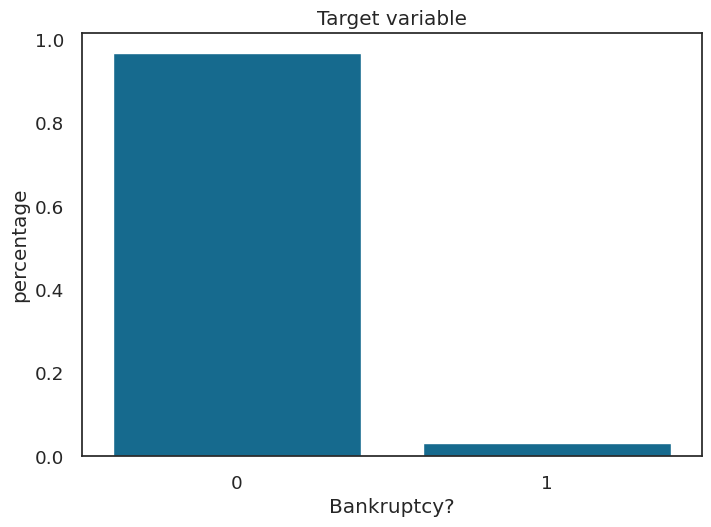

In [ ]:
# plot data
plot_target = df['Bankrupt?'].value_counts(1).reset_index()
plot_target.columns = ['Bankruptcy?','percentage']

# plot
sns.set_style('white')
sns.set_context(context='notebook',font_scale=1.2)
sns.barplot(x='Bankruptcy?',y='percentage',data=plot_target);
plt.title('Target variable');
print(df['Bankrupt?'].value_counts(1)*100)

##Class imbalance

##Ouliers

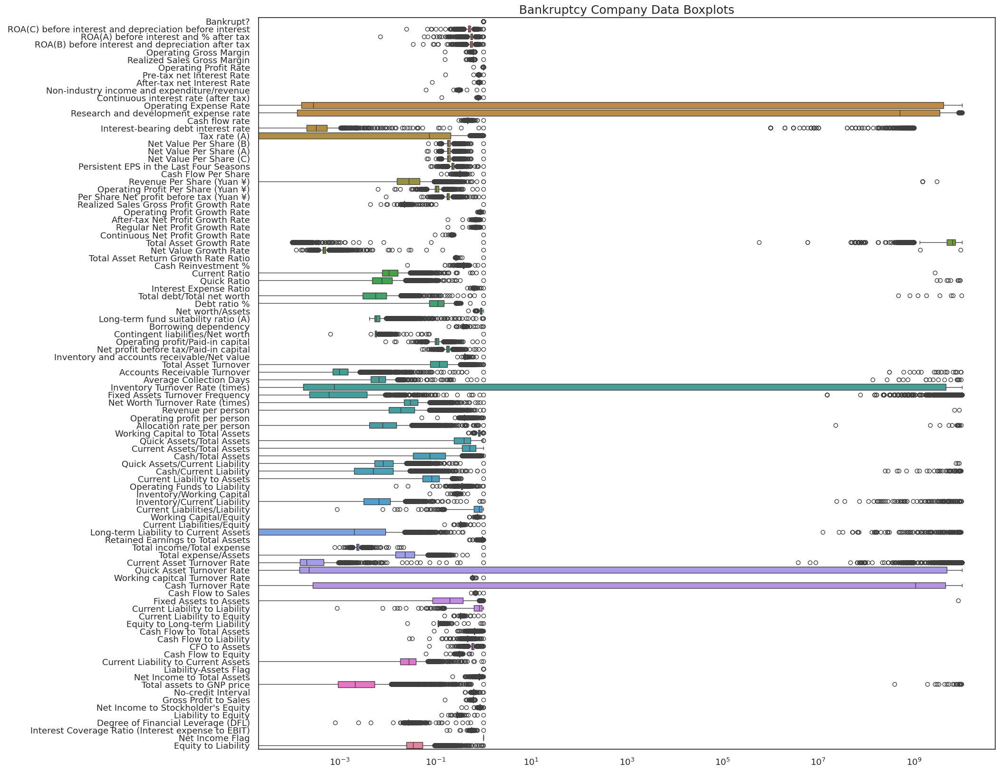

In [ ]:
plt.figure(figsize = (20,20))
ax =sns.boxplot(data = df, orient="h")
ax.set_title('Bankruptcy Company Data Boxplots', fontsize = 18)
ax.set(xscale="log")
plt.show()

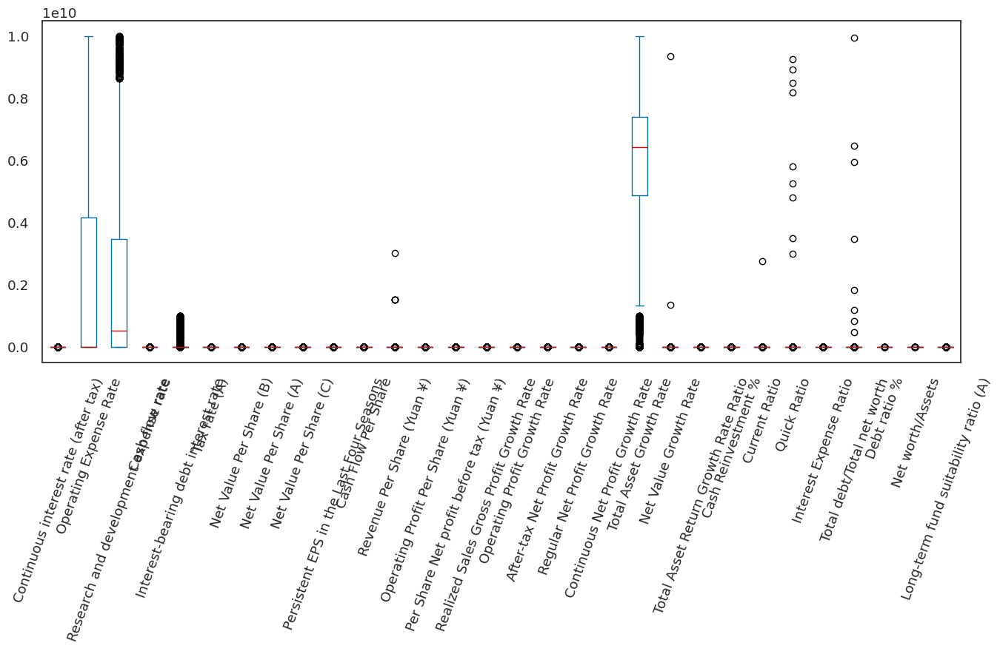

In [ ]:
df.iloc[:,10:40].plot(kind='box',figsize=(16,6));
plt.xticks(rotation=70);

##Preprocessing

In [ ]:
df.drop(df.columns[df.nunique() == 1][0],axis=1,inplace=True)
df.columns = df.columns.str.replace(' ','')

In [ ]:
def grab_col_names(dataframe, cat_th=10, car_th=20):

    cat_cols = [col for col in dataframe.columns if dataframe[col].dtypes == "O"]

    num_but_cat = [col for col in dataframe.columns if dataframe[col].nunique() < cat_th and
                   dataframe[col].dtypes != "O"]

    cat_but_car = [col for col in dataframe.columns if dataframe[col].nunique() > car_th and
                   dataframe[col].dtypes == "O"]

    cat_cols = cat_cols + num_but_cat
    cat_cols = [col for col in cat_cols if col not in cat_but_car]

    num_cols = [col for col in dataframe.columns if dataframe[col].dtypes != "O"]
    num_cols = [col for col in num_cols if col not in num_but_cat]

    print(f"Observations: {dataframe.shape[0]}")
    print(f"Variables: {dataframe.shape[1]}")
    print(f'cat_cols: {len(cat_cols)}')
    print(f'num_cols: {len(num_cols)}')
    print(f'cat_but_car: {len(cat_but_car)}')
    print(f'num_but_cat: {len(num_but_cat)}')
    return cat_cols, cat_but_car, num_cols

cat_cols, cat_but_car, num_cols = grab_col_names(df)

Observations: 6819
Variables: 95
cat_cols: 2
num_cols: 93
cat_but_car: 0
num_but_cat: 2


###Ouliers enhance

####Predictive Power Score - PPS


In [ ]:
def outlier_thresholds(dataframe, variable, low_quantile=0.15, up_quantile=0.85):
    quantile_one = dataframe[variable].quantile(low_quantile)
    quantile_three = dataframe[variable].quantile(up_quantile)
    interquantile_range = quantile_three - quantile_one
    up_limit = quantile_three + 1.5 * interquantile_range
    low_limit = quantile_one - 1.5 * interquantile_range
    return low_limit, up_limit

# Aykırı değer kontrolü
def check_outlier(dataframe, col_name):
    low_limit, up_limit = outlier_thresholds(dataframe, col_name)
    if dataframe[(dataframe[col_name] > up_limit) | (dataframe[col_name] < low_limit)].any(axis=None):
        return True
    else:
        return False
for col in num_cols:
      col, check_outlier(df, col)

In [ ]:
def replace_with_thresholds(dataframe, variable):
    low_limit, up_limit = outlier_thresholds(dataframe, variable)
    dataframe.loc[(dataframe[variable] < low_limit), variable] = low_limit
    dataframe.loc[(dataframe[variable] > up_limit), variable] = up_limit


for col in num_cols:
    if col != "SalePrice":
        replace_with_thresholds(df,col)

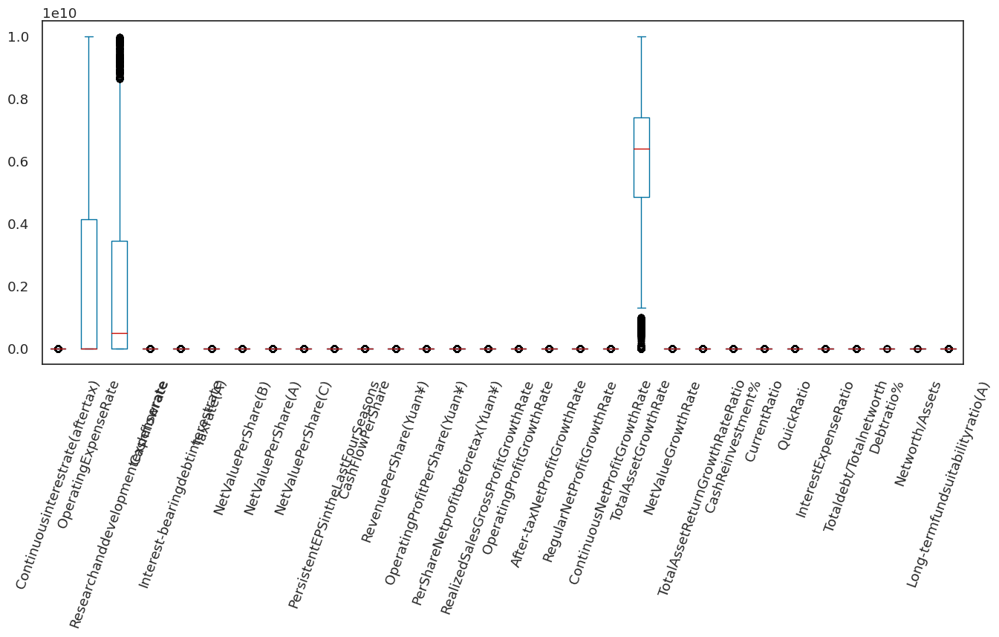

In [ ]:
df.iloc[:,10:40].plot(kind='box',figsize=(16,6))
plt.xticks(rotation=70);

###Train test split

In [ ]:
X = df.drop(columns="Bankrupt?")
y = df['Bankrupt?']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

print("Kích thước X_train:", X_train.shape)
print("Kích thước X_test:", X_test.shape)
print("Kích thước y_train:", y_train.shape)
print("Kích thước y_test:", y_test.shape)

Kích thước X_train: (5455, 94)
Kích thước X_test: (1364, 94)
Kích thước y_train: (5455,)
Kích thước y_test: (1364,)


###BorderlineSMOTE

In [ ]:
smote = BorderlineSMOTE()
X, y = smote.fit_resample(X, y)

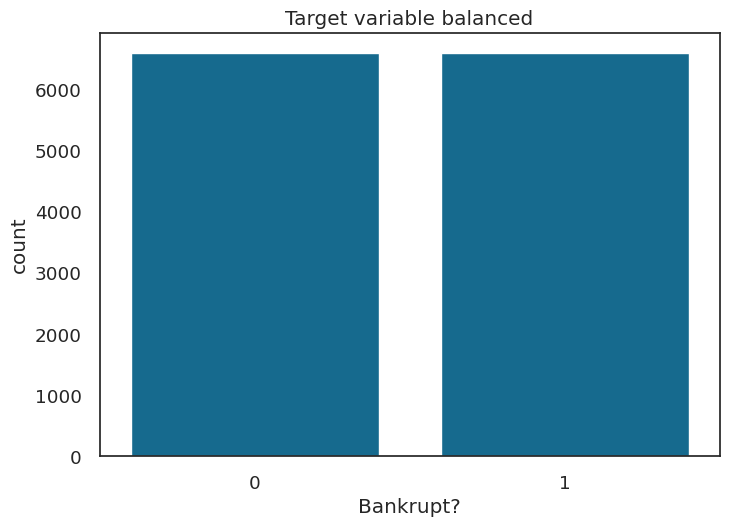

In [ ]:
sns.set_style('white');
sns.set_context(context='notebook',font_scale=1.2)
sns.countplot(x=y);
plt.title('Target variable balanced');

###Scaling

In [ ]:
std = MinMaxScaler()
X_train = std.fit_transform(X_train)
X_test = std.transform(X_test)

###RFECV

In [ ]:
cart = RandomForestClassifier(random_state=42)
min_features_to_select = 1
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=1, random_state=1)

rfecv = RFECV(estimator=cart, step=1, cv=cv,
              scoring='accuracy',
              min_features_to_select=min_features_to_select, n_jobs=1)

rfecv.fit(X_train, y_train)

print("Optimal number of features : %d" % rfecv.n_features_)

Optimal number of features : 50


In [ ]:
X_train_reduced = rfecv.transform(X_train)
X_test_scaled = std.transform(X_test)
X_test_reduced = rfecv.transform(X_test_scaled)

y_train_reduced = y_train
y_test_reduced = y_test

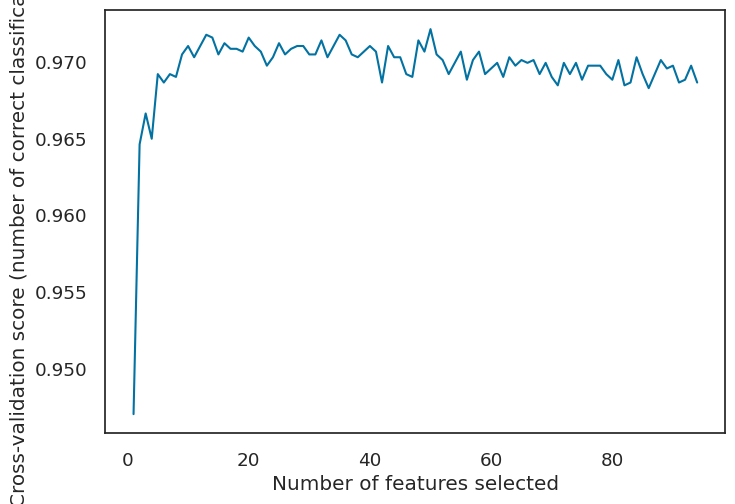

In [ ]:
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Cross-validation score (number of correct classifications)")

mean_scores = rfecv.cv_results_['mean_test_score']
number_of_features_range = range(min_features_to_select, min_features_to_select + len(mean_scores))

plt.plot(number_of_features_range, mean_scores)
plt.show()

In [ ]:
most_relevent_cols = df.iloc[:, 1:].columns[np.where(rfecv.support_ == True)]
print("Most relevant features are: ")
print(most_relevent_cols)

Most relevant features are: 
Index(['ROA(A)beforeinterestand%aftertax',
       'ROA(B)beforeinterestanddepreciationaftertax',
       'Non-industryincomeandexpenditure/revenue',
       'Continuousinterestrate(aftertax)', 'Interest-bearingdebtinterestrate',
       'NetValuePerShare(B)', 'NetValuePerShare(A)', 'NetValuePerShare(C)',
       'PersistentEPSintheLastFourSeasons', 'OperatingProfitPerShare(Yuan¥)',
       'PerShareNetprofitbeforetax(Yuan¥)', 'TotalAssetGrowthRate',
       'NetValueGrowthRate', 'TotalAssetReturnGrowthRateRatio', 'QuickRatio',
       'InterestExpenseRatio', 'Totaldebt/Totalnetworth', 'Debtratio%',
       'Networth/Assets', 'Borrowingdependency',
       'Operatingprofit/Paid-incapital', 'Netprofitbeforetax/Paid-incapital',
       'AccountsReceivableTurnover', 'AverageCollectionDays',
       'Revenueperperson', 'Operatingprofitperperson',
       'Allocationrateperperson', 'WorkingCapitaltoTotalAssets',
       'QuickAssets/TotalAssets', 'CurrentAssets/TotalAssets',


In [ ]:
most_relevent_cols = list(most_relevent_cols)
most_relevent_cols.append("Bankrupt?")

In [ ]:
df_reduced = df[most_relevent_cols]
df_reduced.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 51 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   ROA(A)beforeinterestand%aftertax              6819 non-null   float64
 1   ROA(B)beforeinterestanddepreciationaftertax   6819 non-null   float64
 2   Non-industryincomeandexpenditure/revenue      6819 non-null   float64
 3   Continuousinterestrate(aftertax)              6819 non-null   float64
 4   Interest-bearingdebtinterestrate              6819 non-null   float64
 5   NetValuePerShare(B)                           6819 non-null   float64
 6   NetValuePerShare(A)                           6819 non-null   float64
 7   NetValuePerShare(C)                           6819 non-null   float64
 8   PersistentEPSintheLastFourSeasons             6819 non-null   float64
 9   OperatingProfitPerShare(Yuan¥)                6819 non-null   f

##EDA after encoding

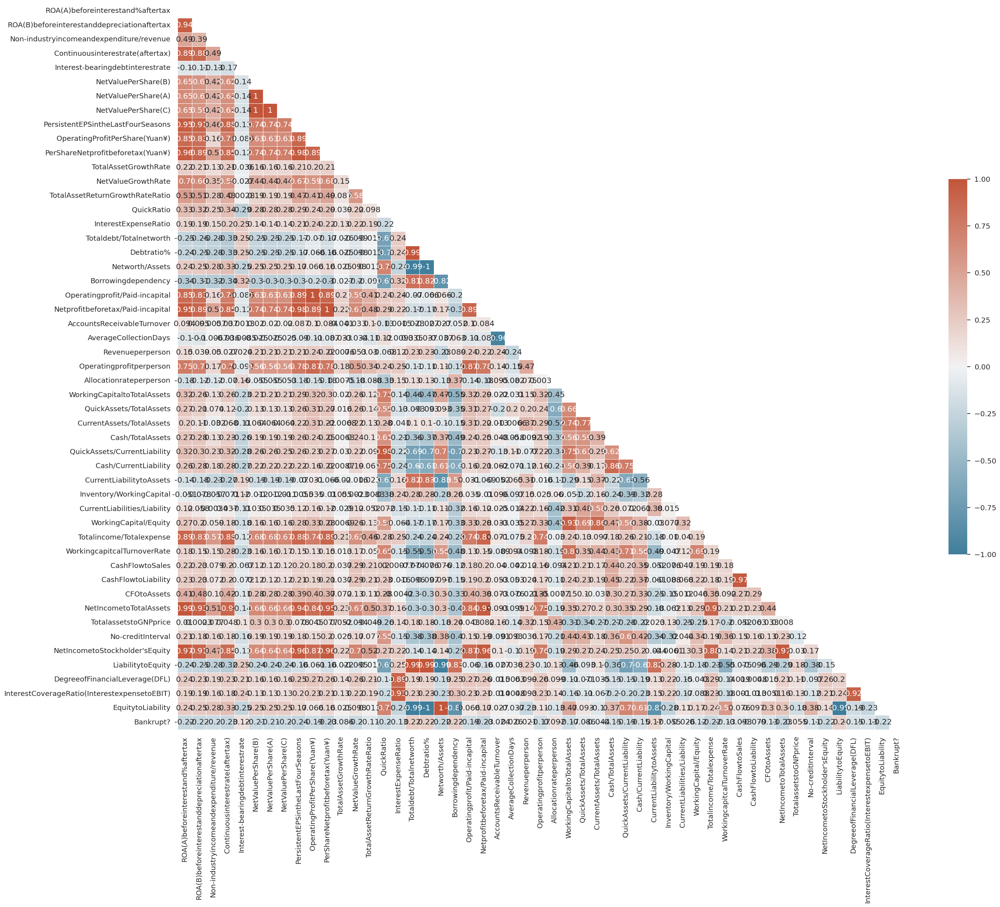

In [ ]:
df_reduced.corr('spearman')["Bankrupt?"].sort_values()
# Correlation Heatmap (Spearman)
f, ax = plt.subplots(figsize=(30, 25))
mat = df_reduced.corr('spearman')
mask = np.triu(np.ones_like(mat, dtype=bool))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(mat, mask=mask, cmap=cmap, vmax=1, center=0, annot = True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.show()

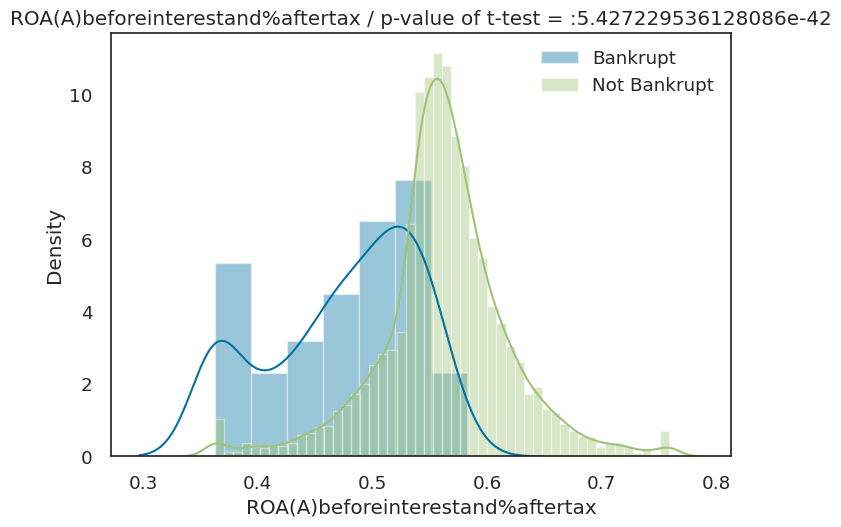

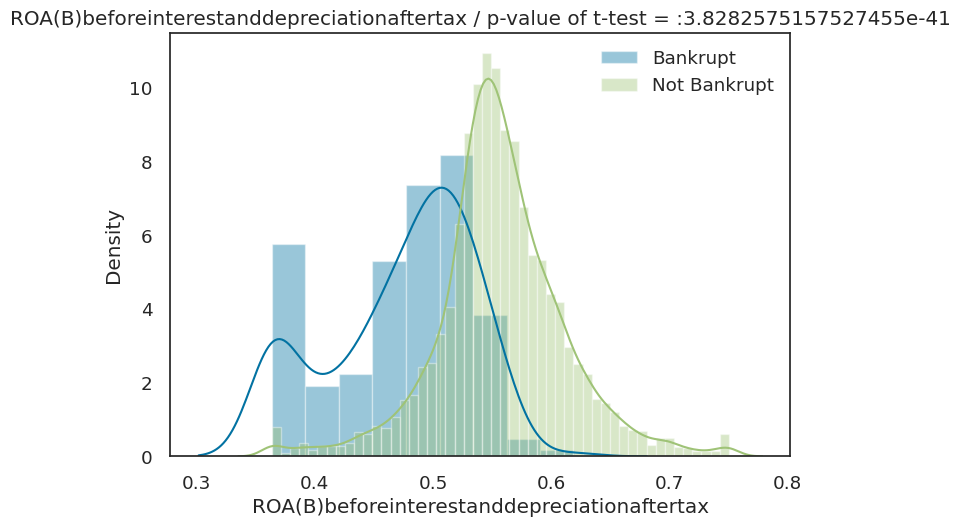

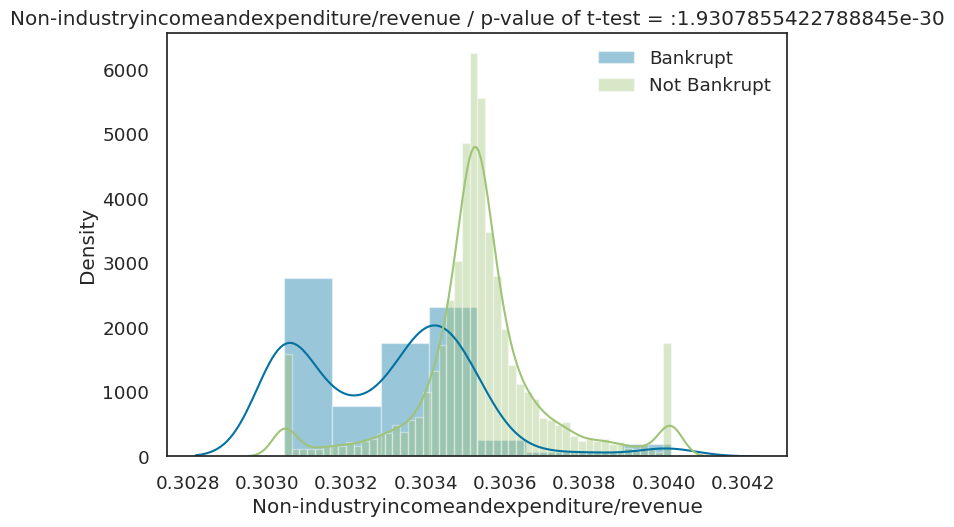

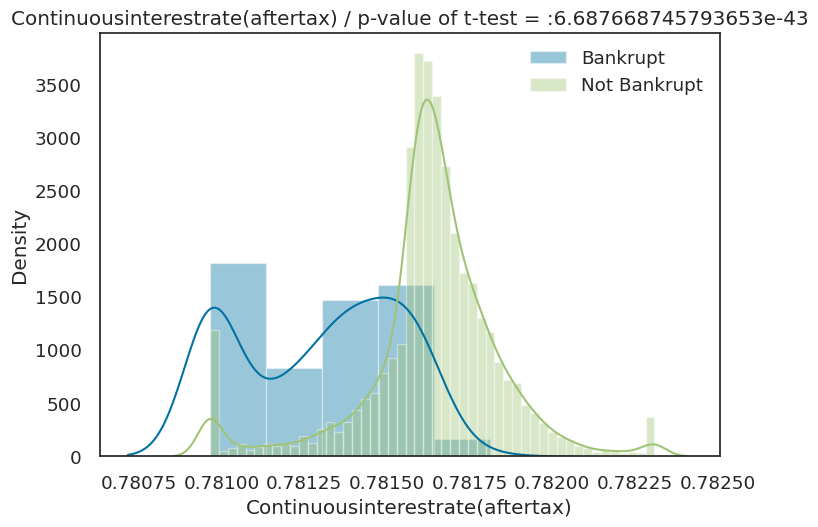

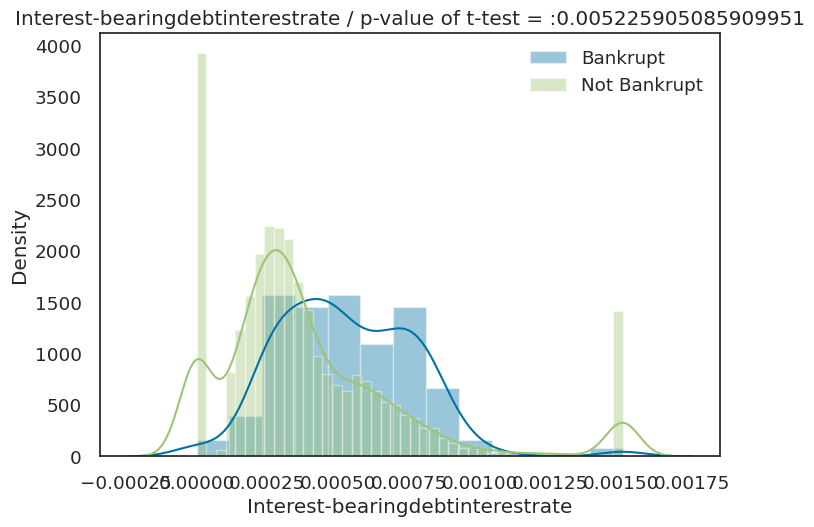

...

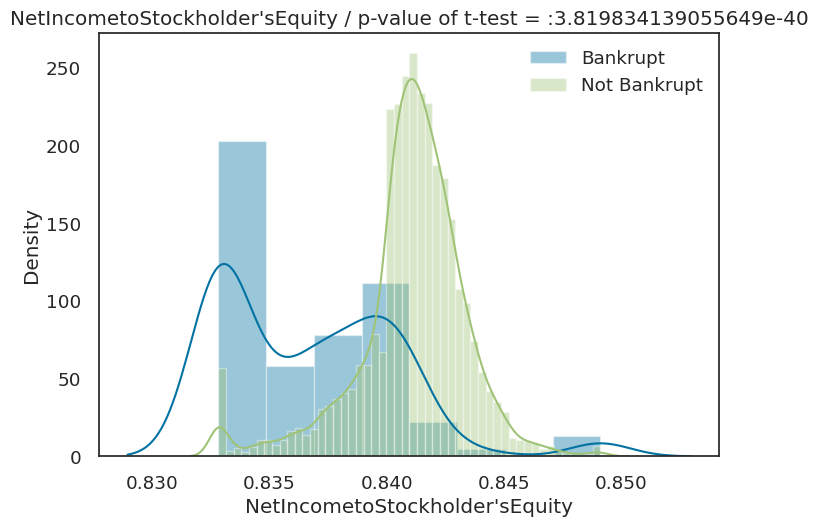

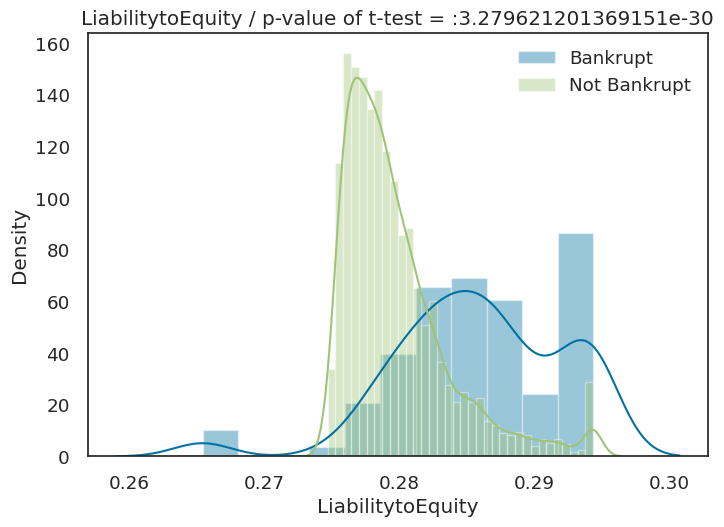

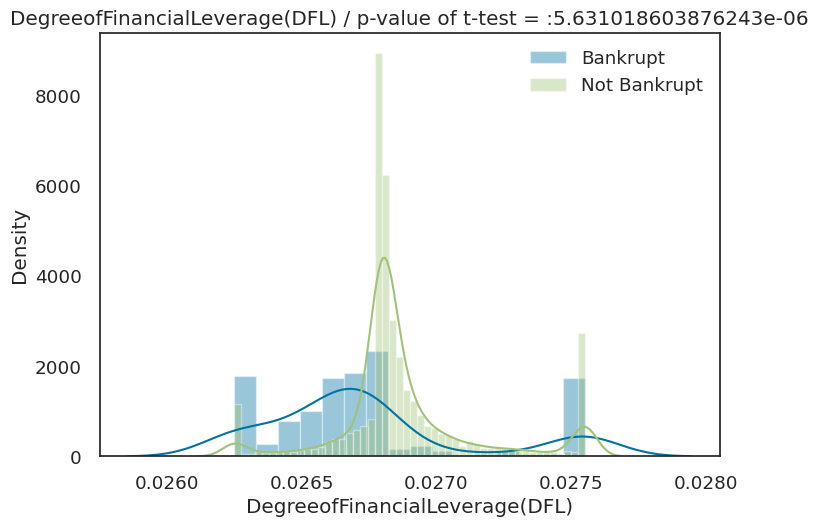

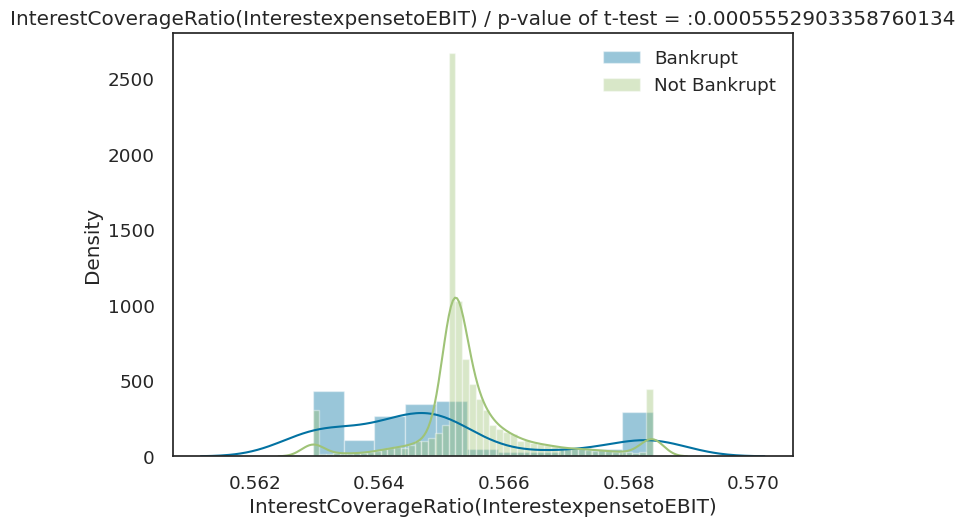

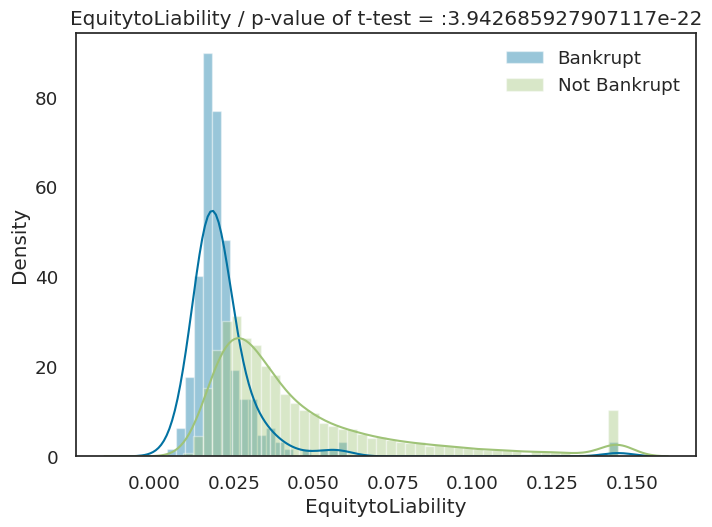

In [ ]:
from scipy import stats

bankrupt_df = df_reduced[df_reduced['Bankrupt?']==True]
not_bankrupt_df = df_reduced[df_reduced['Bankrupt?']==False]

# Analyze distributions of selected features using rfecv
cols = df_reduced.drop("Bankrupt?", axis=1).columns

for feature in cols:
  a = bankrupt_df[feature]
  b = not_bankrupt_df[feature]
  b = b.sample(n=len(a), random_state=42)
  test = stats.ttest_ind(a,b)
  plt.figure()
  sns.distplot(bankrupt_df[feature], kde=True, label="Bankrupt")
  sns.distplot(not_bankrupt_df[feature], kde=True, label="Not Bankrupt")
  plt.title("{} / p-value of t-test = :{}".format(feature, test[1]))
  plt.legend()

#**Model prediction**

##Non-RFECV

In [ ]:
X_train.shape,X_test.shape

((5455, 94), (1364, 94))

###Logistic Regression

In [ ]:
logistic_regression = LogisticRegression()
lr_model = logistic_regression.fit(X_train, y_train)
y_pred_logis = logistic_regression.predict(X_test)

print(confusion_matrix(y_test, y_pred_logis))
print(classification_report(y_test, y_pred_logis))

[[1317    3]
 [  35    9]]
              precision    recall  f1-score   support

           0       0.97      1.00      0.99      1320
           1       0.75      0.20      0.32        44

    accuracy                           0.97      1364
   macro avg       0.86      0.60      0.65      1364
weighted avg       0.97      0.97      0.96      1364



###K Nearest Neighbor

In [ ]:
knn_classifier = KNeighborsClassifier(n_neighbors = 11)
knn_model = knn_classifier.fit(X_train, y_train)
y_pred_knn = knn_classifier.predict(X_test)

print(confusion_matrix(y_test, y_pred_knn))
print(classification_report(y_test, y_pred_knn))

[[1316    4]
 [  40    4]]
              precision    recall  f1-score   support

           0       0.97      1.00      0.98      1320
           1       0.50      0.09      0.15        44

    accuracy                           0.97      1364
   macro avg       0.74      0.54      0.57      1364
weighted avg       0.96      0.97      0.96      1364



###SVC

In [ ]:
svc_classifier = SVC(probability=True)
svc_model = svc_classifier.fit(X_train, y_train)
y_pred_svc = svc_classifier.predict(X_test)

print(confusion_matrix(y_test, y_pred_svc))
print(classification_report(y_test, y_pred_svc))

[[1319    1]
 [  40    4]]
              precision    recall  f1-score   support

           0       0.97      1.00      0.98      1320
           1       0.80      0.09      0.16        44

    accuracy                           0.97      1364
   macro avg       0.89      0.55      0.57      1364
weighted avg       0.97      0.97      0.96      1364



###Decision Tree

In [ ]:
dt_classifier = DecisionTreeClassifier()
dt_model = dt_classifier.fit(X_train, y_train)
y_pred_Tree = dt_classifier.predict(X_test)

print(confusion_matrix(y_test, y_pred_Tree))
print(classification_report(y_test, y_pred_Tree))

[[1295   25]
 [  28   16]]
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      1320
           1       0.39      0.36      0.38        44

    accuracy                           0.96      1364
   macro avg       0.68      0.67      0.68      1364
weighted avg       0.96      0.96      0.96      1364



###Random forest

In [ ]:
clf_RF = RandomForestClassifier()
rf_model = clf_RF.fit(X_train, y_train)
y_pred_RF = clf_RF.predict(X_test)

print(confusion_matrix(y_test, y_pred_RF))
print(classification_report(y_test, y_pred_RF))

[[1317    3]
 [  34   10]]
              precision    recall  f1-score   support

           0       0.97      1.00      0.99      1320
           1       0.77      0.23      0.35        44

    accuracy                           0.97      1364
   macro avg       0.87      0.61      0.67      1364
weighted avg       0.97      0.97      0.97      1364



###Gradient Boosting

In [ ]:
gb = GradientBoostingClassifier()
gb_model = gb.fit(X_train, y_train)
y_pred_gb = gb.predict(X_test)

print(confusion_matrix(y_test, y_pred_gb))
print(classification_report(y_test, y_pred_gb))

[[1309   11]
 [  29   15]]
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      1320
           1       0.58      0.34      0.43        44

    accuracy                           0.97      1364
   macro avg       0.78      0.67      0.71      1364
weighted avg       0.97      0.97      0.97      1364



###XGBoost

In [ ]:
xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss')
xgb_model = xgb.fit(X_train, y_train)
y_pred_xgb = xgb.predict(X_test)

# In ra ma trận nhầm lẫn và báo cáo phân loại
print(confusion_matrix(y_test, y_pred_xgb))
print(classification_report(y_test, y_pred_xgb))

[[1312    8]
 [  28   16]]
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      1320
           1       0.67      0.36      0.47        44

    accuracy                           0.97      1364
   macro avg       0.82      0.68      0.73      1364
weighted avg       0.97      0.97      0.97      1364



###Catboost

In [ ]:
catboost_model = CatBoostClassifier()
cb_model = catboost_model.fit(X_train, y_train)
y_pred_catboost = catboost_model.predict(X_test)

print(confusion_matrix(y_test, y_pred_catboost))
print(classification_report(y_test, y_pred_catboost))

Learning rate set to 0.021259
0:	learn: 0.6480198	total: 89.1ms	remaining: 1m 28s
1:	learn: 0.6047561	total: 119ms	remaining: 59.5s
2:	learn: 0.5705711	total: 144ms	remaining: 47.7s
3:	learn: 0.5339136	total: 168ms	remaining: 41.9s
4:	learn: 0.4995282	total: 197ms	remaining: 39.3s
5:	learn: 0.4671040	total: 223ms	remaining: 36.9s
6:	learn: 0.4391316	total: 248ms	remaining: 35.1s
7:	learn: 0.4134768	total: 274ms	remaining: 33.9s
8:	learn: 0.3929513	total: 304ms	remaining: 33.5s
9:	learn: 0.3713411	total: 329ms	remaining: 32.6s
10:	learn: 0.3512598	total: 353ms	remaining: 31.7s
11:	learn: 0.3310161	total: 378ms	remaining: 31.1s
12:	learn: 0.3112565	total: 405ms	remaining: 30.8s
13:	learn: 0.2968234	total: 436ms	remaining: 30.7s
14:	learn: 0.2803928	total: 460ms	remaining: 30.2s
15:	learn: 0.2651368	total: 484ms	remaining: 29.8s
16:	learn: 0.2535480	total: 516ms	remaining: 29.8s
17:	learn: 0.2417786	total: 541ms	remaining: 29.5s
18:	learn: 0.2312070	total: 565ms	remaining: 29.2s
19:	learn

###Adaboost

In [ ]:
ada_classifier = AdaBoostClassifier()
ada_model = ada_classifier.fit(X_train, y_train)
y_pred_ada = ada_classifier.predict(X_test)

print(confusion_matrix(y_test, y_pred_ada))
print(classification_report(y_test, y_pred_ada))

[[1303   17]
 [  30   14]]
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      1320
           1       0.45      0.32      0.37        44

    accuracy                           0.97      1364
   macro avg       0.71      0.65      0.68      1364
weighted avg       0.96      0.97      0.96      1364



###Stacking

In [ ]:
stacking_classifier = StackingClassifier(
    estimators=[
        ('ET', ExtraTreesClassifier()),
        ('XGB', XGBClassifier()),
        ('ADA', AdaBoostClassifier())
    ],
    final_estimator=RandomForestClassifier(),
    verbose=2
)

# Huấn luyện mô hình trên tập dữ liệu huấn luyện
st_model = stacking_classifier.fit(X_train, y_train)

# Dự đoán kết quả trên tập dữ liệu kiểm tra
y_pred_stacking = stacking_classifier.predict(X_test)

# Tính toán và in ra ma trận nhầm lẫn và báo cáo phân loại
print(confusion_matrix(y_test, y_pred_stacking))
print(classification_report(y_test, y_pred_stacking))

[[1312    8]
 [  29   15]]
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      1320
           1       0.65      0.34      0.45        44

    accuracy                           0.97      1364
   macro avg       0.82      0.67      0.72      1364
weighted avg       0.97      0.97      0.97      1364



##Non-RFECV results

###ROC curves

In [ ]:
y_proba_lr = lr_model.predict_proba(X_test)[:, 1]
y_proba_knn = knn_model.predict_proba(X_test)[:, 1]
y_proba_svc = svc_model.predict_proba(X_test)[:, 1]
y_proba_dt = dt_model.predict_proba(X_test)[:, 1]
y_proba_rf = rf_model.predict_proba(X_test)[:, 1]
y_proba_gb = gb_model.predict_proba(X_test)[:, 1]
y_proba_xgb = xgb_model.predict_proba(X_test)[:, 1]
y_proba_cb = cb_model.predict_proba(X_test)[:, 1]
y_proba_ada = ada_model.predict_proba(X_test)[:, 1]
y_proba_st = st_model.predict_proba(X_test)[:, 1]

In [ ]:
roc_auc_lr = roc_auc_score(y_test, y_proba_lr)
fpr_knn, tpr_knn, thresholds_knn = roc_curve(y_test, y_proba_knn)
fpr_svc, tpr_svc, thresholds_svc = roc_curve(y_test, y_proba_svc)
fpr_dt, tpr_dt, thresholds_dt = roc_curve(y_test, y_proba_dt)
fpr_rf, tpr_rf, thresholds_rf = roc_curve(y_test, y_proba_rf)
fpr_gb, tpr_gb, thresholds_gb = roc_curve(y_test, y_proba_gb)
fpr_xgb, tpr_xgb, thresholds_xgb = roc_curve(y_test, y_proba_xgb)
fpr_cb, tpr_cb, thresholds_cb = roc_curve(y_test, y_proba_cb)
fpr_ada, tpr_ada, thresholds_ada = roc_curve(y_test, y_proba_ada)
fpr_st, tpr_st, thresholds_st = roc_curve(y_test, y_proba_st)

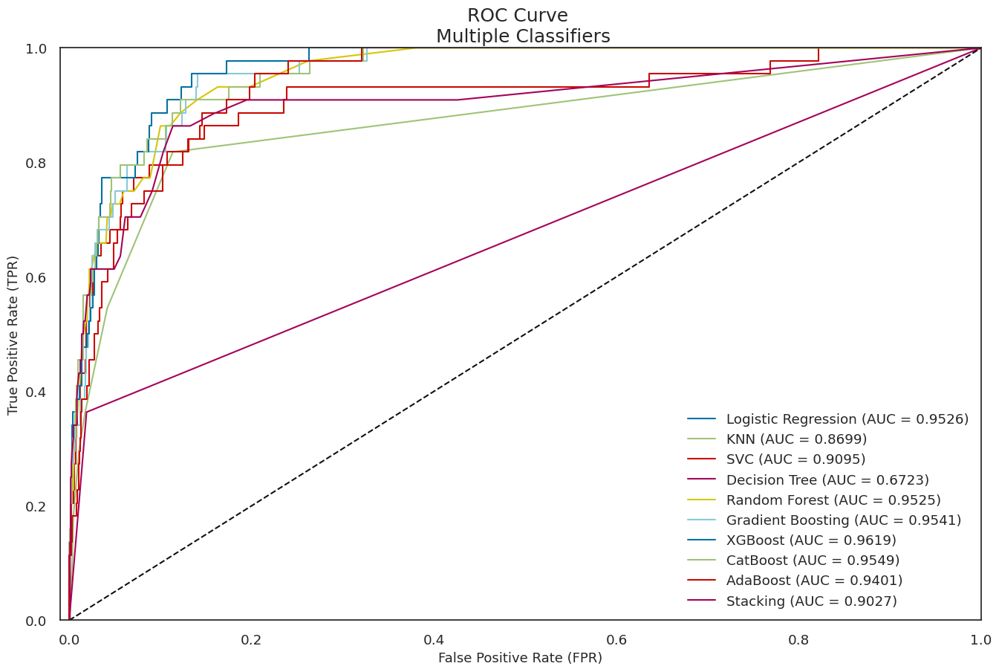

In [ ]:
def graph_roc_curve_multiple(roc_auc_lr, fpr_knn, tpr_knn, fpr_svc, tpr_svc,
                            fpr_dt, tpr_dt, fpr_rf, tpr_rf, fpr_gb, tpr_gb,
                            fpr_xgb, tpr_xgb, fpr_cb, tpr_cb, fpr_ada, tpr_ada,
                            fpr_st, tpr_st):
    plt.figure(figsize=(16,10))
    plt.title('ROC Curve \n Multiple Classifiers', fontsize=18)
    plt.plot(roc_auc_lr, label='Logistic Regression (AUC = {:.4f})'.format(roc_auc_score(y_test, y_proba_lr)))
    plt.plot(fpr_knn, tpr_knn, label='KNN (AUC = {:.4f})'.format(roc_auc_score(y_test, y_proba_knn)))
    plt.plot(fpr_svc, tpr_svc, label='SVC (AUC = {:.4f})'.format(roc_auc_score(y_test, y_proba_svc)))
    plt.plot(fpr_dt, tpr_dt, label='Decision Tree (AUC = {:.4f})'.format(roc_auc_score(y_test, y_proba_dt)))
    plt.plot(fpr_rf, tpr_rf, label='Random Forest (AUC = {:.4f})'.format(roc_auc_score(y_test, y_proba_rf)))
    plt.plot(fpr_gb, tpr_gb, label='Gradient Boosting (AUC = {:.4f})'.format(roc_auc_score(y_test, y_proba_gb)))
    plt.plot(fpr_xgb, tpr_xgb, label='XGBoost (AUC = {:.4f})'.format(roc_auc_score(y_test, y_proba_xgb)))
    plt.plot(fpr_cb, tpr_cb, label='CatBoost (AUC = {:.4f})'.format(roc_auc_score(y_test, y_proba_cb)))
    plt.plot(fpr_ada, tpr_ada, label='AdaBoost (AUC = {:.4f})'.format(roc_auc_score(y_test, y_proba_ada)))
    plt.plot(fpr_st, tpr_st, label='Stacking (AUC = {:.4f})'.format(roc_auc_score(y_test, y_proba_st)))
    plt.plot([0, 1], [0, 1], 'k--')
    plt.axis([-0.01, 1, 0, 1])
    plt.xlabel('False Positive Rate (FPR)', fontsize=13)
    plt.ylabel('True Positive Rate (TPR)', fontsize=13)
    plt.legend(loc='lower right')

# Gọi hàm để vẽ đường cong ROC cho mỗi mô hình
graph_roc_curve_multiple(roc_auc_lr, fpr_knn, tpr_knn, fpr_svc, tpr_svc,
                         fpr_dt, tpr_dt, fpr_rf, tpr_rf, fpr_gb, tpr_gb,
                         fpr_xgb, tpr_xgb, fpr_cb, tpr_cb, fpr_ada, tpr_ada,
                         fpr_st, tpr_st)
plt.show()

###Precision-Recall curves

In [ ]:
precision_lr, recall_lr, _ = precision_recall_curve(y_test, y_proba_lr)
precision_knn, recall_knn, _ = precision_recall_curve(y_test, y_proba_knn)
precision_svc, recall_svc, _ = precision_recall_curve(y_test, y_proba_svc)
precision_dt, recall_dt, _ = precision_recall_curve(y_test, y_proba_dt)
precision_rf, recall_rf, _ = precision_recall_curve(y_test, y_proba_rf)
precision_gb, recall_gb, _ = precision_recall_curve(y_test, y_proba_gb)
precision_xgb, recall_xgb, _ = precision_recall_curve(y_test, y_proba_xgb)
precision_cb, recall_cb, _ = precision_recall_curve(y_test, y_proba_cb)
precision_ada, recall_ada, _ = precision_recall_curve(y_test, y_proba_ada)
precision_st, recall_st, _ = precision_recall_curve(y_test, y_proba_st)

In [ ]:
auc_lr = auc(recall_lr, precision_lr)
auc_knn = auc(recall_knn, precision_knn)
auc_svc = auc(recall_svc, precision_svc)
auc_dt = auc(recall_dt, precision_dt)
auc_rf = auc(recall_rf, precision_rf)
auc_gb = auc(recall_gb, precision_gb)
auc_xgb = auc(recall_xgb, precision_xgb)
auc_cb = auc(recall_cb, precision_cb)
auc_ada = auc(recall_ada, precision_ada)
auc_st = auc(recall_st, precision_st)

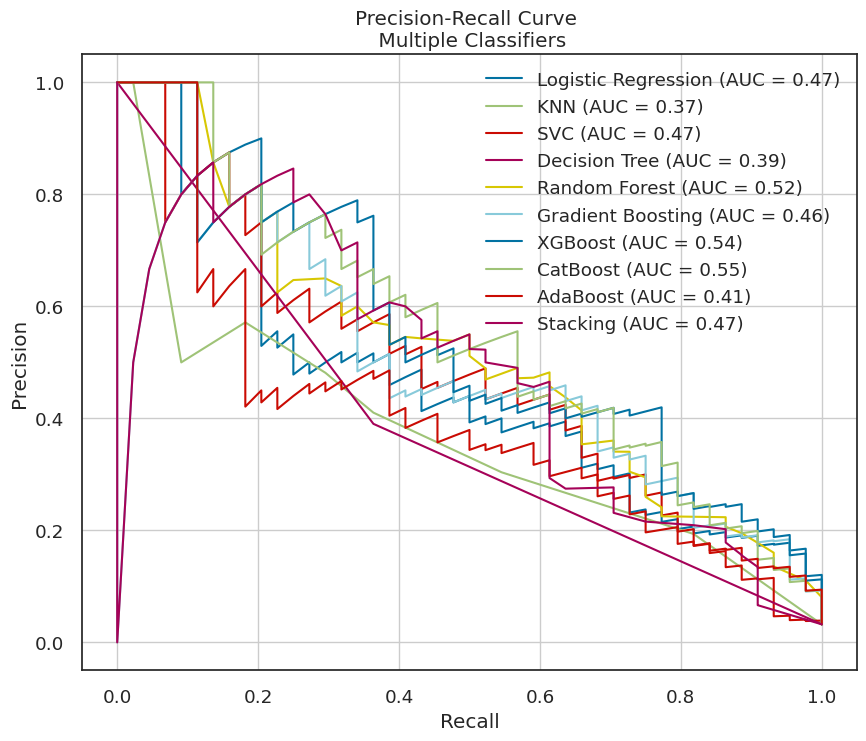

In [ ]:
plt.figure(figsize=(10, 8))

plt.plot(recall_lr, precision_lr, label=f'Logistic Regression (AUC = {auc_lr:.2f})')
plt.plot(recall_knn, precision_knn, label=f'KNN (AUC = {auc_knn:.2f})')
plt.plot(recall_svc, precision_svc, label=f'SVC (AUC = {auc_svc:.2f})')
plt.plot(recall_dt, precision_dt, label=f'Decision Tree (AUC = {auc_dt:.2f})')
plt.plot(recall_rf, precision_rf, label=f'Random Forest (AUC = {auc_rf:.2f})')
plt.plot(recall_gb, precision_gb, label=f'Gradient Boosting (AUC = {auc_gb:.2f})')
plt.plot(recall_xgb, precision_xgb, label=f'XGBoost (AUC = {auc_xgb:.2f})')
plt.plot(recall_cb, precision_cb, label=f'CatBoost (AUC = {auc_cb:.2f})')
plt.plot(recall_ada, precision_ada, label=f'AdaBoost (AUC = {auc_ada:.2f})')
plt.plot(recall_st, precision_st, label=f'Stacking (AUC = {auc_st:.2f})')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve \n Multiple Classifiers')
plt.legend(loc='best')
plt.grid(True)
plt.show()

###Confussion matrix

In [ ]:
conf_matrix_lr = confusion_matrix(y_test, y_pred_logis)
conf_matrix_knn = confusion_matrix(y_test, y_pred_knn)
conf_matrix_svc = confusion_matrix(y_test, y_pred_svc)
conf_matrix_dt = confusion_matrix(y_test, y_pred_Tree)
conf_matrix_rf = confusion_matrix(y_test, y_pred_RF)
conf_matrix_gb = confusion_matrix(y_test, y_pred_gb)
conf_matrix_xgb = confusion_matrix(y_test, y_pred_xgb)
conf_matrix_cb = confusion_matrix(y_test, y_pred_catboost)
conf_matrix_ada = confusion_matrix(y_test, y_pred_ada)
conf_matrix_st = confusion_matrix(y_test, y_pred_stacking)

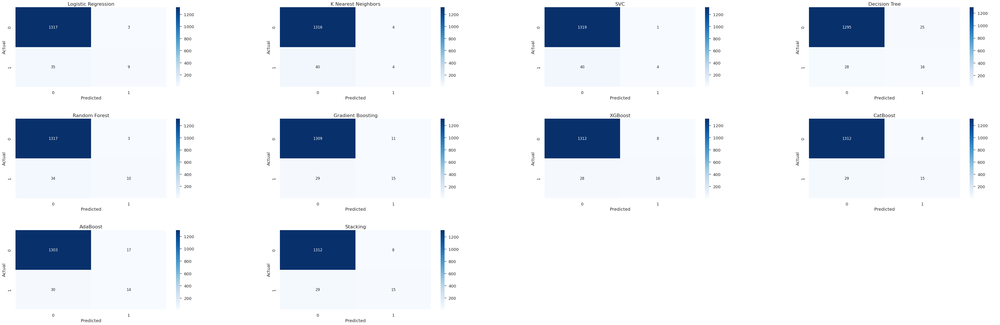

In [ ]:
conf_matrixes = [conf_matrix_lr, conf_matrix_knn, conf_matrix_svc, conf_matrix_dt,
                                 conf_matrix_rf, conf_matrix_gb, conf_matrix_xgb, conf_matrix_cb,
                                 conf_matrix_ada, conf_matrix_st]

heat_cms = [pd.DataFrame(cm, columns=np.unique(y_test), index=np.unique(y_test)) for cm in conf_matrixes]

for heat_cm in heat_cms:
    heat_cm.index.name = 'Actual'
    heat_cm.columns.name = 'Predicted'

fig, axes = plt.subplots(3, 4, figsize=(24, 18))
fig.subplots_adjust(left=None, bottom=None, right=2, top=None, wspace=0.4, hspace=0.4)

model_titles = ['Logistic Regression', 'K Nearest Neighbors', 'SVC', 'Decision Tree',
                'Random Forest', 'Gradient Boosting', 'XGBoost', 'CatBoost',
                'AdaBoost', 'Stacking']

for ax, heat_cm, title in zip(axes.flatten(), heat_cms, model_titles):
    sns.heatmap(heat_cm, cmap="Blues", annot=True, annot_kws={"size": 12}, fmt='g', ax=ax)
    ax.set_title(title, fontsize=16)

for ax in axes.flatten()[len(model_titles):]:
    ax.axis('off')

plt.show()

##RFECV

In [ ]:
X_train_reduced.shape,X_test_reduced.shape

((5455, 50), (1364, 50))

###Logistic Regression

In [ ]:
logistic_regression = LogisticRegression()
lr_model_reduced = logistic_regression.fit(X_train_reduced, y_train_reduced)
y_pred_reduced_logis = lr_model_reduced.predict(X_test_reduced)

print(confusion_matrix(y_test_reduced, y_pred_reduced_logis))
print(classification_report(y_test_reduced, y_pred_reduced_logis))

[[1010  310]
 [   8   36]]
              precision    recall  f1-score   support

           0       0.99      0.77      0.86      1320
           1       0.10      0.82      0.18        44

    accuracy                           0.77      1364
   macro avg       0.55      0.79      0.52      1364
weighted avg       0.96      0.77      0.84      1364



###K Nearest Neighbor

In [ ]:
knn_classifier = KNeighborsClassifier(n_neighbors=11)
knn_model_reduced = knn_classifier.fit(X_train_reduced, y_train_reduced)
y_pred_reduced_knn = knn_classifier.predict(X_test_reduced)

print(confusion_matrix(y_test_reduced, y_pred_reduced_knn))
print(classification_report(y_test_reduced, y_pred_reduced_knn))

[[1320    0]
 [  44    0]]
              precision    recall  f1-score   support

           0       0.97      1.00      0.98      1320
           1       0.00      0.00      0.00        44

    accuracy                           0.97      1364
   macro avg       0.48      0.50      0.49      1364
weighted avg       0.94      0.97      0.95      1364



###SVC

In [ ]:
svc_classifier = SVC(probability=True)
svc_model_reduced = svc_classifier.fit(X_train_reduced, y_train_reduced)
y_pred_reduced_svc = svc_classifier.predict(X_test_reduced)

print(confusion_matrix(y_test_reduced, y_pred_reduced_svc))
print(classification_report(y_test_reduced, y_pred_reduced_svc))

[[1320    0]
 [  44    0]]
              precision    recall  f1-score   support

           0       0.97      1.00      0.98      1320
           1       0.00      0.00      0.00        44

    accuracy                           0.97      1364
   macro avg       0.48      0.50      0.49      1364
weighted avg       0.94      0.97      0.95      1364



###Decision Tree

In [ ]:
dt_classifier = DecisionTreeClassifier()
dt_model_reduced = dt_classifier.fit(X_train_reduced, y_train_reduced)
y_pred_reduced_Tree = dt_classifier.predict(X_test_reduced)

print(confusion_matrix(y_test_reduced, y_pred_reduced_Tree))
print(classification_report(y_test_reduced, y_pred_reduced_Tree))

[[911 409]
 [ 39   5]]
              precision    recall  f1-score   support

           0       0.96      0.69      0.80      1320
           1       0.01      0.11      0.02        44

    accuracy                           0.67      1364
   macro avg       0.49      0.40      0.41      1364
weighted avg       0.93      0.67      0.78      1364



###Random forest

In [ ]:
clf_RF = RandomForestClassifier()
rf_model_reduced = clf_RF.fit(X_train_reduced, y_train_reduced)
y_pred_reduced_RF = clf_RF.predict(X_test_reduced)

print(confusion_matrix(y_test_reduced, y_pred_reduced_RF))
print(classification_report(y_test_reduced, y_pred_reduced_RF))

[[1278   42]
 [  34   10]]
              precision    recall  f1-score   support

           0       0.97      0.97      0.97      1320
           1       0.19      0.23      0.21        44

    accuracy                           0.94      1364
   macro avg       0.58      0.60      0.59      1364
weighted avg       0.95      0.94      0.95      1364



###Gradient Boosting

In [ ]:
gb = GradientBoostingClassifier()
gb_model_reduced = gb.fit(X_train_reduced, y_train_reduced)
y_pred_reduced_gb = gb.predict(X_test_reduced)

print(confusion_matrix(y_test_reduced, y_pred_reduced_gb))
print(classification_report(y_test_reduced, y_pred_reduced_gb))

[[  14 1306]
 [   1   43]]
              precision    recall  f1-score   support

           0       0.93      0.01      0.02      1320
           1       0.03      0.98      0.06        44

    accuracy                           0.04      1364
   macro avg       0.48      0.49      0.04      1364
weighted avg       0.90      0.04      0.02      1364



###XGBoost

In [ ]:
xgb = XGBClassifier()
xgb_model_reduced = xgb.fit(X_train_reduced, y_train_reduced)
y_pred_reduced_xgb = xgb.predict(X_test_reduced)

print(confusion_matrix(y_test_reduced, y_pred_reduced_xgb))
print(classification_report(y_test_reduced, y_pred_reduced_xgb))

[[1236   84]
 [  24   20]]
              precision    recall  f1-score   support

           0       0.98      0.94      0.96      1320
           1       0.19      0.45      0.27        44

    accuracy                           0.92      1364
   macro avg       0.59      0.70      0.61      1364
weighted avg       0.96      0.92      0.94      1364



###Catboost

In [ ]:
catboost_model = CatBoostClassifier()
cb_model_reduced = catboost_model.fit(X_train_reduced, y_train_reduced)
y_pred_reduced_catboost = catboost_model.predict(X_test_reduced)

print(confusion_matrix(y_test_reduced, y_pred_reduced_catboost))
print(classification_report(y_test_reduced, y_pred_reduced_catboost))

Learning rate set to 0.021259
0:	learn: 0.6421753	total: 18.9ms	remaining: 18.9s
1:	learn: 0.5992750	total: 32.8ms	remaining: 16.3s
2:	learn: 0.5598034	total: 46.5ms	remaining: 15.4s
3:	learn: 0.5234367	total: 60.7ms	remaining: 15.1s
4:	learn: 0.4910900	total: 74.3ms	remaining: 14.8s
5:	learn: 0.4620024	total: 88.2ms	remaining: 14.6s
6:	learn: 0.4336252	total: 107ms	remaining: 15.1s
7:	learn: 0.4081442	total: 129ms	remaining: 15.9s
8:	learn: 0.3841290	total: 146ms	remaining: 16.1s
9:	learn: 0.3648443	total: 160ms	remaining: 15.8s
10:	learn: 0.3447064	total: 175ms	remaining: 15.8s
11:	learn: 0.3241447	total: 189ms	remaining: 15.5s
12:	learn: 0.3042373	total: 207ms	remaining: 15.7s
13:	learn: 0.2868928	total: 221ms	remaining: 15.5s
14:	learn: 0.2730482	total: 234ms	remaining: 15.4s
15:	learn: 0.2598134	total: 249ms	remaining: 15.3s
16:	learn: 0.2483815	total: 262ms	remaining: 15.2s
17:	learn: 0.2367533	total: 276ms	remaining: 15.1s
18:	learn: 0.2268402	total: 291ms	remaining: 15s
19:	lea

###Adaboost

In [ ]:
ada_classifier = AdaBoostClassifier()
ada_model_reduced = ada_classifier.fit(X_train_reduced, y_train_reduced)
y_pred_reduced_ada = ada_classifier.predict(X_test_reduced)

print(confusion_matrix(y_test_reduced, y_pred_reduced_ada))
print(classification_report(y_test_reduced, y_pred_reduced_ada))

[[525 795]
 [  4  40]]
              precision    recall  f1-score   support

           0       0.99      0.40      0.57      1320
           1       0.05      0.91      0.09        44

    accuracy                           0.41      1364
   macro avg       0.52      0.65      0.33      1364
weighted avg       0.96      0.41      0.55      1364



###Stacking

In [ ]:
stacking_classifier = StackingClassifier(
    estimators=[
        ('ET', ExtraTreesClassifier()),
        ('XGB', XGBClassifier()),
        ('ADA', AdaBoostClassifier())
    ],
    final_estimator=RandomForestClassifier(),
    verbose=2
)
st_model_reduced = stacking_classifier.fit(X_train_reduced, y_train_reduced)
y_pred_reduced_stacking = stacking_classifier.predict(X_test_reduced)

print(confusion_matrix(y_test_reduced, y_pred_reduced_stacking))
print(classification_report(y_test_reduced, y_pred_reduced_stacking))

[[1125  195]
 [  28   16]]
              precision    recall  f1-score   support

           0       0.98      0.85      0.91      1320
           1       0.08      0.36      0.13        44

    accuracy                           0.84      1364
   macro avg       0.53      0.61      0.52      1364
weighted avg       0.95      0.84      0.88      1364



##RFECV results

###ROC curves

In [ ]:
y_proba_lr_reduced = lr_model_reduced.predict_proba(X_test_reduced)[:, 1]
y_proba_knn_reduced = knn_model_reduced.predict_proba(X_test_reduced)[:, 1]
y_proba_svc_reduced = svc_model_reduced.predict_proba(X_test_reduced)[:, 1]
y_proba_dt_reduced = dt_model_reduced.predict_proba(X_test_reduced)[:, 1]
y_proba_rf_reduced = rf_model_reduced.predict_proba(X_test_reduced)[:, 1]
y_proba_gb_reduced = gb_model_reduced.predict_proba(X_test_reduced)[:, 1]
y_proba_xgb_reduced = xgb_model_reduced.predict_proba(X_test_reduced)[:, 1]
y_proba_cb_reduced = cb_model_reduced.predict_proba(X_test_reduced)[:, 1]
y_proba_ada_reduced = ada_model_reduced.predict_proba(X_test_reduced)[:, 1]
y_proba_st_reduced = st_model_reduced.predict_proba(X_test_reduced)[:, 1]

In [ ]:
roc_auc_lr = roc_auc_score(y_test_reduced, y_proba_lr_reduced)
fpr_knn, tpr_knn, thresholds_knn = roc_curve(y_test_reduced, y_proba_knn_reduced)
fpr_svc, tpr_svc, thresholds_svc = roc_curve(y_test_reduced, y_proba_svc_reduced)
fpr_dt, tpr_dt, thresholds_dt = roc_curve(y_test_reduced, y_proba_dt)
fpr_rf, tpr_rf, thresholds_rf = roc_curve(y_test_reduced, y_proba_rf_reduced)
fpr_gb, tpr_gb, thresholds_gb = roc_curve(y_test_reduced, y_proba_gb_reduced)
fpr_xgb, tpr_xgb, thresholds_xgb = roc_curve(y_test_reduced, y_proba_xgb_reduced)
fpr_cb, tpr_cb, thresholds_cb = roc_curve(y_test_reduced, y_proba_cb_reduced)
fpr_ada, tpr_ada, thresholds_ada = roc_curve(y_test_reduced, y_proba_ada_reduced)
fpr_st, tpr_st, thresholds_st = roc_curve(y_test_reduced, y_proba_st_reduced)

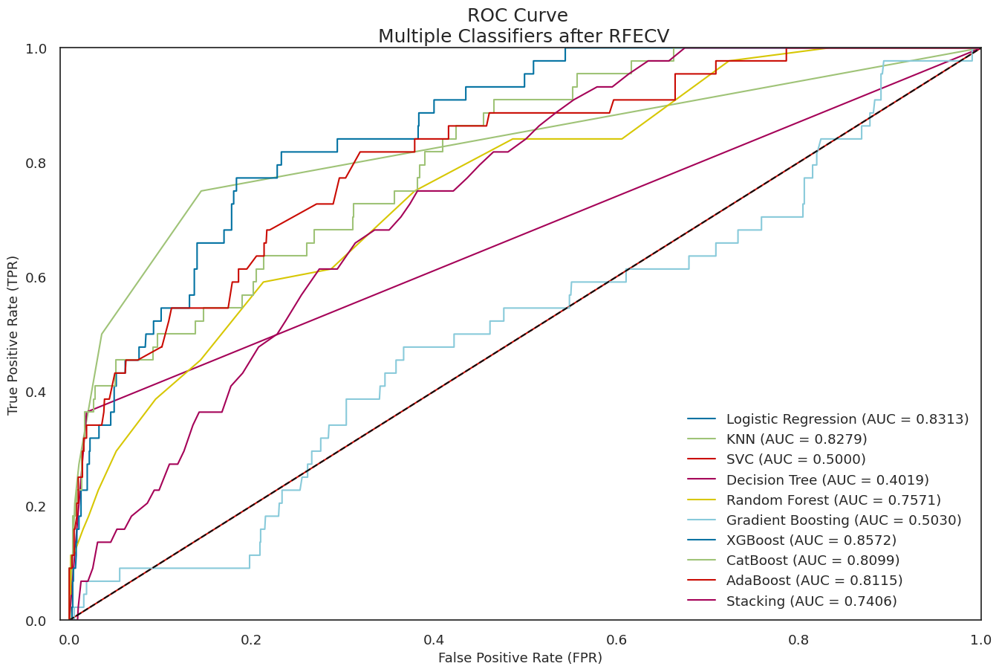

In [ ]:
def graph_roc_curve_multiple(roc_auc_lr, fpr_knn, tpr_knn, fpr_svc, tpr_svc,
                            fpr_dt, tpr_dt, fpr_rf, tpr_rf, fpr_gb, tpr_gb,
                            fpr_xgb, tpr_xgb, fpr_cb, tpr_cb, fpr_ada, tpr_ada,
                            fpr_st, tpr_st):
    plt.figure(figsize=(16,10))
    plt.title('ROC Curve \n Multiple Classifiers after RFECV', fontsize=18)
    plt.plot(roc_auc_lr, label='Logistic Regression (AUC = {:.4f})'.format(roc_auc_score(y_test_reduced, y_proba_lr_reduced)))
    plt.plot(fpr_knn, tpr_knn, label='KNN (AUC = {:.4f})'.format(roc_auc_score(y_test_reduced, y_proba_knn_reduced)))
    plt.plot(fpr_svc, tpr_svc, label='SVC (AUC = {:.4f})'.format(roc_auc_score(y_test_reduced, y_proba_svc_reduced)))
    plt.plot(fpr_dt, tpr_dt, label='Decision Tree (AUC = {:.4f})'.format(roc_auc_score(y_test_reduced, y_proba_dt_reduced)))
    plt.plot(fpr_rf, tpr_rf, label='Random Forest (AUC = {:.4f})'.format(roc_auc_score(y_test_reduced, y_proba_rf_reduced)))
    plt.plot(fpr_gb, tpr_gb, label='Gradient Boosting (AUC = {:.4f})'.format(roc_auc_score(y_test_reduced, y_proba_gb_reduced)))
    plt.plot(fpr_xgb, tpr_xgb, label='XGBoost (AUC = {:.4f})'.format(roc_auc_score(y_test_reduced, y_proba_xgb_reduced)))
    plt.plot(fpr_cb, tpr_cb, label='CatBoost (AUC = {:.4f})'.format(roc_auc_score(y_test_reduced, y_proba_cb_reduced)))
    plt.plot(fpr_ada, tpr_ada, label='AdaBoost (AUC = {:.4f})'.format(roc_auc_score(y_test_reduced, y_proba_ada_reduced)))
    plt.plot(fpr_st, tpr_st, label='Stacking (AUC = {:.4f})'.format(roc_auc_score(y_test_reduced, y_proba_st_reduced)))
    plt.plot([0, 1], [0, 1], 'k--')
    plt.axis([-0.01, 1, 0, 1])
    plt.xlabel('False Positive Rate (FPR)', fontsize=13)
    plt.ylabel('True Positive Rate (TPR)', fontsize=13)
    plt.legend(loc='lower right')

# Gọi hàm để vẽ đường cong ROC cho mỗi mô hình
graph_roc_curve_multiple(roc_auc_lr, fpr_knn, tpr_knn, fpr_svc, tpr_svc,
                         fpr_dt, tpr_dt, fpr_rf, tpr_rf, fpr_gb, tpr_gb,
                         fpr_xgb, tpr_xgb, fpr_cb, tpr_cb, fpr_ada, tpr_ada,
                         fpr_st, tpr_st)
plt.show()

###Precision-Recall curves

In [ ]:
precision_lr, recall_lr, _ = precision_recall_curve(y_test_reduced, y_proba_lr_reduced)
precision_knn, recall_knn, _ = precision_recall_curve(y_test_reduced, y_proba_knn_reduced)
precision_svc, recall_svc, _ = precision_recall_curve(y_test_reduced, y_proba_svc_reduced)
precision_dt, recall_dt, _ = precision_recall_curve(y_test_reduced, y_proba_dt_reduced)
precision_rf, recall_rf, _ = precision_recall_curve(y_test_reduced, y_proba_rf_reduced)
precision_gb, recall_gb, _ = precision_recall_curve(y_test_reduced, y_proba_gb_reduced)
precision_xgb, recall_xgb, _ = precision_recall_curve(y_test_reduced, y_proba_xgb_reduced)
precision_cb, recall_cb, _ = precision_recall_curve(y_test_reduced, y_proba_cb_reduced)
precision_ada, recall_ada, _ = precision_recall_curve(y_test_reduced, y_proba_ada_reduced)
precision_st, recall_st, _ = precision_recall_curve(y_test_reduced, y_proba_st_reduced)

In [ ]:
auc_lr = auc(recall_lr, precision_lr)
auc_knn = auc(recall_knn, precision_knn)
auc_svc = auc(recall_svc, precision_svc)
auc_dt = auc(recall_dt, precision_dt)
auc_rf = auc(recall_rf, precision_rf)
auc_gb = auc(recall_gb, precision_gb)
auc_xgb = auc(recall_xgb, precision_xgb)
auc_cb = auc(recall_cb, precision_cb)
auc_ada = auc(recall_ada, precision_ada)
auc_st = auc(recall_st, precision_st)

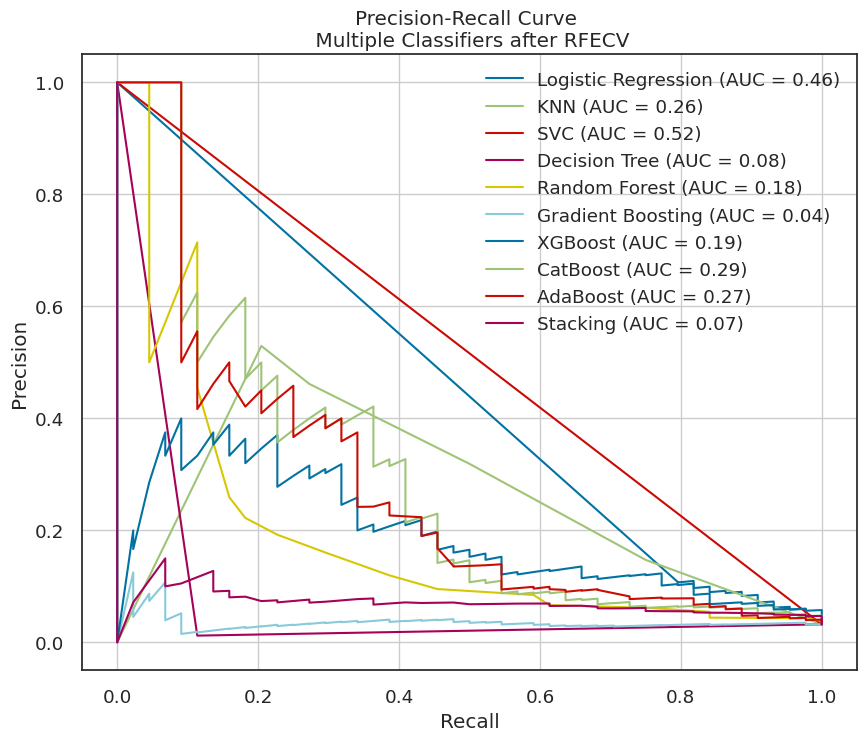

In [ ]:
plt.figure(figsize=(10, 8))

plt.plot(recall_lr, precision_lr, label=f'Logistic Regression (AUC = {auc_lr:.2f})')
plt.plot(recall_knn, precision_knn, label=f'KNN (AUC = {auc_knn:.2f})')
plt.plot(recall_svc, precision_svc, label=f'SVC (AUC = {auc_svc:.2f})')
plt.plot(recall_dt, precision_dt, label=f'Decision Tree (AUC = {auc_dt:.2f})')
plt.plot(recall_rf, precision_rf, label=f'Random Forest (AUC = {auc_rf:.2f})')
plt.plot(recall_gb, precision_gb, label=f'Gradient Boosting (AUC = {auc_gb:.2f})')
plt.plot(recall_xgb, precision_xgb, label=f'XGBoost (AUC = {auc_xgb:.2f})')
plt.plot(recall_cb, precision_cb, label=f'CatBoost (AUC = {auc_cb:.2f})')
plt.plot(recall_ada, precision_ada, label=f'AdaBoost (AUC = {auc_ada:.2f})')
plt.plot(recall_st, precision_st, label=f'Stacking (AUC = {auc_st:.2f})')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve \n Multiple Classifiers after RFECV')
plt.legend(loc='best')
plt.grid(True)
plt.show()

###Confussion matrix

In [ ]:
conf_matrix_lr_reduced = confusion_matrix(y_test_reduced, y_pred_reduced_logis)
conf_matrix_knn_reduced = confusion_matrix(y_test_reduced, y_pred_reduced_knn)
conf_matrix_svc_reduced = confusion_matrix(y_test_reduced, y_pred_reduced_svc)
conf_matrix_dt_reduced = confusion_matrix(y_test_reduced, y_pred_reduced_Tree)
conf_matrix_rf_reduced = confusion_matrix(y_test_reduced, y_pred_reduced_RF)
conf_matrix_gb_reduced = confusion_matrix(y_test_reduced, y_pred_reduced_gb)
conf_matrix_xgb_reduced = confusion_matrix(y_test_reduced, y_pred_reduced_xgb)
conf_matrix_cb_reduced = confusion_matrix(y_test_reduced, y_pred_reduced_catboost)
conf_matrix_ada_reduced = confusion_matrix(y_test_reduced, y_pred_reduced_ada)
conf_matrix_st_reduced = confusion_matrix(y_test_reduced, y_pred_reduced_stacking)

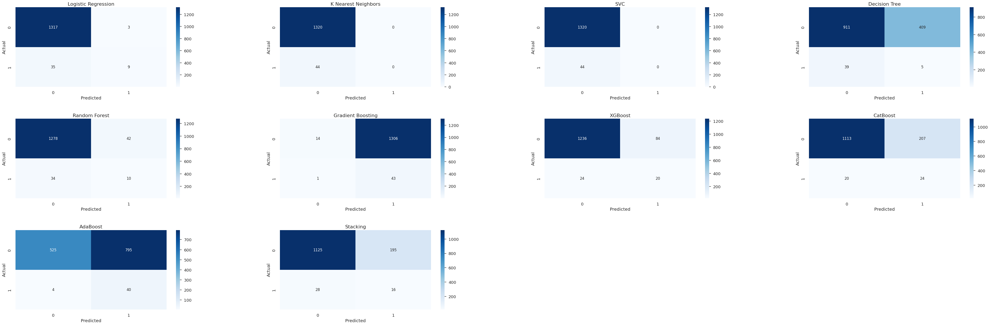

In [ ]:
conf_matrixes = [conf_matrix_lr, conf_matrix_knn_reduced, conf_matrix_svc_reduced, conf_matrix_dt_reduced,
                                 conf_matrix_rf_reduced, conf_matrix_gb_reduced, conf_matrix_xgb_reduced, conf_matrix_cb_reduced,
                                 conf_matrix_ada_reduced, conf_matrix_st_reduced]

heat_cms = [pd.DataFrame(cm, columns=np.unique(y_test_reduced), index=np.unique(y_test_reduced)) for cm in conf_matrixes]

for heat_cm in heat_cms:
    heat_cm.index.name = 'Actual'
    heat_cm.columns.name = 'Predicted'

fig, axes = plt.subplots(3, 4, figsize=(24, 18))
fig.subplots_adjust(left=None, bottom=None, right=2, top=None, wspace=0.4, hspace=0.4)

model_titles = ['Logistic Regression', 'K Nearest Neighbors', 'SVC', 'Decision Tree',
                'Random Forest', 'Gradient Boosting', 'XGBoost', 'CatBoost',
                'AdaBoost', 'Stacking']

for ax, heat_cm, title in zip(axes.flatten(), heat_cms, model_titles):
    sns.heatmap(heat_cm, cmap="Blues", annot=True, annot_kws={"size": 12}, fmt='g', ax=ax)
    ax.set_title(title, fontsize=16)

for ax in axes.flatten()[len(model_titles):]:
    ax.axis('off')

plt.show()

##Feature Engineering

In [ ]:
df_fe = df_reduced.copy()

In [ ]:
# Profitability Ratios
df_fe['ROA'] = df_reduced['NetIncometoTotalAssets']
df_fe['ROE'] = df_reduced['NetIncometoStockholder\'sEquity']

# Ensure division is handled safely, consider adding a small number like 1e-9 to denominator if zero division is possible
df_fe['OperatingMargin'] = np.divide(df_reduced['Operatingprofit/Paid-incapital'], df_reduced['TotalAssetGrowthRate'] + 1e-9)

# Leverage Ratios
df_fe['DebtToEquity'] = df_reduced['Totaldebt/Totalnetworth']
df_fe['InterestCoverage'] = df_reduced['InterestCoverageRatio(InterestexpensetoEBIT)']

# Liquidity Ratios
# Safe division approach as mentioned above
df_fe['CurrentRatio'] = np.divide(df_reduced['CurrentAssets/TotalAssets'], df_reduced['CurrentLiabilitytoAssets'] + 1e-9)
df_fe['QuickRatioEnhanced'] = np.divide(df_reduced['QuickAssets/TotalAssets'], df_reduced['CurrentLiabilitytoAssets'] + 1e-9)

# Efficiency Ratios
df_fe['AssetTurnover'] = np.divide(df_reduced['Revenueperperson'], df_reduced['TotalAssetReturnGrowthRateRatio'] + 1e-9)
df_fe['InventoryTurnover'] = np.divide(1, df_reduced['AverageCollectionDays'] + 1e-9)

# Additional Combinations to Explore Interactions
df_fe['LeverageToOperating'] = df_fe['DebtToEquity'] * df_fe['OperatingMargin']
df_fe['ROAToInterestCoverage'] = df_fe['ROA'] * df_fe['InterestCoverage']

In [ ]:
df_fe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 62 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   ROA(A)beforeinterestand%aftertax              6819 non-null   float64
 1   ROA(B)beforeinterestanddepreciationaftertax   6819 non-null   float64
 2   Non-industryincomeandexpenditure/revenue      6819 non-null   float64
 3   Continuousinterestrate(aftertax)              6819 non-null   float64
 4   Interest-bearingdebtinterestrate              6819 non-null   float64
 5   NetValuePerShare(B)                           6819 non-null   float64
 6   NetValuePerShare(A)                           6819 non-null   float64
 7   NetValuePerShare(C)                           6819 non-null   float64
 8   PersistentEPSintheLastFourSeasons             6819 non-null   float64
 9   OperatingProfitPerShare(Yuan¥)                6819 non-null   f

In [ ]:
print("Infinite values in each column:\n", np.isinf(df_fe).sum())
print("NaN values in each column:\n", df_fe.isna().sum())

Infinite values in each column:
 ROA(A)beforeinterestand%aftertax               0
ROA(B)beforeinterestanddepreciationaftertax    0
Non-industryincomeandexpenditure/revenue       0
Continuousinterestrate(aftertax)               0
Interest-bearingdebtinterestrate               0
                                              ..
QuickRatioEnhanced                             0
AssetTurnover                                  0
InventoryTurnover                              0
LeverageToOperating                            0
ROAToInterestCoverage                          0
Length: 62, dtype: int64
NaN values in each column:
 ROA(A)beforeinterestand%aftertax               0
ROA(B)beforeinterestanddepreciationaftertax    0
Non-industryincomeandexpenditure/revenue       0
Continuousinterestrate(aftertax)               0
Interest-bearingdebtinterestrate               0
                                              ..
QuickRatioEnhanced                             0
AssetTurnover                   

In [ ]:
df_fe.replace([np.inf, -np.inf], np.nan, inplace=True)
for column in df_fe.columns:
    df_fe[column].fillna(df_fe[column].mean(), inplace=True)

###Train test split

In [ ]:
X_fe = df_fe.drop(columns="Bankrupt?")
y_fe = df_fe['Bankrupt?']

X_train_fe, X_test_fe, y_train_fe, y_test_fe = train_test_split(X_fe, y_fe, test_size=0.2, random_state=42, stratify=y_fe)

print("Kích thước X_train_fe:", X_train_fe.shape)
print("Kích thước X_test_fe:", X_test_fe.shape)
print("Kích thước y_train_fe:", y_train_fe.shape)
print("Kích thước y_test_fe:", y_test_fe.shape)

Kích thước X_train_fe: (5455, 61)
Kích thước X_test_fe: (1364, 61)
Kích thước y_train_fe: (5455,)
Kích thước y_test_fe: (1364,)


###RFECV

In [ ]:
cart = RandomForestClassifier(random_state=42)
min_features_to_select = 1
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=1, random_state=1)

rfecv_fe = RFECV(estimator=cart, step=1, cv=cv,
              scoring='accuracy',
              min_features_to_select=min_features_to_select, n_jobs=1)

rfecv_fe.fit(X_train_fe, y_train_fe)

print("Optimal number of features : %d" % rfecv_fe.n_features_)

Optimal number of features : 31


In [ ]:
X_train_fe = rfecv_fe.transform(X_train_fe)
X_test_fe = rfecv_fe.transform(X_test_fe)

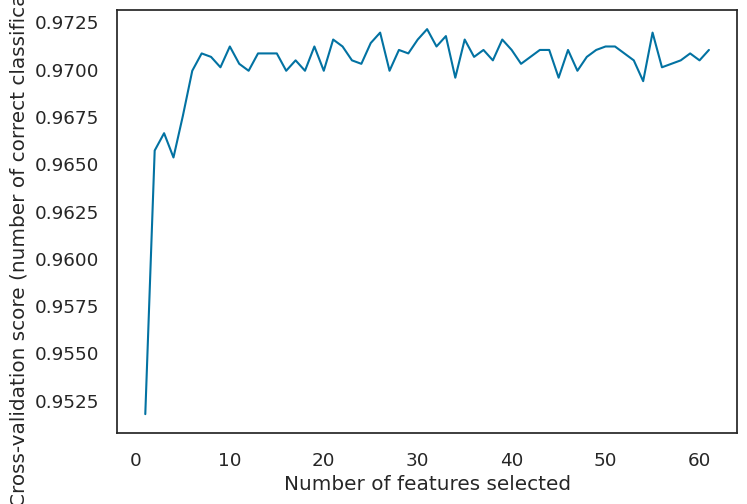

In [ ]:
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Cross-validation score (number of correct classifications)")

mean_scores = rfecv_fe.cv_results_['mean_test_score']
number_of_features_range = range(min_features_to_select, min_features_to_select + len(mean_scores))

plt.plot(number_of_features_range, mean_scores)
plt.show()

In [ ]:
most_relevent_cols_fe = df_fe.iloc[:, 1:].columns[np.where(rfecv_fe.support_ == True)]
print("Most relevant features are: ")
print(most_relevent_cols_fe)

Most relevant features are: 
Index(['Continuousinterestrate(aftertax)', 'Interest-bearingdebtinterestrate',
       'NetValuePerShare(B)', 'NetValuePerShare(A)', 'NetValuePerShare(C)',
       'PersistentEPSintheLastFourSeasons', 'OperatingProfitPerShare(Yuan¥)',
       'TotalAssetGrowthRate', 'TotalAssetReturnGrowthRateRatio',
       'InterestExpenseRatio', 'Totaldebt/Totalnetworth', 'Debtratio%',
       'Networth/Assets', 'Borrowingdependency',
       'Operatingprofit/Paid-incapital', 'AccountsReceivableTurnover',
       'AverageCollectionDays', 'Revenueperperson',
       'WorkingCapitaltoTotalAssets', 'QuickAssets/CurrentLiability',
       'Cash/CurrentLiability', 'CurrentLiabilitytoAssets',
       'CurrentLiabilities/Liability', 'Totalincome/Totalexpense',
       'NetIncometoStockholder'sEquity', 'LiabilitytoEquity',
       'InterestCoverageRatio(InterestexpensetoEBIT)', 'Bankrupt?', 'ROE',
       'InterestCoverage', 'ROAToInterestCoverage'],
      dtype='object')


In [ ]:
most_relevent_cols_fe = list(most_relevent_cols_fe)
most_relevent_cols_fe.append("Bankrupt?")

In [ ]:
df_fe = df_fe[most_relevent_cols_fe]
df_fe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 32 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   Continuousinterestrate(aftertax)              6819 non-null   float64
 1   Interest-bearingdebtinterestrate              6819 non-null   float64
 2   NetValuePerShare(B)                           6819 non-null   float64
 3   NetValuePerShare(A)                           6819 non-null   float64
 4   NetValuePerShare(C)                           6819 non-null   float64
 5   PersistentEPSintheLastFourSeasons             6819 non-null   float64
 6   OperatingProfitPerShare(Yuan¥)                6819 non-null   float64
 7   TotalAssetGrowthRate                          6819 non-null   float64
 8   TotalAssetReturnGrowthRateRatio               6819 non-null   float64
 9   InterestExpenseRatio                          6819 non-null   f

###Logistic Regression

In [ ]:
logistic_regression = LogisticRegression()
lr_model_fe = logistic_regression.fit(X_train_fe, y_train_fe)
y_pred_fe_logis = logistic_regression.predict(X_test_fe)

print(confusion_matrix(y_test_fe, y_pred_fe_logis))
print(classification_report(y_test_fe, y_pred_fe_logis))

[[1320    0]
 [  42    2]]
              precision    recall  f1-score   support

           0       0.97      1.00      0.98      1320
           1       1.00      0.05      0.09        44

    accuracy                           0.97      1364
   macro avg       0.98      0.52      0.54      1364
weighted avg       0.97      0.97      0.96      1364



###K Nearest Neighbor

In [ ]:
knn_classifier = KNeighborsClassifier(n_neighbors=11)
knn_model_fe = knn_classifier.fit(X_train_fe, y_train_fe)
y_pred_fe_knn = knn_classifier.predict(X_test_fe)

print(confusion_matrix(y_test_fe, y_pred_fe_knn))
print(classification_report(y_test_fe, y_pred_fe_knn))

[[1315    5]
 [  36    8]]
              precision    recall  f1-score   support

           0       0.97      1.00      0.98      1320
           1       0.62      0.18      0.28        44

    accuracy                           0.97      1364
   macro avg       0.79      0.59      0.63      1364
weighted avg       0.96      0.97      0.96      1364



###SVC

In [ ]:
svc_classifier = SVC(probability=True)
svc_model_fe = svc_classifier.fit(X_train_fe, y_train_fe)
y_pred_fe_svc = svc_classifier.predict(X_test_fe)

print(confusion_matrix(y_test_fe, y_pred_fe_svc))
print(classification_report(y_test_fe, y_pred_fe_svc))

[[1320    0]
 [  44    0]]
              precision    recall  f1-score   support

           0       0.97      1.00      0.98      1320
           1       0.00      0.00      0.00        44

    accuracy                           0.97      1364
   macro avg       0.48      0.50      0.49      1364
weighted avg       0.94      0.97      0.95      1364



###Decision Tree

In [ ]:
dt_classifier = DecisionTreeClassifier()
dt_model_fe = dt_classifier.fit(X_train_fe, y_train_fe)
y_pred_fe_Tree = dt_classifier.predict(X_test_fe)

print(confusion_matrix(y_test_fe, y_pred_fe_Tree))
print(classification_report(y_test_fe, y_pred_fe_Tree))

[[1273   47]
 [  29   15]]
              precision    recall  f1-score   support

           0       0.98      0.96      0.97      1320
           1       0.24      0.34      0.28        44

    accuracy                           0.94      1364
   macro avg       0.61      0.65      0.63      1364
weighted avg       0.95      0.94      0.95      1364



###Random forest

In [ ]:
clf_RF = RandomForestClassifier()
rf_model_fe = clf_RF.fit(X_train_fe, y_train_fe)
y_pred_fe_RF = clf_RF.predict(X_test_fe)

print(confusion_matrix(y_test_fe, y_pred_fe_RF))
print(classification_report(y_test_fe, y_pred_fe_RF))

[[1316    4]
 [  34   10]]
              precision    recall  f1-score   support

           0       0.97      1.00      0.99      1320
           1       0.71      0.23      0.34        44

    accuracy                           0.97      1364
   macro avg       0.84      0.61      0.67      1364
weighted avg       0.97      0.97      0.97      1364



###Gradient Boosting

In [ ]:
gb = GradientBoostingClassifier()
gb_model_fe = gb.fit(X_train_fe, y_train_fe)
y_pred_fe_gb = gb.predict(X_test_fe)

print(confusion_matrix(y_test_fe, y_pred_fe_gb))
print(classification_report(y_test_fe, y_pred_fe_gb))

[[1309   11]
 [  33   11]]
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      1320
           1       0.50      0.25      0.33        44

    accuracy                           0.97      1364
   macro avg       0.74      0.62      0.66      1364
weighted avg       0.96      0.97      0.96      1364



###XGBoost

In [ ]:
xgb = XGBClassifier()
xgb_model_fe = xgb.fit(X_train_fe, y_train_fe)
y_pred_fe_xgb = xgb.predict(X_test_fe)

print(confusion_matrix(y_test_fe, y_pred_fe_xgb))
print(classification_report(y_test_fe, y_pred_fe_xgb))

[[1311    9]
 [  32   12]]
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      1320
           1       0.57      0.27      0.37        44

    accuracy                           0.97      1364
   macro avg       0.77      0.63      0.68      1364
weighted avg       0.96      0.97      0.96      1364



###Catboost

In [ ]:
catboost_model = CatBoostClassifier()
cb_model_fe = catboost_model.fit(X_train_fe, y_train_fe)
y_pred_fe_catboost = catboost_model.predict(X_test_fe)

print(confusion_matrix(y_test_fe, y_pred_fe_catboost))
print(classification_report(y_test_fe, y_pred_fe_catboost))

Learning rate set to 0.021259
0:	learn: 0.6457824	total: 10.1ms	remaining: 10.1s
1:	learn: 0.6048086	total: 19.6ms	remaining: 9.79s
2:	learn: 0.5636857	total: 29.3ms	remaining: 9.73s
3:	learn: 0.5259399	total: 38.7ms	remaining: 9.63s
4:	learn: 0.4935851	total: 47.9ms	remaining: 9.54s
5:	learn: 0.4612686	total: 59.5ms	remaining: 9.85s
6:	learn: 0.4336439	total: 68.6ms	remaining: 9.74s
7:	learn: 0.4084860	total: 77.6ms	remaining: 9.63s
8:	learn: 0.3845259	total: 87.1ms	remaining: 9.59s
9:	learn: 0.3608700	total: 96.4ms	remaining: 9.55s
10:	learn: 0.3421631	total: 106ms	remaining: 9.51s
11:	learn: 0.3233126	total: 115ms	remaining: 9.48s
12:	learn: 0.3064513	total: 126ms	remaining: 9.54s
13:	learn: 0.2904173	total: 135ms	remaining: 9.52s
14:	learn: 0.2749610	total: 149ms	remaining: 9.79s
15:	learn: 0.2629472	total: 158ms	remaining: 9.74s
16:	learn: 0.2491906	total: 168ms	remaining: 9.69s
17:	learn: 0.2376472	total: 177ms	remaining: 9.64s
18:	learn: 0.2277308	total: 186ms	remaining: 9.61s
1

###Adaboost

In [ ]:
ada_classifier = AdaBoostClassifier()
ada_model_fe = ada_classifier.fit(X_train_fe, y_train_fe)
y_pred_fe_ada = ada_classifier.predict(X_test_fe)

print(confusion_matrix(y_test_fe, y_pred_fe_ada))
print(classification_report(y_test_fe, y_pred_fe_ada))

[[1304   16]
 [  36    8]]
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1320
           1       0.33      0.18      0.24        44

    accuracy                           0.96      1364
   macro avg       0.65      0.58      0.61      1364
weighted avg       0.95      0.96      0.96      1364



###Stacking

In [ ]:
stacking_classifier = StackingClassifier(
    estimators=[
        ('ET', ExtraTreesClassifier()),
        ('XGB', XGBClassifier()),
        ('ADA', AdaBoostClassifier())
    ],
    final_estimator=RandomForestClassifier(),
    verbose=2
)

st_model_fe = stacking_classifier.fit(X_train_fe, y_train_fe)
y_pred_fe_stacking = stacking_classifier.predict(X_test_fe)

print(confusion_matrix(y_test_fe, y_pred_fe_stacking))
print(classification_report(y_test_fe, y_pred_fe_stacking))

[[1305   15]
 [  35    9]]
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1320
           1       0.38      0.20      0.26        44

    accuracy                           0.96      1364
   macro avg       0.67      0.60      0.62      1364
weighted avg       0.95      0.96      0.96      1364



##Feature Engineering results

###ROC curves

In [ ]:
y_proba_lr_fe = lr_model_fe.predict_proba(X_test_fe)[:, 1]
y_proba_knn_fe = knn_model_fe.predict_proba(X_test_fe)[:, 1]
y_proba_svc_fe = svc_model_fe.predict_proba(X_test_fe)[:, 1]
y_proba_dt_fe = dt_model_fe.predict_proba(X_test_fe)[:, 1]
y_proba_rf_fe = rf_model_fe.predict_proba(X_test_fe)[:, 1]
y_proba_gb_fe = gb_model_fe.predict_proba(X_test_fe)[:, 1]
y_proba_xgb_fe = xgb_model_fe.predict_proba(X_test_fe)[:, 1]
y_proba_cb_fe = cb_model_fe.predict_proba(X_test_fe)[:, 1]
y_proba_ada_fe = ada_model_fe.predict_proba(X_test_fe)[:, 1]
y_proba_st_fe = st_model_fe.predict_proba(X_test_fe)[:, 1]

In [ ]:
roc_auc_lr = roc_auc_score(y_test_fe, y_proba_lr_fe)
fpr_knn, tpr_knn, thresholds_knn = roc_curve(y_test_fe, y_proba_knn_fe)
fpr_svc, tpr_svc, thresholds_svc = roc_curve(y_test_fe, y_proba_svc_fe)
fpr_dt, tpr_dt, thresholds_dt = roc_curve(y_test_fe, y_proba_dt_fe)
fpr_rf, tpr_rf, thresholds_rf = roc_curve(y_test_fe, y_proba_rf_fe)
fpr_gb, tpr_gb, thresholds_gb = roc_curve(y_test_fe, y_proba_gb_fe)
fpr_xgb, tpr_xgb, thresholds_xgb = roc_curve(y_test_fe, y_proba_xgb_fe)
fpr_cb, tpr_cb, thresholds_cb = roc_curve(y_test_fe, y_proba_cb_fe)
fpr_ada, tpr_ada, thresholds_ada = roc_curve(y_test_fe, y_proba_ada_fe)
fpr_st, tpr_st, thresholds_st = roc_curve(y_test_fe, y_proba_st_fe)

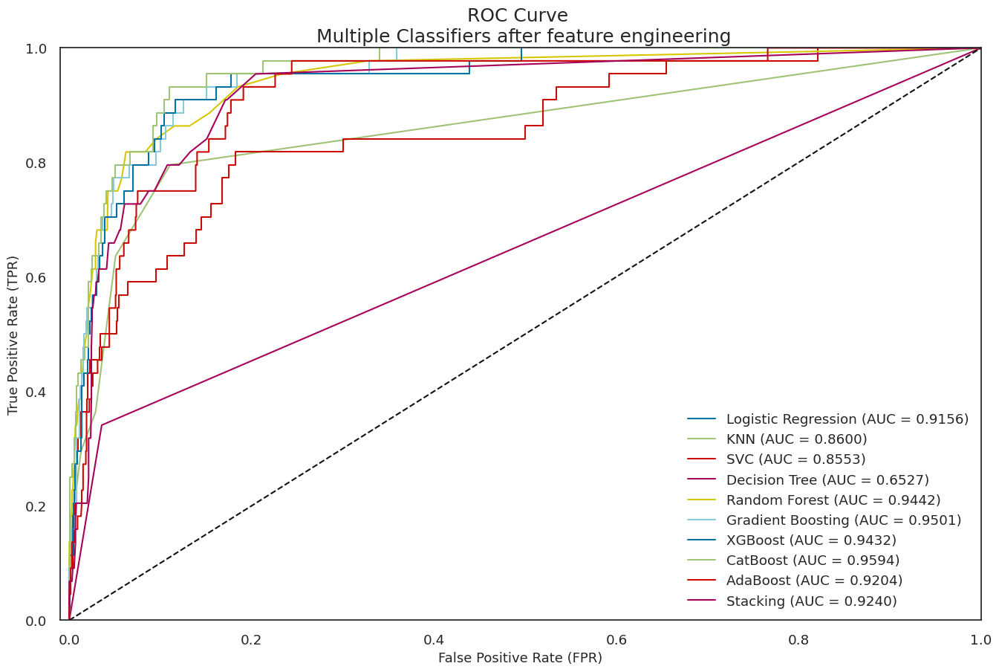

In [ ]:
def graph_roc_curve_multiple(roc_auc_lr, fpr_knn, tpr_knn, fpr_svc, tpr_svc,
                            fpr_dt, tpr_dt, fpr_rf, tpr_rf, fpr_gb, tpr_gb,
                            fpr_xgb, tpr_xgb, fpr_cb, tpr_cb, fpr_ada, tpr_ada,
                            fpr_st, tpr_st):
    plt.figure(figsize=(16,10))
    plt.title('ROC Curve \n Multiple Classifiers after feature engineering', fontsize=18)
    plt.plot(roc_auc_lr, label='Logistic Regression (AUC = {:.4f})'.format(roc_auc_score(y_test_fe, y_proba_lr_fe)))
    plt.plot(fpr_knn, tpr_knn, label='KNN (AUC = {:.4f})'.format(roc_auc_score(y_test_fe, y_proba_knn_fe)))
    plt.plot(fpr_svc, tpr_svc, label='SVC (AUC = {:.4f})'.format(roc_auc_score(y_test_fe, y_proba_svc_fe)))
    plt.plot(fpr_dt, tpr_dt, label='Decision Tree (AUC = {:.4f})'.format(roc_auc_score(y_test_fe, y_proba_dt_fe)))
    plt.plot(fpr_rf, tpr_rf, label='Random Forest (AUC = {:.4f})'.format(roc_auc_score(y_test_fe, y_proba_rf_fe)))
    plt.plot(fpr_gb, tpr_gb, label='Gradient Boosting (AUC = {:.4f})'.format(roc_auc_score(y_test_fe, y_proba_gb_fe)))
    plt.plot(fpr_xgb, tpr_xgb, label='XGBoost (AUC = {:.4f})'.format(roc_auc_score(y_test_fe, y_proba_xgb_fe)))
    plt.plot(fpr_cb, tpr_cb, label='CatBoost (AUC = {:.4f})'.format(roc_auc_score(y_test_fe, y_proba_cb_fe)))
    plt.plot(fpr_ada, tpr_ada, label='AdaBoost (AUC = {:.4f})'.format(roc_auc_score(y_test_fe, y_proba_ada_fe)))
    plt.plot(fpr_st, tpr_st, label='Stacking (AUC = {:.4f})'.format(roc_auc_score(y_test_fe, y_proba_st_fe)))
    plt.plot([0, 1], [0, 1], 'k--')
    plt.axis([-0.01, 1, 0, 1])
    plt.xlabel('False Positive Rate (FPR)', fontsize=13)
    plt.ylabel('True Positive Rate (TPR)', fontsize=13)
    plt.legend(loc='lower right')

# Call the function to draw ROC curves for each model
graph_roc_curve_multiple(roc_auc_lr, fpr_knn, tpr_knn, fpr_svc, tpr_svc,
                         fpr_dt, tpr_dt, fpr_rf, tpr_rf, fpr_gb, tpr_gb,
                         fpr_xgb, tpr_xgb, fpr_cb, tpr_cb, fpr_ada, tpr_ada,
                         fpr_st, tpr_st)
plt.show()

###Precision-Recall curves

In [ ]:
precision_lr, recall_lr, _ = precision_recall_curve(y_test_fe, y_proba_lr_fe)
precision_knn, recall_knn, _ = precision_recall_curve(y_test_fe, y_proba_knn_fe)
precision_svc, recall_svc, _ = precision_recall_curve(y_test_fe, y_proba_svc_fe)
precision_dt, recall_dt, _ = precision_recall_curve(y_test_fe, y_proba_dt_fe)
precision_rf, recall_rf, _ = precision_recall_curve(y_test_fe, y_proba_rf_fe)
precision_gb, recall_gb, _ = precision_recall_curve(y_test_fe, y_proba_gb_fe)
precision_xgb, recall_xgb, _ = precision_recall_curve(y_test_fe, y_proba_xgb_fe)
precision_cb, recall_cb, _ = precision_recall_curve(y_test_fe, y_proba_cb_fe)
precision_ada, recall_ada, _ = precision_recall_curve(y_test_fe, y_proba_ada_fe)
precision_st, recall_st, _ = precision_recall_curve(y_test_fe, y_proba_st_fe)

In [ ]:
auc_lr = auc(recall_lr, precision_lr)
auc_knn = auc(recall_knn, precision_knn)
auc_svc = auc(recall_svc, precision_svc)
auc_dt = auc(recall_dt, precision_dt)
auc_rf = auc(recall_rf, precision_rf)
auc_gb = auc(recall_gb, precision_gb)
auc_xgb = auc(recall_xgb, precision_xgb)
auc_cb = auc(recall_cb, precision_cb)
auc_ada = auc(recall_ada, precision_ada)
auc_st = auc(recall_st, precision_st)

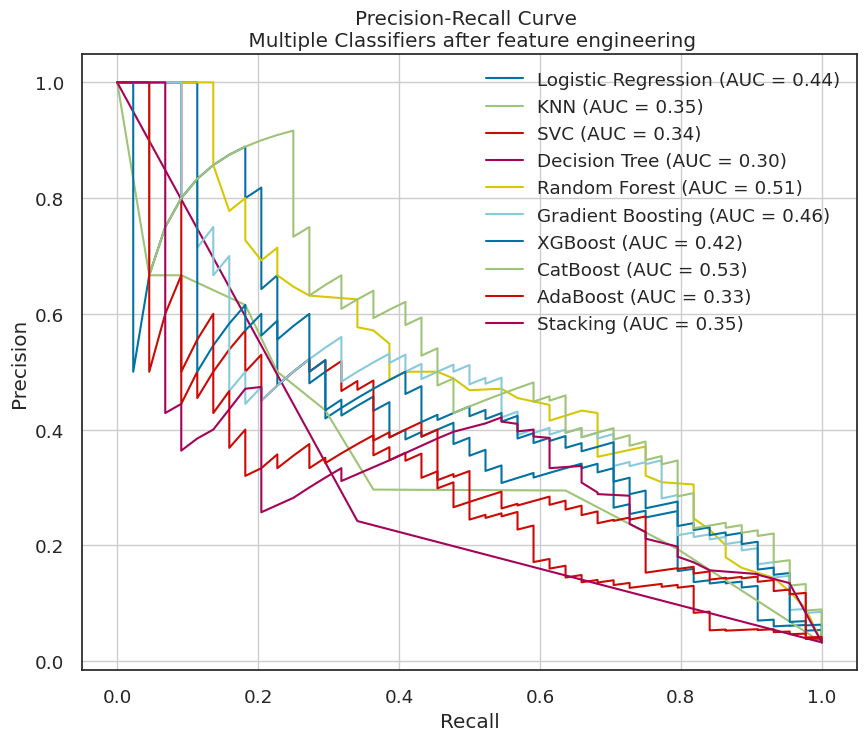

In [ ]:
plt.figure(figsize=(10, 8))

plt.plot(recall_lr, precision_lr, label=f'Logistic Regression (AUC = {auc_lr:.2f})')
plt.plot(recall_knn, precision_knn, label=f'KNN (AUC = {auc_knn:.2f})')
plt.plot(recall_svc, precision_svc, label=f'SVC (AUC = {auc_svc:.2f})')
plt.plot(recall_dt, precision_dt, label=f'Decision Tree (AUC = {auc_dt:.2f})')
plt.plot(recall_rf, precision_rf, label=f'Random Forest (AUC = {auc_rf:.2f})')
plt.plot(recall_gb, precision_gb, label=f'Gradient Boosting (AUC = {auc_gb:.2f})')
plt.plot(recall_xgb, precision_xgb, label=f'XGBoost (AUC = {auc_xgb:.2f})')
plt.plot(recall_cb, precision_cb, label=f'CatBoost (AUC = {auc_cb:.2f})')
plt.plot(recall_ada, precision_ada, label=f'AdaBoost (AUC = {auc_ada:.2f})')
plt.plot(recall_st, precision_st, label=f'Stacking (AUC = {auc_st:.2f})')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve \n Multiple Classifiers after feature engineering')
plt.legend(loc='best')
plt.grid(True)
plt.show()

###Confussion matrix

In [ ]:
conf_matrix_lr_fe = confusion_matrix(y_test_fe, y_pred_fe_logis)
conf_matrix_knn_fe = confusion_matrix(y_test_fe, y_pred_fe_knn)
conf_matrix_svc_fe = confusion_matrix(y_test_fe, y_pred_fe_svc)
conf_matrix_dt_fe = confusion_matrix(y_test_fe, y_pred_fe_Tree)
conf_matrix_rf_fe = confusion_matrix(y_test_fe, y_pred_fe_RF)
conf_matrix_gb_fe = confusion_matrix(y_test_fe, y_pred_fe_gb)
conf_matrix_xgb_fe = confusion_matrix(y_test_fe, y_pred_fe_xgb)
conf_matrix_cb_fe = confusion_matrix(y_test_fe, y_pred_fe_catboost)
conf_matrix_ada_fe = confusion_matrix(y_test_fe, y_pred_fe_ada)
conf_matrix_st_fe = confusion_matrix(y_test_fe, y_pred_fe_stacking)

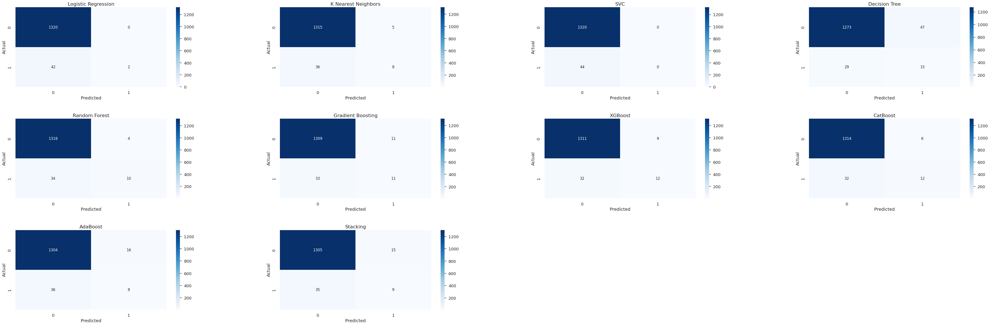

In [ ]:
conf_matrixes_fe = [conf_matrix_lr_fe, conf_matrix_knn_fe, conf_matrix_svc_fe, conf_matrix_dt_fe,
                    conf_matrix_rf_fe, conf_matrix_gb_fe, conf_matrix_xgb_fe, conf_matrix_cb_fe,
                    conf_matrix_ada_fe, conf_matrix_st_fe]

heat_cms_fe = [pd.DataFrame(cm, columns=np.unique(y_test_fe), index=np.unique(y_test_fe)) for cm in conf_matrixes_fe]

for heat_cm in heat_cms_fe:
    heat_cm.index.name = 'Actual'
    heat_cm.columns.name = 'Predicted'

fig, axes = plt.subplots(3, 4, figsize=(24, 18))
fig.subplots_adjust(left=None, bottom=None, right=2, top=None, wspace=0.4, hspace=0.4)

model_titles = ['Logistic Regression', 'K Nearest Neighbors', 'SVC', 'Decision Tree',
                'Random Forest', 'Gradient Boosting', 'XGBoost', 'CatBoost',
                'AdaBoost', 'Stacking']

for ax, heat_cm, title in zip(axes.flatten(), heat_cms_fe, model_titles):
    sns.heatmap(heat_cm, cmap="Blues", annot=True, annot_kws={"size": 12}, fmt='g', ax=ax)
    ax.set_title(title, fontsize=16)

for ax in axes.flatten()[len(model_titles):]:
    ax.axis('off')

plt.show()

##**Hyperparameter Optimization & Cross Validatio**n

###RFECV

In [ ]:
X_test_reduced_df = pd.DataFrame(X_test_reduced, columns=[
    'ROA(A) before interest and % after tax',
    'ROA(B) before interest and depreciation after tax',
    'Non-industry income and expenditure/revenue',
    'Continuous interest rate (after tax)',
    'Interest-bearing debt interest rate',
    'Net Value Per Share (B)',
    'Net Value Per Share (A)',
    'Net Value Per Share (C)',
    'Persistent EPS in the Last Four Seasons',
    'Operating Profit Per Share (Yuan ¥)',
    'Per Share Net profit before tax (Yuan ¥)',
    'Total Asset Growth Rate',
    'Net Value Growth Rate',
    'Total Asset Return Growth Rate Ratio',
    'Quick Ratio',
    'Interest Expense Ratio',
    'Total debt/Total net worth',
    'Debt ratio %',
    'Net worth/Assets',
    'Borrowing dependency',
    'Operating profit/Paid-in capital',
    'Net profit before tax/Paid-in capital',
    'Accounts Receivable Turnover',
    'Average Collection Days',
    'Revenue per person',
    'Operating profit per person',
    'Allocation rate per person',
    'Working Capital to Total Assets',
    'Quick Assets/Total Assets',
    'Current Assets/Total Assets',
    'Cash/Total Assets',
    'Quick Assets/Current Liability',
    'Cash/Current Liability',
    'Current Liability to Assets',
    'Inventory/Working Capital',
    'Current Liabilities/Liability',
    'Working Capital/Equity',
    'Total income/Total expense',
    'Working capital Turnover Rate',
    'Cash Flow to Sales',
    'Cash Flow to Liability',
    'CFO to Assets',
    'Net Income to Total Assets',
    'Total assets to GNP price',
    'No-credit Interval',
    'Net Income to Stockholders Equity',
    'Liability to Equity',
    'Degree of Financial Leverage (DFL)',
    'Interest Coverage Ratio (Interest expense to EBIT)',
    'Equity to Liability'
])

####Logistic Regression

In [ ]:
log_reg = LogisticRegression(max_iter=1000)

param_grid = {
    'C': np.logspace(-4, 4, 10),
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear', 'saga']
}

grid_search_lr = RandomizedSearchCV(estimator=log_reg, param_distributions=param_grid, cv=5, scoring='accuracy', verbose=2)
grid_search_lr.fit(X_train_reduced, y_train_reduced)

print("Best parameters:", grid_search_lr.best_params_)
print("Best cross-validation accuracy:", grid_search_lr.best_score_)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END ..................C=0.0001, penalty=l1, solver=saga; total time=   0.0s
[CV] END ..................C=0.0001, penalty=l1, solver=saga; total time=   0.0s
[CV] END ..................C=0.0001, penalty=l1, solver=saga; total time=   0.0s
[CV] END ..................C=0.0001, penalty=l1, solver=saga; total time=   0.0s
[CV] END ..................C=0.0001, penalty=l1, solver=saga; total time=   0.0s
[CV] END ..C=21.54434690031882, penalty=l2, solver=liblinear; total time=   0.1s
[CV] END ..C=21.54434690031882, penalty=l2, solver=liblinear; total time=   0.2s
[CV] END ..C=21.54434690031882, penalty=l2, solver=liblinear; total time=   0.2s
[CV] END ..C=21.54434690031882, penalty=l2, solver=liblinear; total time=   0.2s
[CV] END ..C=21.54434690031882, penalty=l2, solver=liblinear; total time=   0.2s
[CV] END C=0.046415888336127774, penalty=l1, solver=liblinear; total time=   0.0s
[CV] END C=0.046415888336127774, penalty=l1, so

In [ ]:
best_model_lr = grid_search_lr.best_estimator_
y_pred_lr = best_model_lr.predict(X_test_reduced)

print(confusion_matrix(y_test_reduced, y_pred_lr))
print(classification_report(y_test_reduced, y_pred_lr))

[[875 445]
 [ 11  33]]
              precision    recall  f1-score   support

           0       0.99      0.66      0.79      1320
           1       0.07      0.75      0.13        44

    accuracy                           0.67      1364
   macro avg       0.53      0.71      0.46      1364
weighted avg       0.96      0.67      0.77      1364



In [ ]:
test_score_lr = best_model_lr.score(X_test_reduced, y_test_reduced)
print("Test set score: {:.2f}".format(test_score_lr))

Test set score: 0.67


In [ ]:
scores_reduced = cross_validate(best_model_lr, X_train_reduced, y_train_reduced, scoring=['precision_macro', 'recall_macro'], cv=5)

print('Mean Precision: %.4f' % np.mean(scores_reduced['test_precision_macro']))
print('Mean Recall: %.4f' % np.mean(scores_reduced['test_recall_macro']))

Mean Precision: 0.7378
Mean Recall: 0.6189


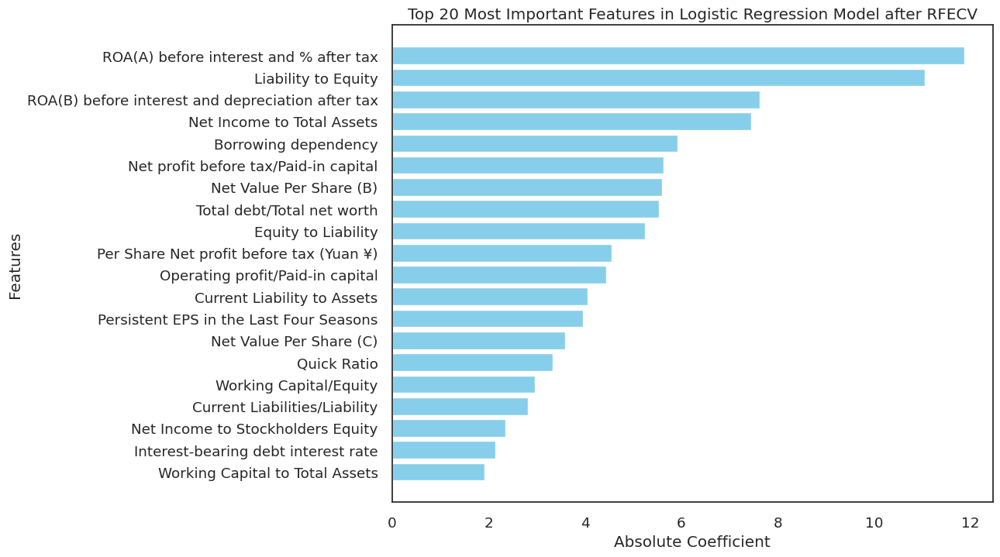

In [ ]:
coefficients = best_model_lr.coef_[0]
feature_names = X_test_reduced_df.columns
features_dict = dict(zip(feature_names, np.abs(coefficients)))
sorted_features = sorted(features_dict.items(), key=lambda x: x[1], reverse=True)

top_features = sorted_features[:20]
top_feature_names = [i[0] for i in top_features]
top_feature_importances = [i[1] for i in top_features]

plt.figure(figsize=(10, 8))
plt.barh(top_feature_names, top_feature_importances, color='skyblue')
plt.xlabel('Absolute Coefficient')
plt.ylabel('Features')
plt.title('Top 20 Most Important Features in Logistic Regression Model after RFECV')
plt.gca().invert_yaxis()
plt.show()

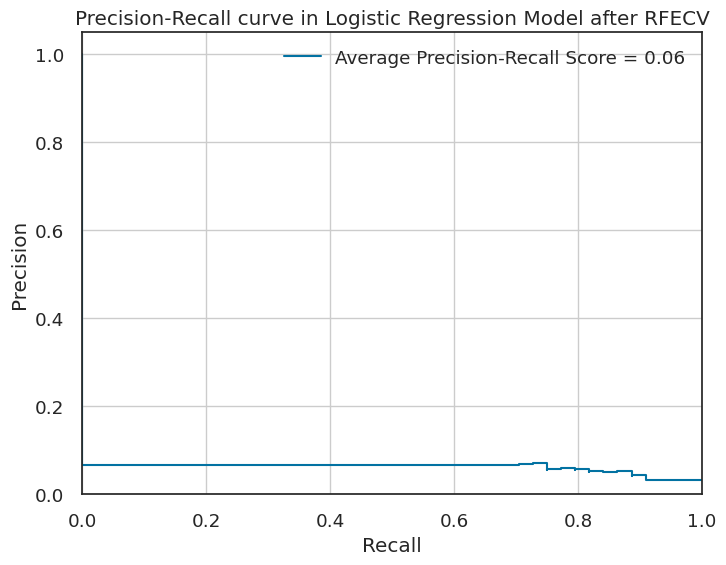

In [ ]:
y_scores_reduced_lr = best_model_lr.predict_proba(X_test_reduced)[:, 1]
precision, recall, thresholds = precision_recall_curve(y_test_reduced, y_scores_reduced_lr)
average_precision_reduced = average_precision_score(y_test_reduced, y_scores_reduced_lr)

plt.figure(figsize=(8, 6))
plt.step(recall, precision, where='post', label=f'Average Precision-Recall Score = {average_precision_reduced:0.2f}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('Precision-Recall curve in Logistic Regression Model after RFECV'.format(average_precision_reduced))
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

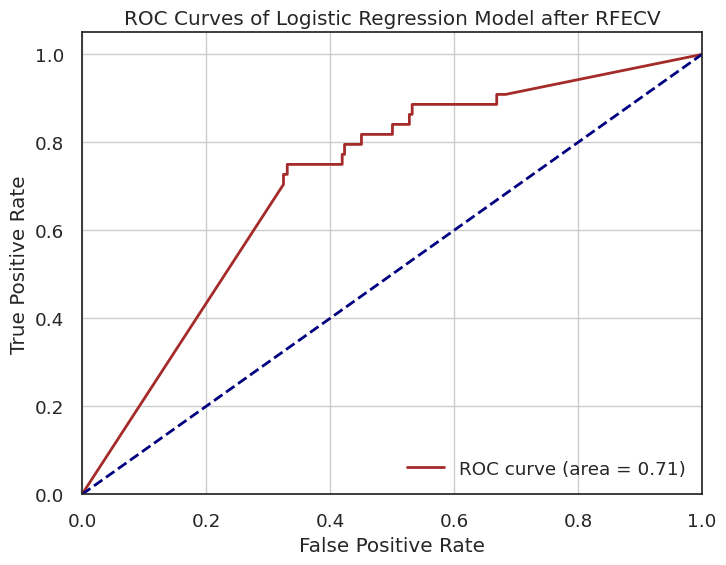

In [ ]:
y_scores_reduced_lr = best_model_lr.predict_proba(X_test_reduced)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test_reduced, y_scores_reduced_lr)
roc_auc_reduced = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='brown', lw=2, label=f'ROC curve (area = {roc_auc_reduced:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves of Logistic Regression Model after RFECV')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

####Gradient Boosting

In [ ]:
param_grid = {
    'learning_rate': [0.01, 0.1, 0.2, 0.5],
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, 7]
}

grid_search_gb = RandomizedSearchCV(GradientBoostingClassifier(), param_grid, cv=5, verbose=2, scoring='accuracy')

grid_search_gb.fit(X_train_reduced, y_train_reduced)

print("Best parameters:", grid_search_gb.best_params_)
print("Best cross-validation score: {:.2f}".format(grid_search_gb.best_score_))

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END ..learning_rate=0.01, max_depth=5, n_estimators=300; total time=  39.4s
[CV] END ..learning_rate=0.01, max_depth=5, n_estimators=300; total time=  39.3s
[CV] END ..learning_rate=0.01, max_depth=5, n_estimators=300; total time=  39.4s
[CV] END ..learning_rate=0.01, max_depth=5, n_estimators=300; total time=  39.4s
[CV] END ..learning_rate=0.01, max_depth=5, n_estimators=300; total time=  39.4s
[CV] END ...learning_rate=0.2, max_depth=5, n_estimators=300; total time=  39.9s
[CV] END ...learning_rate=0.2, max_depth=5, n_estimators=300; total time=  39.9s
[CV] END ...learning_rate=0.2, max_depth=5, n_estimators=300; total time=  39.5s
[CV] END ...learning_rate=0.2, max_depth=5, n_estimators=300; total time=  39.5s
[CV] END ...learning_rate=0.2, max_depth=5, n_estimators=300; total time=  39.4s
[CV] END ..learning_rate=0.01, max_depth=5, n_estimators=100; total time=  13.1s
[CV] END ..learning_rate=0.01, max_depth=5, n_es

In [ ]:
best_model_gb = grid_search_gb.best_estimator_
y_pred_gb = best_model_gb.predict(X_test_reduced)

print(confusion_matrix(y_test_reduced, y_pred_gb))
print(classification_report(y_test_reduced, y_pred_gb))

[[ 167 1153]
 [   1   43]]
              precision    recall  f1-score   support

           0       0.99      0.13      0.22      1320
           1       0.04      0.98      0.07        44

    accuracy                           0.15      1364
   macro avg       0.52      0.55      0.15      1364
weighted avg       0.96      0.15      0.22      1364



In [ ]:
test_score_gb = best_model_gb.score(X_test_reduced, y_test_reduced)
print("Test set score: {:.2f}".format(test_score_gb))

Test set score: 0.15


In [ ]:
from sklearn.model_selection import cross_validate
scores_reduced = cross_validate(best_model_gb, X_train_reduced, y_train_reduced, scoring=['precision_macro', 'recall_macro'], cv=5)

print('Mean Precision: %.4f' % np.mean(scores_reduced['test_precision_macro']))
print('Mean Recall: %.4f' % np.mean(scores_reduced['test_recall_macro']))

Mean Precision: 0.7894
Mean Recall: 0.6338


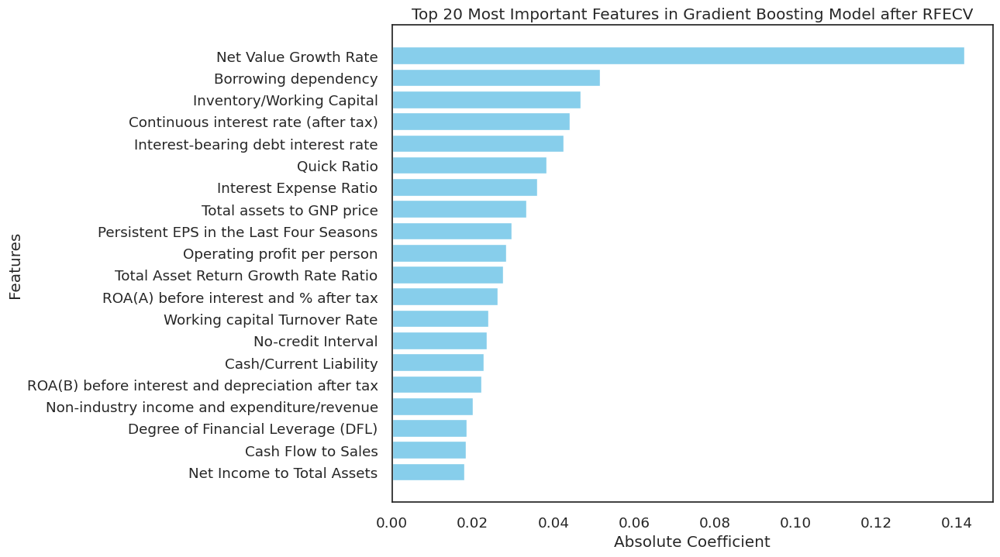

In [ ]:
coefficients = best_model_gb.feature_importances_
feature_names = X_test_reduced_df.columns
features_dict = dict(zip(feature_names, np.abs(coefficients)))
sorted_features = sorted(features_dict.items(), key=lambda x: x[1], reverse=True)

top_features = sorted_features[:20]
top_feature_names = [i[0] for i in top_features]
top_feature_importances = [i[1] for i in top_features]

plt.figure(figsize=(10, 8))
plt.barh(top_feature_names, top_feature_importances, color='skyblue')
plt.xlabel('Absolute Coefficient')
plt.ylabel('Features')
plt.title('Top 20 Most Important Features in Gradient Boosting Model after RFECV')
plt.gca().invert_yaxis()
plt.show()

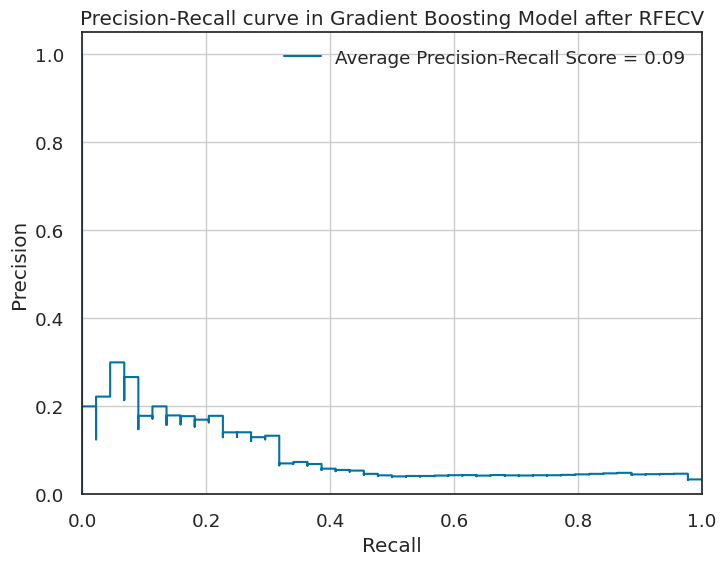

In [ ]:
y_scores_reduced_gb = best_model_gb.predict_proba(X_test_reduced)[:, 1]
precision, recall, thresholds = precision_recall_curve(y_test_reduced, y_scores_reduced_gb)
average_precision_reduced = average_precision_score(y_test_reduced, y_scores_reduced_gb)

plt.figure(figsize=(8, 6))
plt.step(recall, precision, where='post', label=f'Average Precision-Recall Score = {average_precision_reduced:0.2f}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('Precision-Recall curve in Gradient Boosting Model after RFECV'.format(average_precision_reduced))
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

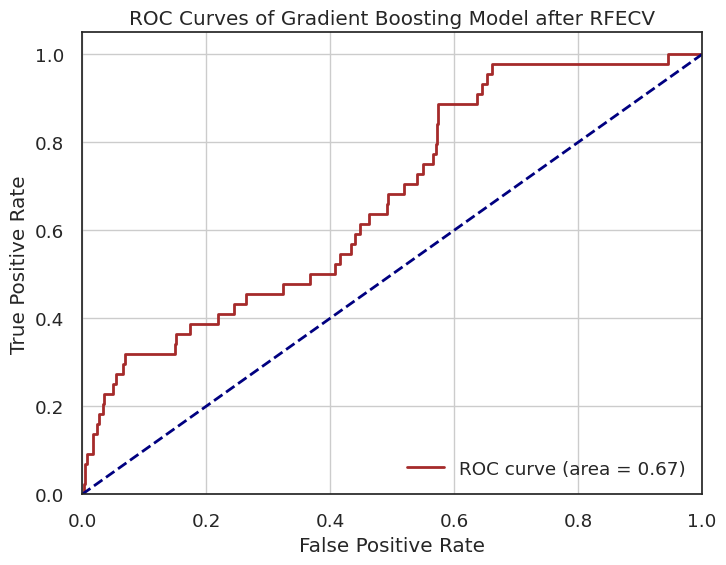

In [ ]:
y_scores_reduced_gb = best_model_gb.predict_proba(X_test_reduced)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test_reduced, y_scores_reduced_gb)
roc_auc_reduced = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='brown', lw=2, label=f'ROC curve (area = {roc_auc_reduced:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves of Gradient Boosting Model after RFECV')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

####Adaboost

In [ ]:
ada_model = AdaBoostClassifier()

param_grid = {
    'n_estimators': [50, 100, 150, 200, 250],
    'learning_rate': [0.01, 0.05, 0.1, 0.15, 0.2],
    'algorithm': ['SAMME', 'SAMME.R']
}

random_search_ada = RandomizedSearchCV(estimator=ada_model, param_distributions=param_grid, n_iter=10, cv=5, scoring='accuracy', n_jobs=-1, random_state=42)
random_search_ada.fit(X_train_reduced, y_train_reduced)

print("Best parameters:", random_search_ada.best_params_)
print("Best cross-validation score: {:.2f}".format(random_search_ada.best_score_))

Best parameters: {'n_estimators': 250, 'learning_rate': 0.15, 'algorithm': 'SAMME'}
Best cross-validation score: 0.97


In [ ]:
best_model_ada = random_search_ada.best_estimator_
y_pred_ada = best_model_ada.predict(X_test_reduced)

print(confusion_matrix(y_test_reduced, y_pred_ada))
print(classification_report(y_test_reduced, y_pred_ada))

[[1320    0]
 [  42    2]]
              precision    recall  f1-score   support

           0       0.97      1.00      0.98      1320
           1       1.00      0.05      0.09        44

    accuracy                           0.97      1364
   macro avg       0.98      0.52      0.54      1364
weighted avg       0.97      0.97      0.96      1364



In [ ]:
test_score_ada = best_model_ada.score(X_test_reduced, y_test_reduced)
print("Test set score: {:.2f}".format(test_score_ada))

Test set score: 0.97


In [ ]:
scores_reduced = cross_validate(best_model_ada, X_train_reduced, y_train_reduced, scoring=['precision_macro', 'recall_macro'], cv=5)

print('Mean Precision: %.4f' % np.mean(scores_reduced['test_precision_macro']))
print('Mean Recall: %.4f' % np.mean(scores_reduced['test_recall_macro']))

Mean Precision: 0.8149
Mean Recall: 0.5785


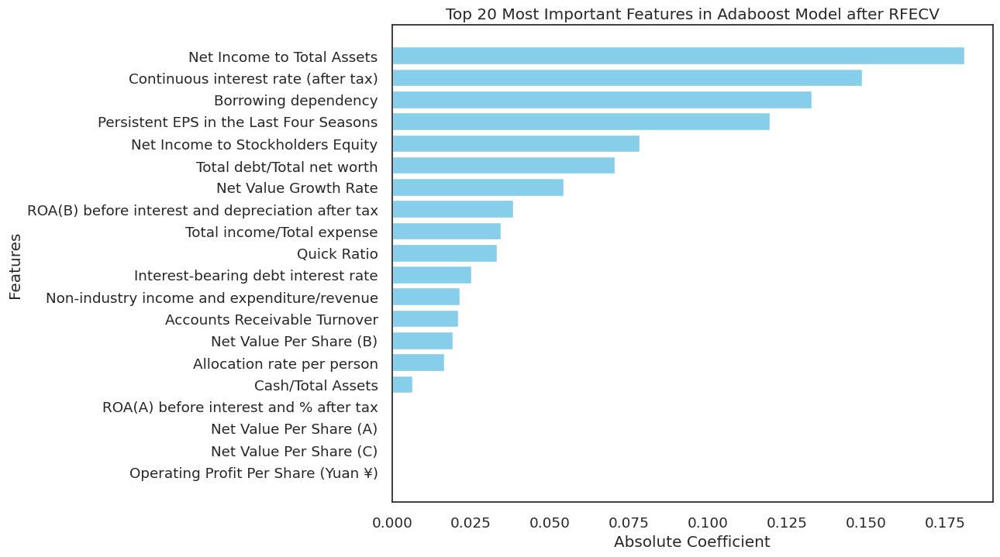

In [ ]:
coefficients = best_model_ada.feature_importances_
feature_names = X_test_reduced_df.columns
features_dict = dict(zip(feature_names, np.abs(coefficients)))
sorted_features = sorted(features_dict.items(), key=lambda x: x[1], reverse=True)

top_features = sorted_features[:20]
top_feature_names = [i[0] for i in top_features]
top_feature_importances = [i[1] for i in top_features]

plt.figure(figsize=(10, 8))
plt.barh(top_feature_names, top_feature_importances, color='skyblue')
plt.xlabel('Absolute Coefficient')
plt.ylabel('Features')
plt.title('Top 20 Most Important Features in Adaboost Model after RFECV')
plt.gca().invert_yaxis()
plt.show()

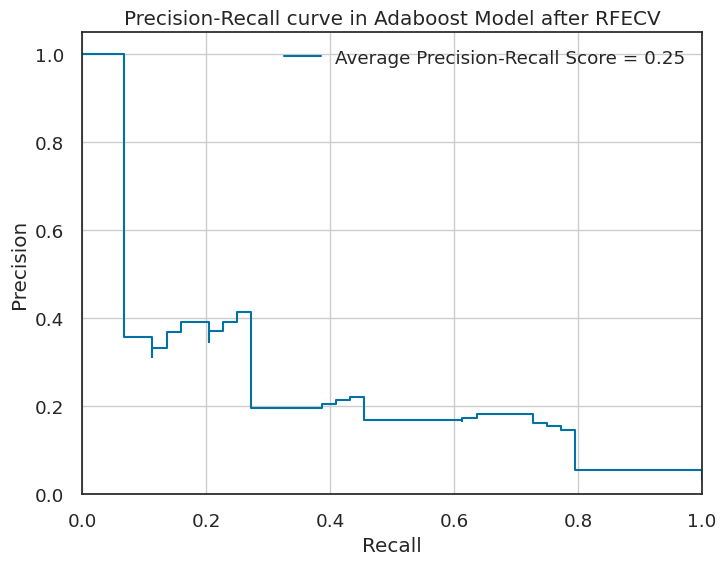

In [ ]:
y_scores_reduced_ada = best_model_ada.predict_proba(X_test_reduced)[:, 1]
precision, recall, thresholds = precision_recall_curve(y_test_reduced, y_scores_reduced_ada)
average_precision_reduced = average_precision_score(y_test_reduced, y_scores_reduced_ada)

plt.figure(figsize=(8, 6))
plt.step(recall, precision, where='post', label=f'Average Precision-Recall Score = {average_precision_reduced:0.2f}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('Precision-Recall curve in Adaboost Model after RFECV'.format(average_precision_reduced))
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

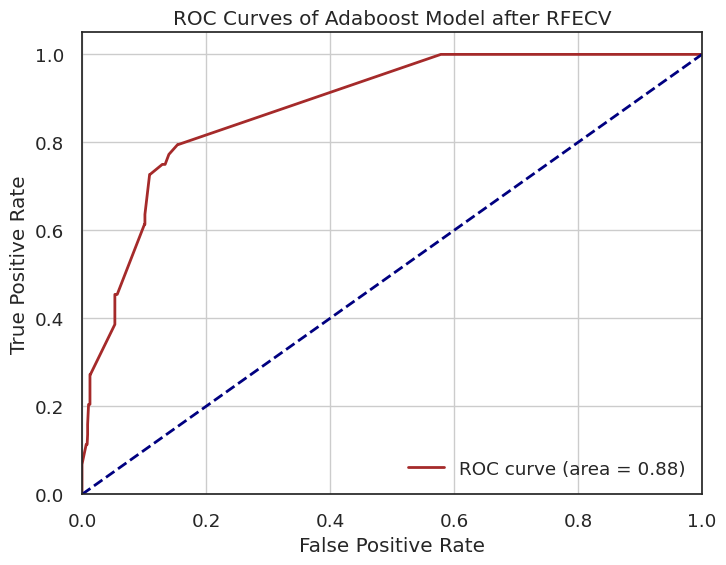

In [ ]:
y_scores_reduced_ada = best_model_ada.predict_proba(X_test_reduced)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test_reduced, y_scores_reduced_ada)
roc_auc_reduced = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='brown', lw=2, label=f'ROC curve (area = {roc_auc_reduced:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves of Adaboost Model after RFECV')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

###Feature Engineering

In [ ]:
X_test_fe_df = pd.DataFrame(X_test_fe, columns=[
    'Continuousinterestrate(aftertax)', 'Interest-bearingdebtinterestrate',
    'NetValuePerShare(B)', 'NetValuePerShare(A)', 'NetValuePerShare(C)',
    'PersistentEPSintheLastFourSeasons', 'OperatingProfitPerShare(Yuan¥)',
    'TotalAssetGrowthRate', 'TotalAssetReturnGrowthRateRatio',
    'InterestExpenseRatio', 'Totaldebt/Totalnetworth', 'Debtratio%',
    'Networth/Assets', 'Borrowingdependency',
    'Operatingprofit/Paid-incapital', 'AccountsReceivableTurnover',
    'AverageCollectionDays', 'Revenueperperson',
    'WorkingCapitaltoTotalAssets', 'QuickAssets/CurrentLiability',
    'Cash/CurrentLiability', 'CurrentLiabilitytoAssets',
    'CurrentLiabilities/Liability', 'Totalincome/Totalexpense',
    'NetIncometoStockholdersEquity', 'LiabilitytoEquity',
    'InterestCoverageRatio(InterestexpensetoEBIT)', 'Bankrupt?', 'ROE',
    'InterestCoverage', 'ROAToInterestCoverage'
])

####Decision Tree

In [ ]:
dt_classifier = DecisionTreeClassifier()

param_distributions = {
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': np.arange(2, 21),
    'min_samples_leaf': np.arange(1, 21),
    'criterion': ['gini', 'entropy'],
    'max_features': ['auto', 'sqrt', 'log2', None]
}

random_search_dt = RandomizedSearchCV(
    estimator=dt_classifier,
    param_distributions=param_distributions,
    n_iter=100,
    cv=5,
    scoring='accuracy',
    random_state=42,
    verbose=2,
    n_jobs=-1
)

random_search_dt.fit(X_train_fe, y_train_fe)

print("Best parameters:", random_search_dt.best_params_)
print("Best cross-validation accuracy:", random_search_dt.best_score_)

Fitting 5 folds for each of 100 candidates, totalling 500 fits
Best parameters: {'min_samples_split': 4, 'min_samples_leaf': 20, 'max_features': 'sqrt', 'max_depth': 30, 'criterion': 'entropy'}
Best cross-validation accuracy: 0.9675527039413382


In [ ]:
best_dt = random_search_dt.best_estimator_
y_pred_fe_Tree = best_dt.predict(X_test_fe)

print(confusion_matrix(y_test_fe, y_pred_fe_Tree))
print(classification_report(y_test_fe, y_pred_fe_Tree))

[[1301   19]
 [  26   18]]
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      1320
           1       0.49      0.41      0.44        44

    accuracy                           0.97      1364
   macro avg       0.73      0.70      0.71      1364
weighted avg       0.96      0.97      0.97      1364



In [ ]:
test_score_dt = best_dt.score(X_test_fe, y_test_fe)
print("Test set score: {:.2f}".format(test_score_dt))

Test set score: 0.97


In [ ]:
scores_fe = cross_validate(best_dt, X_train_fe, y_train_fe, scoring=['precision_macro', 'recall_macro'], cv=5)

print('Mean Precision: %.4f' % np.mean(scores_fe['test_precision_macro']))
print('Mean Recall: %.4f' % np.mean(scores_fe['test_recall_macro']))

Mean Precision: 0.7204
Mean Recall: 0.5766


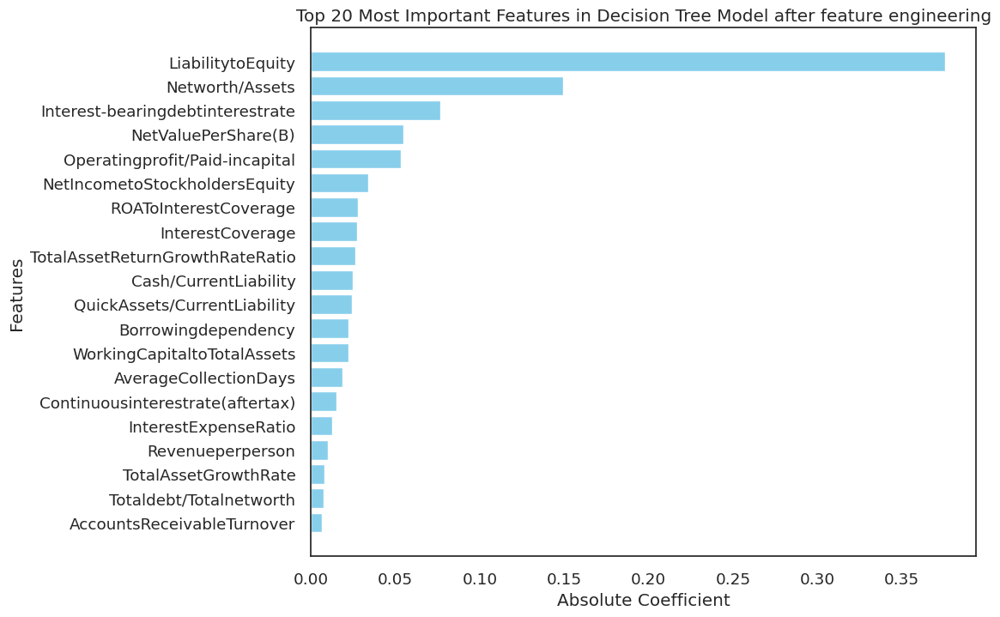

In [ ]:
coefficients = best_dt.feature_importances_
feature_names = X_test_fe_df.columns
features_dict = dict(zip(feature_names, np.abs(coefficients)))
sorted_features = sorted(features_dict.items(), key=lambda x: x[1], reverse=True)

top_features = sorted_features[:20]
top_feature_names = [i[0] for i in top_features]
top_feature_importances = [i[1] for i in top_features]

plt.figure(figsize=(10, 8))
plt.barh(top_feature_names, top_feature_importances, color='skyblue')
plt.xlabel('Absolute Coefficient')
plt.ylabel('Features')
plt.title('Top 20 Most Important Features in Decision Tree Model after feature engineering')
plt.gca().invert_yaxis()
plt.show()

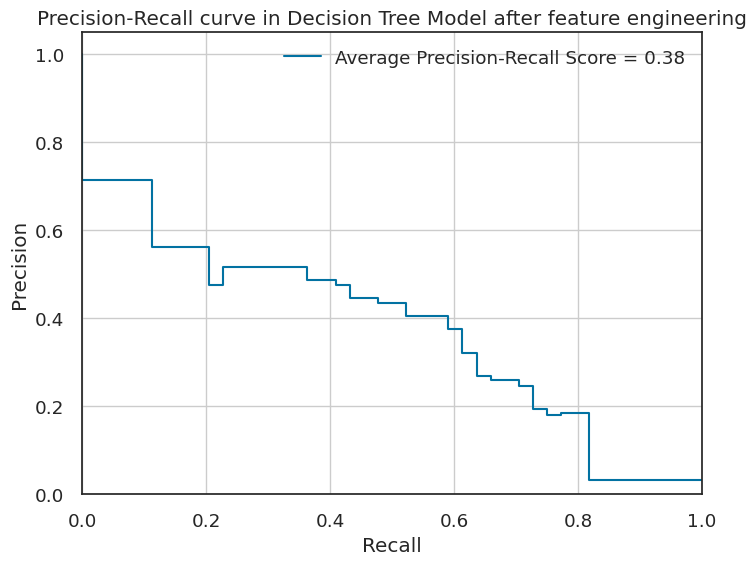

In [ ]:
y_scores_reduced_dt = best_dt.predict_proba(X_test_fe)[:, 1]
precision, recall, thresholds = precision_recall_curve(y_test_reduced, y_scores_reduced_dt)
average_precision_fe = average_precision_score(y_test_reduced, y_scores_reduced_dt)

plt.figure(figsize=(8, 6))
plt.step(recall, precision, where='post', label=f'Average Precision-Recall Score = {average_precision_fe:0.2f}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('Precision-Recall curve in Decision Tree Model after feature engineering'.format(average_precision_fe))
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

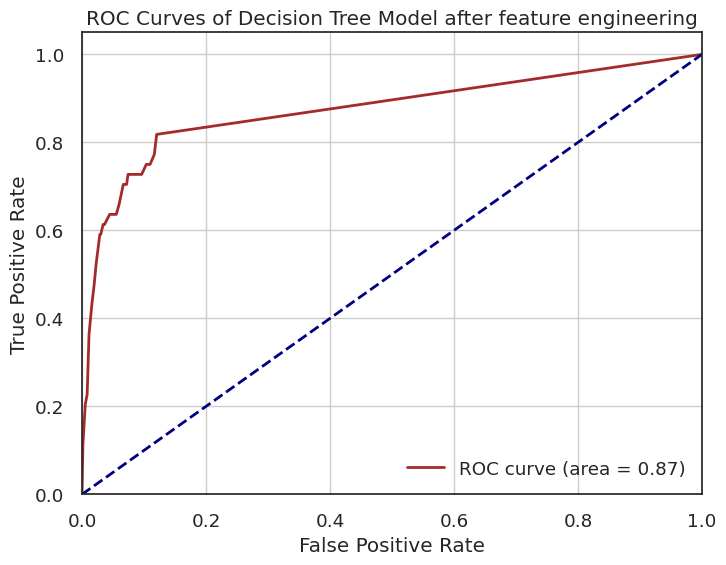

In [ ]:
y_scores_fe_dt = best_dt.predict_proba(X_test_fe)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test_fe, y_scores_fe_dt)
roc_auc_fe = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='brown', lw=2, label=f'ROC curve (area = {roc_auc_fe:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves of Decision Tree Model after feature engineering')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

####Gradient Boosting

In [ ]:
gb = GradientBoostingClassifier()
param_dist = {
    'n_estimators': np.arange(50, 151, 50),
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': np.arange(3, 8),
    'min_samples_split': np.arange(2, 11, 2),
    'min_samples_leaf': np.arange(1, 11, 2),
    'max_features': ['sqrt', 'log2', None]
}

random_search_gb = RandomizedSearchCV(gb, param_distributions=param_dist, n_iter=100, cv=5, verbose=1, random_state=42, n_jobs=-1)
random_search_gb.fit(X_train_fe, y_train_fe)

print("Best parameters:", random_search_gb.best_params_)
print("Best cross-validation accuracy:", random_search_gb.best_score_)

Fitting 5 folds for each of 100 candidates, totalling 500 fits
Best parameters: {'n_estimators': 50, 'min_samples_split': 4, 'min_samples_leaf': 5, 'max_features': 'log2', 'max_depth': 4, 'learning_rate': 0.1}
Best cross-validation accuracy: 0.972135655362053


In [ ]:
best_gb = random_search_gb.best_estimator_
y_pred_fe_gb = best_gb.predict(X_test_fe)

print(confusion_matrix(y_test_fe, y_pred_fe_gb))
print(classification_report(y_test_fe, y_pred_fe_gb))

[[1309   11]
 [  30   14]]
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      1320
           1       0.56      0.32      0.41        44

    accuracy                           0.97      1364
   macro avg       0.77      0.65      0.70      1364
weighted avg       0.96      0.97      0.97      1364



In [ ]:
test_score_gb = best_gb.score(X_test_fe, y_test_fe)
print("Test set score: {:.2f}".format(test_score_gb))

Test set score: 0.97


In [ ]:
scores_fe = cross_validate(best_gb, X_train_fe, y_train_fe, scoring=['precision_macro', 'recall_macro'], cv=5)

print('Mean Precision: %.4f' % np.mean(scores_fe['test_precision_macro']))
print('Mean Recall: %.4f' % np.mean(scores_fe['test_recall_macro']))

Mean Precision: 0.7840
Mean Recall: 0.6228


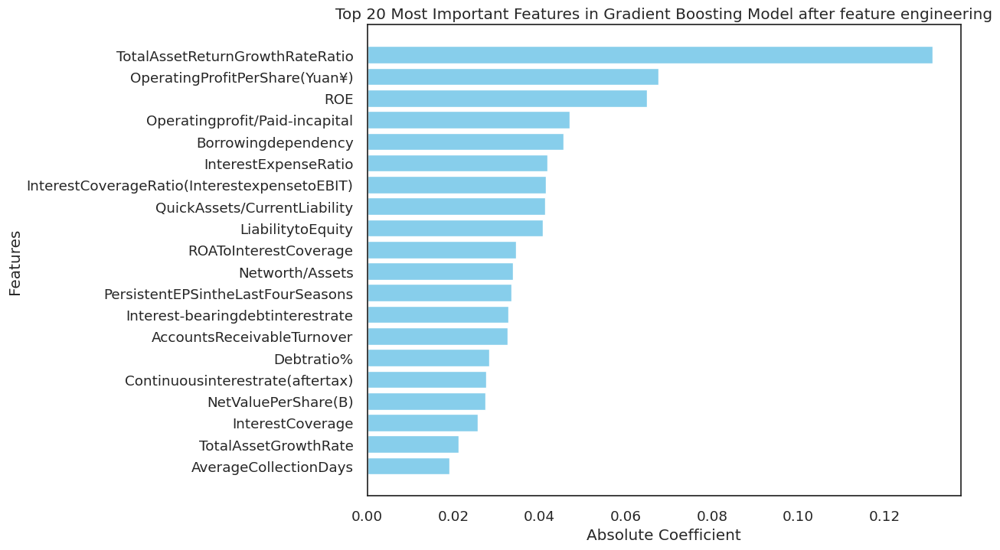

In [ ]:
coefficients = best_gb.feature_importances_
feature_names = X_test_fe_df.columns
features_dict = dict(zip(feature_names, np.abs(coefficients)))
sorted_features = sorted(features_dict.items(), key=lambda x: x[1], reverse=True)

top_features = sorted_features[:20]
top_feature_names = [i[0] for i in top_features]
top_feature_importances = [i[1] for i in top_features]

plt.figure(figsize=(10, 8))
plt.barh(top_feature_names, top_feature_importances, color='skyblue')
plt.xlabel('Absolute Coefficient')
plt.ylabel('Features')
plt.title('Top 20 Most Important Features in Gradient Boosting Model after feature engineering')
plt.gca().invert_yaxis()
plt.show()

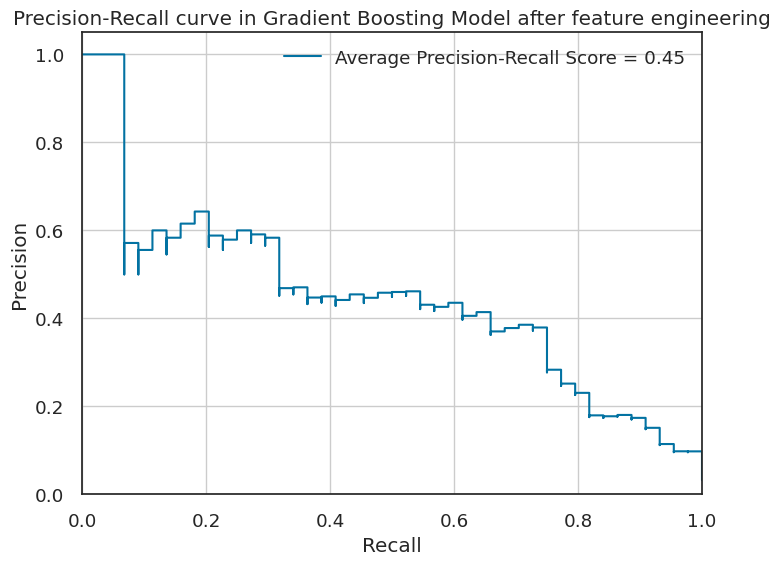

In [ ]:
y_scores_fe_gb = best_gb.predict_proba(X_test_fe)[:, 1]
precision, recall, thresholds = precision_recall_curve(y_test_fe, y_scores_fe_gb)
average_precision_fe = average_precision_score(y_test_fe, y_scores_fe_gb)

plt.figure(figsize=(8, 6))
plt.step(recall, precision, where='post', label=f'Average Precision-Recall Score = {average_precision_fe:0.2f}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('Precision-Recall curve in Gradient Boosting Model after feature engineering'.format(average_precision_fe))
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

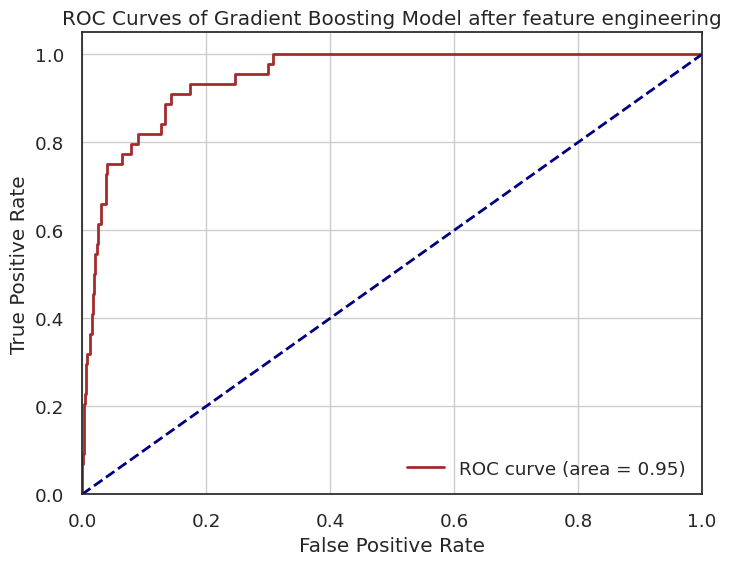

In [ ]:
y_scores_fe_gb = best_gb.predict_proba(X_test_fe)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test_fe, y_scores_fe_gb)
roc_auc_fe = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='brown', lw=2, label=f'ROC curve (area = {roc_auc_fe:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves of Gradient Boosting Model after feature engineering')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

####XGBoost

In [ ]:
xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss')
param_distributions = {
    'n_estimators': np.arange(50, 301, 50),
    'max_depth': np.arange(3, 11),
    'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.3],
    'subsample': [0.6, 0.7, 0.8, 0.9, 1.0],
    'colsample_bytree': [0.6, 0.7, 0.8, 0.9, 1.0],
    'min_child_weight': [1, 3, 5, 7]
}

random_search_xgb = RandomizedSearchCV(
    estimator=xgb,
    param_distributions=param_distributions,
    n_iter=100,
    scoring='accuracy',
    cv=5,
    verbose=2,
    random_state=42,
    n_jobs=-1
)

random_search_xgb.fit(X_train_fe, y_train_fe)

print("Best parameters:", random_search_xgb.best_params_)
print("Best cross-validation accuracy:", random_search_xgb.best_score_)

Fitting 5 folds for each of 100 candidates, totalling 500 fits
Best parameters: {'subsample': 0.9, 'n_estimators': 100, 'min_child_weight': 1, 'max_depth': 7, 'learning_rate': 0.1, 'colsample_bytree': 0.7}
Best cross-validation accuracy: 0.9714023831347387


In [ ]:
best_xgb = random_search_xgb.best_estimator_
y_pred_fe_xgb = best_xgb.predict(X_test_fe)

print(confusion_matrix(y_test_fe, y_pred_fe_xgb))
print(classification_report(y_test_fe, y_pred_fe_xgb))

[[1315    5]
 [  36    8]]
              precision    recall  f1-score   support

           0       0.97      1.00      0.98      1320
           1       0.62      0.18      0.28        44

    accuracy                           0.97      1364
   macro avg       0.79      0.59      0.63      1364
weighted avg       0.96      0.97      0.96      1364



In [ ]:
test_score_xgb = best_xgb.score(X_test_fe, y_test_fe)
print("Test set score: {:.2f}".format(test_score_xgb))

Test set score: 0.97


In [ ]:
scores_fe = cross_validate(best_xgb, X_train_fe, y_train_fe, scoring=['precision_macro', 'recall_macro'], cv=5)

print('Mean Precision: %.4f' % np.mean(scores_fe['test_precision_macro']))
print('Mean Recall: %.4f' % np.mean(scores_fe['test_recall_macro']))

Mean Precision: 0.8364
Mean Recall: 0.6092


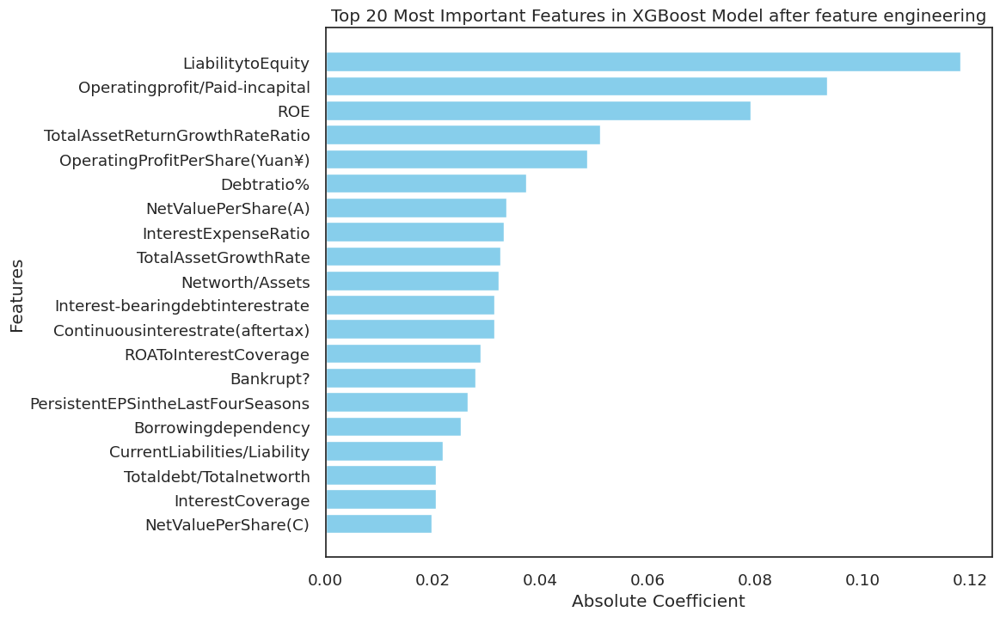

In [ ]:
coefficients = best_xgb.feature_importances_
feature_names = X_test_fe_df.columns
features_dict = dict(zip(feature_names, np.abs(coefficients)))
sorted_features = sorted(features_dict.items(), key=lambda x: x[1], reverse=True)

top_features = sorted_features[:20]
top_feature_names = [i[0] for i in top_features]
top_feature_importances = [i[1] for i in top_features]

plt.figure(figsize=(10, 8))
plt.barh(top_feature_names, top_feature_importances, color='skyblue')
plt.xlabel('Absolute Coefficient')
plt.ylabel('Features')
plt.title('Top 20 Most Important Features in XGBoost Model after feature engineering')
plt.gca().invert_yaxis()
plt.show()

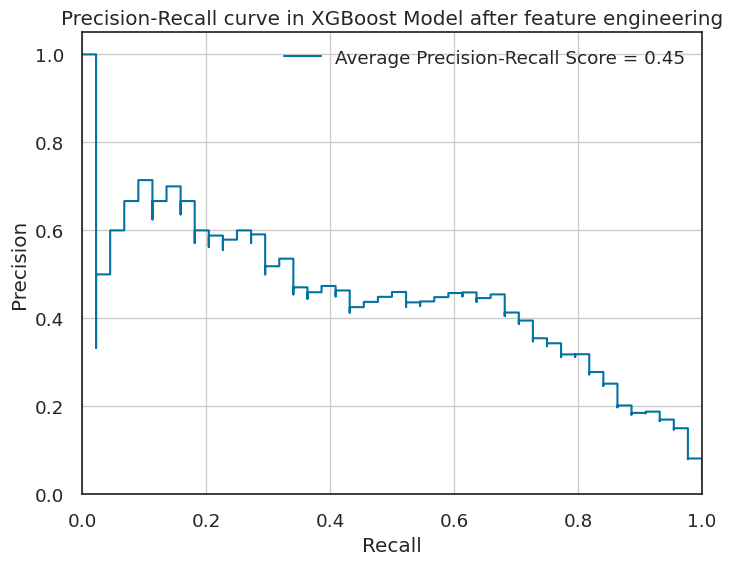

In [ ]:
y_scores_fe_xgb = best_xgb.predict_proba(X_test_fe)[:, 1]
precision, recall, thresholds = precision_recall_curve(y_test_fe, y_scores_fe_xgb)
average_precision_fe = average_precision_score(y_test_fe, y_scores_fe_xgb)

plt.figure(figsize=(8, 6))
plt.step(recall, precision, where='post', label=f'Average Precision-Recall Score = {average_precision_fe:0.2f}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('Precision-Recall curve in XGBoost Model after feature engineering'.format(average_precision_fe))
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

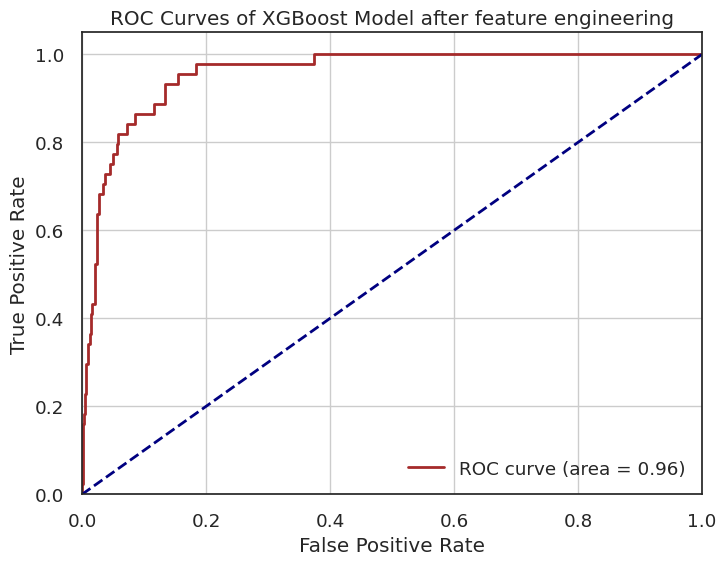

In [ ]:
y_scores_fe_xgb = best_xgb.predict_proba(X_test_fe)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test_fe, y_scores_fe_xgb)
roc_auc_fe = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='brown', lw=2, label=f'ROC curve (area = {roc_auc_fe:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves of XGBoost Model after feature engineering')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

####Catboost

In [ ]:
catboost_model = CatBoostClassifier()

param_dist = {
    'iterations': [100, 500, 1000],
    'learning_rate': [0.01, 0.05, 0.1],
    'depth': [3, 6, 10],
    'l2_leaf_reg': [1, 3, 5, 7],
    'border_count': [32, 64, 128],
    'loss_function': ['Logloss', 'CrossEntropy']
}

random_search_cb = RandomizedSearchCV(catboost_model, param_distributions=param_dist, n_iter=10, cv=3, scoring='accuracy', verbose=2, random_state=42)
random_search_cb.fit(X_train_fe, y_train_fe)

print("Best parameters:", random_search_cb.best_params_)
print("Best cross-validation accuracy:", random_search_cb.best_score_)

Kết quả truyền trực tuyến bị cắt bớt đến 5000 dòng cuối.
410:	learn: 0.0019437	total: 2.58s	remaining: 3.69s
411:	learn: 0.0019388	total: 2.58s	remaining: 3.69s
412:	learn: 0.0019352	total: 2.59s	remaining: 3.68s
413:	learn: 0.0019217	total: 2.59s	remaining: 3.67s
414:	learn: 0.0019141	total: 2.6s	remaining: 3.66s
415:	learn: 0.0019069	total: 2.6s	remaining: 3.65s
416:	learn: 0.0018976	total: 2.6s	remaining: 3.64s
417:	learn: 0.0018871	total: 2.61s	remaining: 3.63s
418:	learn: 0.0018798	total: 2.61s	remaining: 3.62s
419:	learn: 0.0018712	total: 2.61s	remaining: 3.61s
420:	learn: 0.0018684	total: 2.62s	remaining: 3.6s
421:	learn: 0.0018627	total: 2.62s	remaining: 3.59s
422:	learn: 0.0018588	total: 2.62s	remaining: 3.58s
423:	learn: 0.0018543	total: 2.62s	remaining: 3.56s
424:	learn: 0.0018499	total: 2.63s	remaining: 3.55s
425:	learn: 0.0018451	total: 2.63s	remaining: 3.54s
426:	learn: 0.0018397	total: 2.63s	remaining: 3.53s
427:	learn: 0.0018366	total: 2.63s	remaining: 3.52s
428:	learn:

In [ ]:
best_cb = random_search_cb.best_estimator_
y_pred_fe_cb = best_cb.predict(X_test_fe)

print(confusion_matrix(y_test_fe, y_pred_fe_cb))
print(classification_report(y_test_fe, y_pred_fe_cb))

[[1315    5]
 [  34   10]]
              precision    recall  f1-score   support

           0       0.97      1.00      0.99      1320
           1       0.67      0.23      0.34        44

    accuracy                           0.97      1364
   macro avg       0.82      0.61      0.66      1364
weighted avg       0.96      0.97      0.96      1364



In [ ]:
test_score_cb = best_cb.score(X_test_fe, y_test_fe)
print("Test set score: {:.2f}".format(test_score_cb))

Test set score: 0.97


In [ ]:
scores_fe = cross_validate(best_cb, X_train_fe, y_train_fe, scoring=['precision_macro', 'recall_macro'], cv=5)

print('Mean Precision: %.4f' % np.mean(scores_fe['test_precision_macro']))
print('Mean Recall: %.4f' % np.mean(scores_fe['test_recall_macro']))

0:	learn: 0.5883030	total: 2.29ms	remaining: 226ms
1:	learn: 0.5092212	total: 4.99ms	remaining: 245ms
2:	learn: 0.4399942	total: 7.13ms	remaining: 231ms
3:	learn: 0.3824452	total: 9.45ms	remaining: 227ms
4:	learn: 0.3367291	total: 11.9ms	remaining: 225ms
5:	learn: 0.2924742	total: 14.2ms	remaining: 223ms
6:	learn: 0.2631675	total: 16.5ms	remaining: 219ms
7:	learn: 0.2363182	total: 18.9ms	remaining: 217ms
8:	learn: 0.2167152	total: 21.2ms	remaining: 215ms
9:	learn: 0.2006128	total: 23.5ms	remaining: 212ms
10:	learn: 0.1806326	total: 25.8ms	remaining: 209ms
11:	learn: 0.1695490	total: 28.1ms	remaining: 206ms
12:	learn: 0.1597940	total: 30.4ms	remaining: 203ms
13:	learn: 0.1506866	total: 32.7ms	remaining: 201ms
14:	learn: 0.1426631	total: 35ms	remaining: 198ms
15:	learn: 0.1349762	total: 37.6ms	remaining: 197ms
16:	learn: 0.1276678	total: 39.9ms	remaining: 195ms
17:	learn: 0.1216569	total: 42.2ms	remaining: 192ms
18:	learn: 0.1164532	total: 44.6ms	remaining: 190ms
19:	learn: 0.1137604	tot

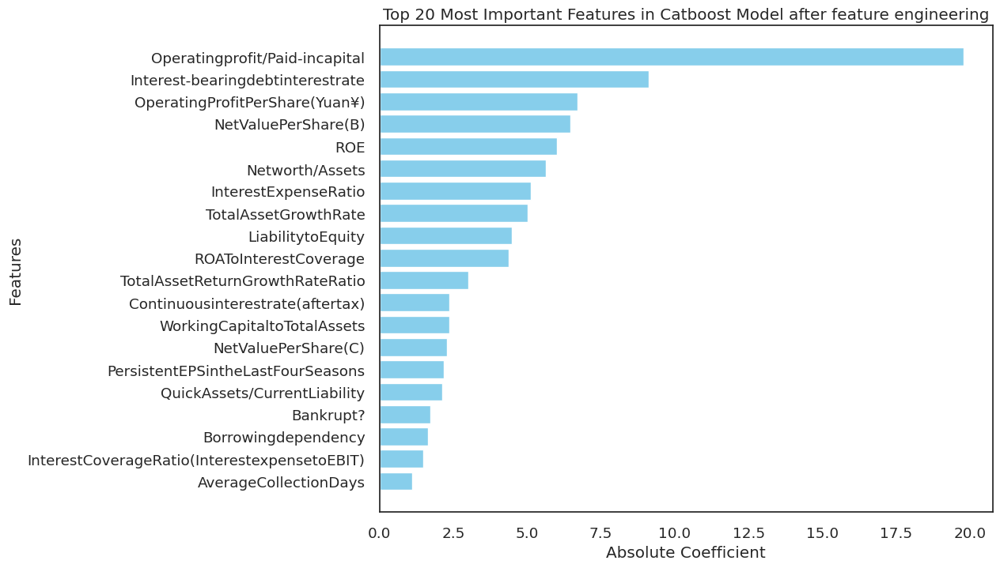

In [ ]:
coefficients = best_cb.feature_importances_
feature_names = X_test_fe_df.columns
features_dict = dict(zip(feature_names, np.abs(coefficients)))
sorted_features = sorted(features_dict.items(), key=lambda x: x[1], reverse=True)

top_features = sorted_features[:20]
top_feature_names = [i[0] for i in top_features]
top_feature_importances = [i[1] for i in top_features]

plt.figure(figsize=(10, 8))
plt.barh(top_feature_names, top_feature_importances, color='skyblue')
plt.xlabel('Absolute Coefficient')
plt.ylabel('Features')
plt.title('Top 20 Most Important Features in Catboost Model after feature engineering')
plt.gca().invert_yaxis()
plt.show()

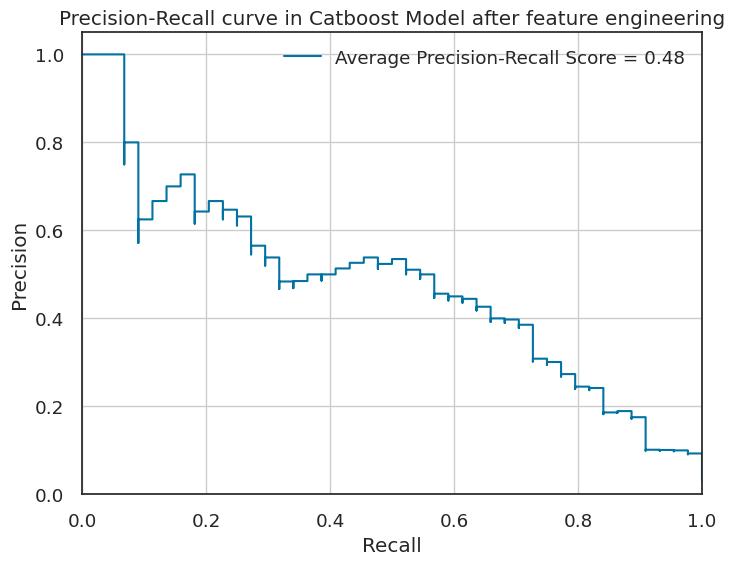

In [ ]:
y_scores_fe_cb = best_cb.predict_proba(X_test_fe)[:, 1]
precision, recall, thresholds = precision_recall_curve(y_test_fe, y_scores_fe_cb)
average_precision_fe = average_precision_score(y_test_fe, y_scores_fe_cb)

plt.figure(figsize=(8, 6))
plt.step(recall, precision, where='post', label=f'Average Precision-Recall Score = {average_precision_fe:0.2f}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('Precision-Recall curve in Catboost Model after feature engineering'.format(average_precision_fe))
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

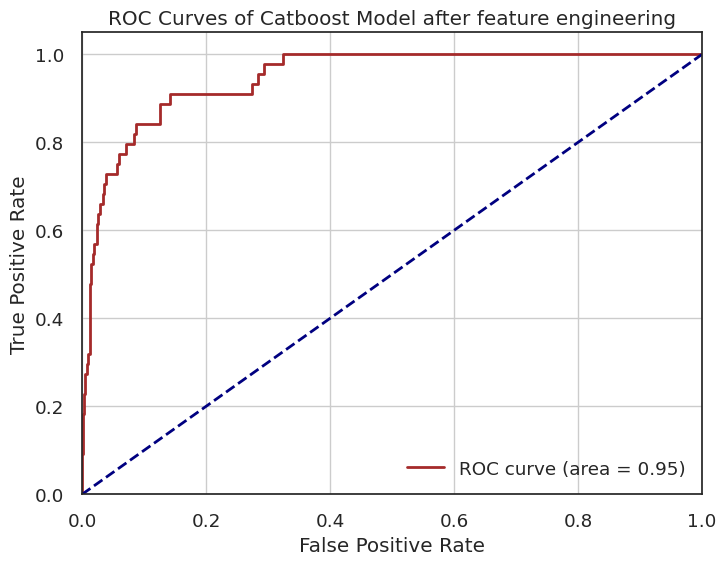

In [ ]:
y_scores_fe_cb = best_cb.predict_proba(X_test_fe)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test_fe, y_scores_fe_cb)
roc_auc_fe = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='brown', lw=2, label=f'ROC curve (area = {roc_auc_fe:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves of Catboost Model after feature engineering')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()